In [55]:
import os
import numpy as np
import nibabel as nib
from scipy.stats import scoreatpercentile, linregress
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score
from scipy.stats import pearsonr, spearmanr
from scipy.stats import gaussian_kde
from scipy import stats
from statsmodels.stats.multitest import multipletests

# Functions

## Get means

In [56]:
def hist_spearman(patientlist, ses, vasclabel):
    path = "/home/bpereira/func/"
    restpath = f"{ses}/{ses}-proc.feat/maps_to_corr/"
    maps = 2
    happy_nb = 9
    angry_nb = 9
    visual_nb = 17
    #numb_bins = 15
    Nbin_subjectHappy = np.zeros((len(patientlist), happy_nb, maps))
    Nbin_subjectAngry = np.zeros((len(patientlist), angry_nb, maps))
    Nbin_subjectVisual = np.zeros((len(patientlist), visual_nb, maps))

    mean_value_parcels_vascH = np.zeros((len(patientlist),happy_nb,maps))
    mean_value_parcels_vascA = np.zeros((len(patientlist),angry_nb,maps))
    mean_value_parcels_vascV = np.zeros((len(patientlist),visual_nb,maps))

    for sub in patientlist:

        happy_path = os.path.join(path,sub,restpath,f"{sub}_{ses}_mapCOPE8_smoothed8.nii")
        angry_path = os.path.join(path,sub,restpath,f"{sub}_{ses}_mapCOPE9_smoothed8.nii")
        vis_path = os.path.join(path,sub,restpath,f"{sub}_{ses}_mapCOPE4_smoothed8.nii")

        maskhappy_path = "/home/bpereira/func/HL/with_EMPs/randomiseGM_EMP/GM_COPE8_EMP_thr95.nii.gz"
        maskangry_path = "/home/bpereira/func/HL/with_EMPs/randomiseGM_EMP/GM_COPE9_EMP_thr95.nii.gz"
        maskvis_path = "/home/bpereira/func/HL/with_EMPs/randomiseGM_EMP/GM_COPE4_EMP_thr95.nii.gz"

        if vasclabel=='ASL':
            vasc_path = os.path.join("/home/mig_n2treatdata/derivatives/perf-preproc/",sub,ses,"smoothed8_perfusion_MNI.nii")
        else:
            vasc_path = os.path.join("/home/mig_n2treatdata/derivatives/func-preproc/func-task_breathhold/",sub,ses,"smoothed8_CVR_single_delay6_deltapet_thrvar_MNI.nii")
            #print("entered")
    
        # load data
        happynii = nib.load(happy_path)
        happy = happynii.get_fdata()

        angrynii = nib.load(angry_path)
        angry = angrynii.get_fdata()

        visnii = nib.load(vis_path)
        vis = visnii.get_fdata()

        maskhappynii = nib.load(maskhappy_path)
        maskhappy = maskhappynii.get_fdata()

        maskangrynii = nib.load(maskangry_path)
        maskangry = maskangrynii.get_fdata()

        maskvisnii = nib.load(maskvis_path)
        maskvis = maskvisnii.get_fdata()

        vascnii = nib.load(vasc_path)
        vasc = vascnii.get_fdata()

        #print(happy.shape, angry.shape, vis.shape, vasc.shape)

        # cut due to ASLs FOV

        cuthappy = happy[:,:,16:68]
        cutangry = angry[:,:,16:68]
        cutvis = vis[:,:,16:68]
        cutmaskh = maskhappy[:,:,16:68]
        cutmaska = maskangry[:,:,16:68]
        cutmaskv = maskvis[:,:,16:68]

        cutvasc = vasc[:,:,16:68]

        # flatten

        flatcuthappy = cuthappy.flatten()
        flatcutangry = cutangry.flatten()
        flatcutvis = cutvis.flatten()

        flatcutvasc = cutvasc.flatten()

        # keep only areas from the mask

        maskhappy_ind = np.where(cutmaskh.flatten()==1)
        maskangry_ind = np.where(cutmaska.flatten()==1)
        maskvis_ind = np.where(cutmaskv.flatten()==1)

        # remove outliers from vasc maps

        qvasc1 = scoreatpercentile(flatcutvasc,1)
        qvasc99 = scoreatpercentile(flatcutvasc,99)

        # find index of non outliers

        vasc_non_outliers_ind = np.where((flatcutvasc > qvasc1) & (flatcutvasc < qvasc99))

        # keep only non outliers from neuronal and vasc maps and areas from the mask

        commonhappy_nonoutliers_mask_ind = np.intersect1d(vasc_non_outliers_ind,maskhappy_ind)
        commonangry_nonoutliers_mask_ind = np.intersect1d(vasc_non_outliers_ind,maskangry_ind)
        commonvis_nonoutliers_mask_ind = np.intersect1d(vasc_non_outliers_ind,maskvis_ind)

        if vasclabel == 'CVR':
            non_zero = np.where(flatcutvasc > 0)

        # select only common voxels

        if vasclabel == 'ASL':

            flatfinalhappy= flatcuthappy[commonhappy_nonoutliers_mask_ind]
            flatfinalangry = flatcutangry[commonangry_nonoutliers_mask_ind]
            flatfinalvis = flatcutvis[commonvis_nonoutliers_mask_ind]

            flatfinalvaschappy = flatcutvasc[commonhappy_nonoutliers_mask_ind]
            flatfinalvascangry = flatcutvasc[commonangry_nonoutliers_mask_ind]
            flatfinalvascvis = flatcutvasc[commonvis_nonoutliers_mask_ind]

        if vasclabel == 'CVR':
            flatfinalvaschappy = flatcutvasc[np.intersect1d(maskhappy_ind,non_zero)]
            flatfinalvascangry = flatcutvasc[np.intersect1d(maskangry_ind,non_zero)]
            flatfinalvascvis = flatcutvasc[np.intersect1d(maskvis_ind,non_zero)]

            flatfinalhappy= flatcuthappy[np.intersect1d(maskhappy_ind,non_zero)]
            flatfinalangry = flatcutangry[np.intersect1d(maskangry_ind,non_zero)]
            flatfinalvis = flatcutvis[np.intersect1d(maskvis_ind,non_zero)]


        img_metricH = np.column_stack((flatfinalhappy, flatfinalvaschappy))
        img_metricA = np.column_stack((flatfinalangry,flatfinalvascangry))
        img_metricV = np.column_stack((flatfinalvis, flatfinalvascvis))

        all_img = [img_metricH, img_metricA, img_metricV]

        for img_metric_fin in all_img:
            voxels_inbinhappy = {}
            voxels_inbinangry = {}
            voxels_inbinvis = {}
            plt.figure(figsize=(15, 6))  # Create a new figure for each image with larger size
            for m in range(maps):
                if all_img.index(img_metric_fin) == 0:
                    Nbin, edges = np.histogram(img_metric_fin[:, m], bins=happy_nb)
                    Nbin_subjectHappy[patientlist.index(sub), :, m] = Nbin

                    for p in range(happy_nb - 1):
                        voxels_inbinhappy[(p, m)] = np.where((img_metric_fin[:, m] >= edges[p]) & (img_metric_fin[:, m] < edges[p + 1]))[0]
                    
                    voxels_inbinhappy[(happy_nb - 1, m)] = np.where(img_metric_fin[:, m] >= edges[happy_nb - 1])[0]
                    #print(voxels_inbinhappy)

                    plt.subplot(1, 2, m + 1)
                    plt.hist(img_metric_fin[:, m], bins=happy_nb)
                    plt.ylabel('Number of voxels')
                    plt.xlabel(f'Metric {m} in {all_img.index(img_metric_fin)}')
                    plt.title(f'Subject {sub}')
                    plt.tight_layout()

                elif all_img.index(img_metric_fin) == 1:
                    Nbin, edges = np.histogram(img_metric_fin[:, m], bins=angry_nb)
                    Nbin_subjectAngry[patientlist.index(sub), :, m] = Nbin

                    for p in range(angry_nb - 1):
                        voxels_inbinangry[(p, m)] = np.where((img_metric_fin[:, m] >= edges[p]) & (img_metric_fin[:, m] < edges[p + 1]))[0]
                    
                    voxels_inbinangry[(angry_nb - 1, m)] = np.where(img_metric_fin[:, m] >= edges[angry_nb - 1])[0]

                    plt.subplot(1, 2, m + 1)
                    plt.hist(img_metric_fin[:, m], bins=angry_nb)
                    plt.ylabel('Number of voxels')
                    plt.xlabel(f'Metric {m} in {all_img.index(img_metric_fin)}')
                    plt.title(f'Subject {sub}')
                    plt.tight_layout()

                else:
                    Nbin, edges = np.histogram(img_metric_fin[:, m], bins=visual_nb)
                    Nbin_subjectVisual[patientlist.index(sub), :, m] = Nbin

                    for p in range(visual_nb - 1):
                        voxels_inbinvis[(p, m)] = np.where((img_metric_fin[:, m] >= edges[p]) & (img_metric_fin[:, m] < edges[p + 1]))[0]
                    
                    voxels_inbinvis[(visual_nb - 1, m)] = np.where(img_metric_fin[:, m] >= edges[visual_nb - 1])[0]

                    plt.subplot(1, 2, m + 1)
                    plt.hist(img_metric_fin[:, m], bins=visual_nb)
                    plt.ylabel('Number of voxels')
                    plt.xlabel(f'Metric {m} in {all_img.index(img_metric_fin)}')
                    plt.title(f'Subject {sub}')
                    plt.tight_layout()

            plt.show()

            if all_img.index(img_metric_fin) == 0:
                for p in range(happy_nb):
                    # metricas happy parceladas pelo vasc (na primeira posição temos o mapa neuronal parcelado por vasc,
                    # na segunda posição temos o vasc parcelado por si proprio)
                    mean_value_parcels_vascH[patientlist.index(sub),p,:] = np.mean(img_metric_fin[voxels_inbinhappy[(p, 1)], :maps], axis=0)
            elif all_img.index(img_metric_fin) == 1:        
                for p in range(angry_nb):
                    # metricas angry parceladas pelo vasc (na primeira posição temos o mapa neuronal parcelado por vasc,
                    # na segunda posição temos o vasc parcelado por si proprio)
                    mean_value_parcels_vascA[patientlist.index(sub),p,:] = np.mean(img_metric_fin[voxels_inbinangry[(p, 1)], :maps], axis=0)
            else: 
                for p in range(visual_nb):
                    # metricas angry parceladas pelo vasc (na primeira posição temos o mapa neuronal parcelado por vasc,
                    # na segunda posição temos o vasc parcelado por si proprio)
                    mean_value_parcels_vascV[patientlist.index(sub),p,:] = np.mean(img_metric_fin[voxels_inbinvis[(p, 1)], :maps], axis=0)
               
               
               # Plot histogram
                #kde = gaussian_kde(img_metric_fin[:, m])
                #xi = np.linspace(min(img_metric_fin[:, m]), max(img_metric_fin[:, m]), 100)
                #f = kde(xi)

    return Nbin_subjectHappy, Nbin_subjectAngry, Nbin_subjectVisual, mean_value_parcels_vascH, mean_value_parcels_vascA, mean_value_parcels_vascV



## Calculate Spearman coefficients

In [57]:
def testhappy(meanhappy):
    mean_vasc = meanhappy[:,:,1]
    mean_neuro = meanhappy[:,:,0]

    spearmancoefs = []

    # for each patient
    for i in range(meanhappy.shape[0]):
        xvasc = mean_vasc[i,:] # all bins means for that subject
        #print(f"xvasc for {i}: {xvasc}")
        yneuro = mean_neuro[i,:]
        #print(f"yneuro for {i}: {yneuro}")

        s_coef, s_pval = spearmanr(xvasc, yneuro)
        #print(f"scoef for {i}: {s_coef}")

        spearmancoefs += [s_coef]
    return spearmancoefs

In [58]:
def calc_spearman(means):
    all_spearman = [] # order: happy, angry, vis
    for mean in means:
        mean_vasc = mean[:,:,1]
        mean_neuro = mean[:,:,0]

        spearmancoefs = []

        # for each patient
        for i in range(mean.shape[0]):
            xvasc = mean_vasc[i,:] # all bins means for that subject
            #print(f"xvasc for {i} netowrk {means.index(mean)}: {xvasc}")
            yneuro = mean_neuro[i,:]
            #print(f"yneuro for {i} netowrk {means.index(mean)}: {yneuro}")

            s_coef, s_pval = spearmanr(xvasc, yneuro)
            #print(f"scoef for {i} netowrk {means.index(mean)}: {s_coef}")

            spearmancoefs += [s_coef]

        all_spearman += [spearmancoefs]

    return all_spearman

## Scatter plot

In [59]:
def scatter(eachmean, net, vasc, PorS, session):
    mean_vasc = eachmean[:,:,1]
    mean_neuro = eachmean[:,:,0]

    plt.figure()
    # for each patient
    for i in range(eachmean.shape[0]):
        xvasc = mean_vasc[i,:]
        yneuro = mean_neuro[i,:]
        plt.scatter(xvasc,yneuro)
        plt.xlabel(f"{vasc}")
        plt.ylabel(f"{net}")
        plt.title(f"All {PorS} {vasc} vs {net} ({session})")

        plt.show
    
        


## Boxplots

In [60]:
def boxplots(coefflist, net, metric):
    ticks = ['Midcycle', 'Premenstrual', 'Interictal', 'Preictal', 'Ictal', 'Postictal']

    plt.figure(figsize=(10,6))
    boxprops = dict(linewidth=2.0)
    medianprops = dict(linewidth=2.0)
    whiskerprops = dict(linewidth=2.0)
    capprops = dict(linewidth=2.0)
    flierprops = dict(marker='o', markersize=5, linestyle='none')
    
    # Create the boxplot with custom properties
    bp = plt.boxplot(coefflist, widths=0.4,
                boxprops=boxprops, medianprops=medianprops,
                whiskerprops=whiskerprops, capprops=capprops,
                flierprops=flierprops)
    plt.xticks([1,2,3,4,5,6], ticks, fontsize=12)
    plt.yticks(fontsize=12)
    plt.ylabel('Spearman Coefficient', fontsize=14)
    plt.ylim(-1,1)

    for spine in plt.gca().spines.values():
        spine.set_linewidth(2)

    plt.title(f'Correlation Between {net} and {metric} \n(Histogram Parcellation)', fontsize=16)

    # Add counts above each boxplot
    for i, data in enumerate(coefflist, start=1):
        count = len(data)
        plt.text(i, -0.8, f'n={count}', ha='center', va='bottom', fontsize=12)

    plt.show()

In [61]:
def boxplots2_spearman(spearmanlist, net, metric):
    ticks = ['Midcycle', 'Premenstrual', 'Interictal', 'Preictal', 'Ictal', 'Postictal']

    plt.figure(figsize=(10,6))
    boxprops = dict(linewidth=2.0)
    medianprops = dict(linewidth=2.0)
    whiskerprops = dict(linewidth=2.0)
    capprops = dict(linewidth=2.0)
    flierprops = dict(marker='o', markersize=5, linestyle='none')
    
    # Create the boxplot with custom properties
    bp = plt.boxplot(spearmanlist, widths=0.4,
                boxprops=boxprops, medianprops=medianprops,
                whiskerprops=whiskerprops, capprops=capprops,
                flierprops=flierprops, patch_artist=True)  
    
    # Define colors for the borders and whiskers
    colors = ['green', 'green', 'red', 'red', 'red', 'red']
    
    # Color the boxes, whiskers, caps, and medians
    for i, (box, whisker_left, whisker_right, cap_left, cap_right, median) in enumerate(zip(
        bp['boxes'], bp['whiskers'][::2], bp['whiskers'][1::2], bp['caps'][::2], bp['caps'][1::2], bp['medians'])):
        
        color = colors[i]
        box.set_edgecolor(color)
        whisker_left.set_color(color)
        whisker_right.set_color(color)
        cap_left.set_color(color)
        cap_right.set_color(color)
        median.set_color(color)
        box.set_facecolor('none')  # Keep the inside of the box transparent

    plt.xticks([1, 2, 3, 4, 5, 6], ticks, fontsize=12, weight='bold')
    plt.yticks(fontsize=12, weight='bold')
    plt.ylabel('Spearman Coefficient', fontsize=14, weight='heavy')
    plt.ylim(-1.2, 1.2)

    for spine in plt.gca().spines.values():
        spine.set_linewidth(2)

    plt.title(f'Correlation Between {net} and {metric} \n(Histogram-based Parcellation)', fontsize=16, weight='heavy')

    # Add counts above each boxplot
    for i, data in enumerate(spearmanlist, start=1):
        count = len(data)
        plt.text(i, 1.05, f'n={count}', ha='center', va='bottom', fontsize=12, weight='bold')

        # Add scatter plot of data points
        y = data
        x = np.random.normal(i, 0.04, size=len(y))  # Add some jitter to the x-axis
        plt.scatter(x, y, alpha=0.6, color='gray', edgecolors='w', s=50)
        
    plt.show()



## Stats

In [62]:
def all_stats(data):
    results = []
    # results is PER ROI
    # Midcycle vs Interictal
    if stats.shapiro(data[0]).pvalue > 0.05 and stats.shapiro(data[2]).pvalue > 0.05:
        midvint = stats.ttest_ind(data[0], data[2])
        results.append(midvint.pvalue)
        print(f"Midcycle vs Interictal: p-value = {midvint.pvalue:.5f}")
    else:
        midvintwelch = stats.ttest_ind(data[0], data[2], equal_var=False)
        results.append(midvintwelch.pvalue)
        print(f"Midcycle vs Interictal (Welch): p-value = {midvintwelch.pvalue:.5f}")

    # Premenstrual vs Preictal
    if stats.shapiro(data[1]).pvalue > 0.05 and stats.shapiro(data[3]).pvalue > 0.05:
        premensvpreict = stats.ttest_ind(data[1], data[3])
        results.append(premensvpreict.pvalue)
        print(f"Premenstrual vs Preictal: p-value = {premensvpreict.pvalue:.5f}")
    else:
        premensvpreictwelch = stats.ttest_ind(data[1], data[3], equal_var=False)
        results.append(premensvpreictwelch.pvalue)
        print(f"Premenstrual vs Preictal (Welch): p-value = {premensvpreictwelch.pvalue:.5f}")

    # Premenstrual vs Ictal
    if stats.shapiro(data[1]).pvalue > 0.05 and stats.shapiro(data[4]).pvalue > 0.05:
        premensvict = stats.ttest_ind(data[1], data[4])
        results.append(premensvict.pvalue)
        print(f"Premenstrual vs Ictal: p-value = {premensvict.pvalue:.5f}")
    else:
        premensvictwelch = stats.ttest_ind(data[1], data[4], equal_var=False)
        results.append(premensvictwelch.pvalue)
        print(f"Premenstrual vs Ictal (Welch): p-value = {premensvictwelch.pvalue:.5f}")

    # Premenstrual vs Postictal
    if stats.shapiro(data[1]).pvalue > 0.05 and stats.shapiro(data[5]).pvalue > 0.05:
        premensvpostict = stats.ttest_ind(data[1], data[5])
        results.append(premensvpostict.pvalue)
        print(f"Premenstrual vs Postictal: p-value = {premensvpostict.pvalue:.5f}")
    else:
        premensvpostictwelch = stats.ttest_ind(data[1], data[5], equal_var=False)
        results.append(premensvpostictwelch.pvalue)
        print(f"Premenstrual vs Postictal (Welch): p-value = {premensvpostictwelch.pvalue:.5f}")

    # Midcycle vs Premenstrual
    if stats.shapiro(data[0]).pvalue > 0.05 and stats.shapiro(data[1]).pvalue > 0.05:
        midvpremens = stats.ttest_rel(data[0], data[1])
        results.append(midvpremens.pvalue)
        print(f"Midcycle vs Premenstrual: p-value = {midvpremens.pvalue:.5f}")
    else:
        midvpremenswilc = stats.wilcoxon(data[0], data[1])
        results.append(midvpremenswilc.pvalue)
        print(f"Midcycle vs Premenstrual (Wilcoxon): p-value = {midvpremenswilc.pvalue:.5f}")

    return results

In [63]:
def all_statsCVR(data):
    results = []
    # results is PER ROI


    # Midcycle vs Interictal
    if stats.shapiro(data[0]).pvalue > 0.05 and stats.shapiro(data[2]).pvalue > 0.05:
        midvint = stats.ttest_ind(data[0], data[2])
        results.append(midvint.pvalue)
        print(f"Midcycle vs Interictal: p-value = {midvint.pvalue:.5f}")
    else:
        midvintwelch = stats.ttest_ind(data[0], data[2], equal_var=False)
        results.append(midvintwelch.pvalue)
        print(f"Midcycle vs Interictal (Welch): p-value = {midvintwelch.pvalue:.5f}")

    # Premenstrual vs Preictal
    if stats.shapiro(data[1]).pvalue > 0.05 and stats.shapiro(data[3]).pvalue > 0.05:
        premensvpreict = stats.ttest_ind(data[1], data[3])
        results.append(premensvpreict.pvalue)
        print(f"Premenstrual vs Preictal: p-value = {premensvpreict.pvalue:.5f}")
    else:
        premensvpreictwelch = stats.ttest_ind(data[1], data[3], equal_var=False)
        results.append(premensvpreictwelch.pvalue)
        print(f"Premenstrual vs Preictal (Welch): p-value = {premensvpreictwelch.pvalue:.5f}")

    # Premenstrual vs Ictal
    if stats.shapiro(data[1]).pvalue > 0.05 and stats.shapiro(data[4]).pvalue > 0.05:
        premensvict = stats.ttest_ind(data[1], data[4])
        results.append(premensvict.pvalue)
        print(f"Premenstrual vs Ictal: p-value = {premensvict.pvalue:.5f}")
    else:
        premensvictwelch = stats.ttest_ind(data[1], data[4], equal_var=False)
        results.append(premensvictwelch.pvalue)
        print(f"Premenstrual vs Ictal (Welch): p-value = {premensvictwelch.pvalue:.5f}")

    # Premenstrual vs Postictal
    if stats.shapiro(data[1]).pvalue > 0.05 and stats.shapiro(data[5]).pvalue > 0.05:
        premensvpostict = stats.ttest_ind(data[1], data[5])
        results.append(premensvpostict.pvalue)
        print(f"Premenstrual vs Postictal: p-value = {premensvpostict.pvalue:.5f}")
    else:
        premensvpostictwelch = stats.ttest_ind(data[1], data[5], equal_var=False)
        results.append(premensvpostictwelch.pvalue)
        print(f"Premenstrual vs Postictal (Welch): p-value = {premensvpostictwelch.pvalue:.5f}")

    # Midcycle vs Premenstrual
    if stats.shapiro(data[0]).pvalue > 0.05 and stats.shapiro(data[1]).pvalue > 0.05:
        midvpremens = stats.ttest_ind(data[0], data[1]) # ind because not repeated measures for CVR
        results.append(midvpremens.pvalue)
        print(f"Midcycle vs Premenstrual: p-value = {midvpremens.pvalue:.5f}")
    else:
        midvpremenswelch = stats.ttest_ind(data[0], data[1],equal_var = False)
        results.append(midvpremenswelch.pvalue)
        print(f"Midcycle vs Premenstrual (Welch): p-value = {midvpremenswelch.pvalue:.5f}")

    return results


In [64]:
def find_common_ind(list1, list2):
    set2 = set(list2)
    
    common_indexes = [index for index, value in enumerate(list1) if value in set2]
    
    return common_indexes

def intersection(list1,list2):
    return [element for element in list1 if element in list2]

In [65]:
patients_interictal = ["sub-patient002","sub-patient003","sub-patient005","sub-patient006","sub-patient008","sub-patient009","sub-patient012","sub-patient013","sub-patient034","sub-patient038","sub-patient041","sub-patient043","sub-patient045"]
patients_preictal = ["sub-patient002","sub-patient003","sub-patient005","sub-patient006","sub-patient008","sub-patient009","sub-patient013","sub-patient034","sub-patient038","sub-patient041","sub-patient043","sub-patient045"]
patients_ictal = ["sub-patient001","sub-patient002","sub-patient003","sub-patient004","sub-patient005","sub-patient006","sub-patient008","sub-patient009","sub-patient013","sub-patient034","sub-patient038","sub-patient041","sub-patient045","sub-patient052"]
patients_postictal = ["sub-patient001","sub-patient002","sub-patient003","sub-patient005","sub-patient006","sub-patient008","sub-patient009","sub-patient012","sub-patient034","sub-patient038","sub-patient041", "sub-patient043","sub-patient045"]

patientsASL_interictal = ["sub-patient002","sub-patient003","sub-patient005","sub-patient006","sub-patient007","sub-patient008","sub-patient009","sub-patient012","sub-patient013","sub-patient034","sub-patient038","sub-patient041","sub-patient043","sub-patient045"]
patientsASL_preictal = ["sub-patient005","sub-patient006","sub-patient008","sub-patient009","sub-patient013", "sub-patient034","sub-patient038","sub-patient041","sub-patient043","sub-patient045"]
patientsASL_ictal = ["sub-patient001","sub-patient003","sub-patient004","sub-patient005","sub-patient006","sub-patient013","sub-patient034","sub-patient038","sub-patient041","sub-patient045","sub-patient052"]
patientsASL_postictal = ["sub-patient003","sub-patient005","sub-patient006","sub-patient008","sub-patient009","sub-patient012","sub-patient034", "sub-patient038","sub-patient041", "sub-patient043","sub-patient045"]

patientsCVR_interictal = ["sub-patient013","sub-patient034","sub-patient038","sub-patient041","sub-patient043","sub-patient045"]
patientsCVR_preictal = ["sub-patient013","sub-patient034","sub-patient038","sub-patient041","sub-patient043","sub-patient045"]
patientsCVR_ictal = ["sub-patient013","sub-patient034","sub-patient038","sub-patient041","sub-patient045","sub-patient052"] # !!! SUB-PATIENT004 NOT INCLUDED FOR NOW
patientsCVR_postictal = ["sub-patient034","sub-patient038","sub-patient041","sub-patient043","sub-patient045"]

controls_midcycle = ["sub-control019","sub-control020","sub-control025","sub-control026","sub-control027","sub-control028","sub-control029","sub-control030","sub-control031","sub-control033","sub-control044","sub-control046","sub-control048","sub-control049","sub-control051"]
controls_premens = ["sub-control019","sub-control020","sub-control025","sub-control026","sub-control027","sub-control028","sub-control029","sub-control030","sub-control031","sub-control033","sub-control044","sub-control046","sub-control048","sub-control049","sub-control051"]

ASLcontrols_midcycle = ["sub-control019","sub-control020","sub-control025","sub-control026","sub-control027","sub-control028","sub-control029","sub-control030","sub-control031","sub-control033","sub-control044","sub-control046","sub-control048","sub-control049","sub-control051"]
ASLcontrols_premens = ["sub-control019","sub-control020","sub-control025","sub-control026","sub-control027","sub-control028","sub-control029","sub-control030","sub-control031","sub-control033","sub-control044","sub-control046","sub-control048","sub-control049","sub-control051"]

CVRcontrols_midcycle = ["sub-control019","sub-control020","sub-control025","sub-control026","sub-control027","sub-control028","sub-control029","sub-control030","sub-control033","sub-control046","sub-control048","sub-control051"]
CVRcontrols_premens = ["sub-control019","sub-control020","sub-control025","sub-control026","sub-control027","sub-control028","sub-control029","sub-control030","sub-control031","sub-control033","sub-control044","sub-control046","sub-control048","sub-control051"]

In [66]:
neurowASL_interictal = intersection(patients_interictal,patientsASL_interictal)
interictalASL_ind = find_common_ind(patients_interictal,patientsASL_interictal) 

neurowASL_preictal = intersection(patients_preictal,patientsASL_preictal)
preictalASL_ind = find_common_ind(patients_preictal,patientsASL_preictal)

neurowASL_ictal = intersection(patients_ictal,patientsASL_ictal)
ictalASL_ind = find_common_ind(patients_ictal,patientsASL_ictal)

neurowASL_postictal = intersection(patients_postictal,patientsASL_postictal)
postictalASL_ind = find_common_ind(patients_postictal, patientsASL_postictal)

neurowCVR_interictal = intersection(patients_interictal,patientsCVR_interictal)
interictalCVR_ind = find_common_ind(patients_interictal,patientsCVR_interictal)

neurowCVR_preictal = intersection(patients_preictal,patientsCVR_preictal)
preictalCVR_ind = find_common_ind(patients_preictal,patientsCVR_preictal)

neurowCVR_ictal = intersection(patients_ictal,patientsCVR_ictal)
ictalCVR_ind = find_common_ind(patients_ictal,patientsCVR_ictal)

neurowCVR_postictal = intersection(patients_postictal,patientsCVR_postictal)
postictalCVR_ind = find_common_ind(patients_postictal,patientsCVR_postictal)

neurowASL_midcycle = intersection(controls_midcycle,ASLcontrols_midcycle)
midcycleASL_ind = find_common_ind(controls_midcycle,ASLcontrols_midcycle)

neurowASL_premens = intersection(controls_premens,ASLcontrols_premens)
premensASL_ind = find_common_ind(controls_premens,ASLcontrols_premens)

neurowCVR_midcycle = intersection(controls_midcycle,CVRcontrols_midcycle)
midcycleCVR_ind = find_common_ind(controls_midcycle,CVRcontrols_midcycle)

neurowCVR_premens = intersection(controls_premens,CVRcontrols_premens)
premensCVR_ind = find_common_ind(controls_premens,CVRcontrols_premens)

tentar mais bins p vis e menos p angry e happy

# Results

## Interictal

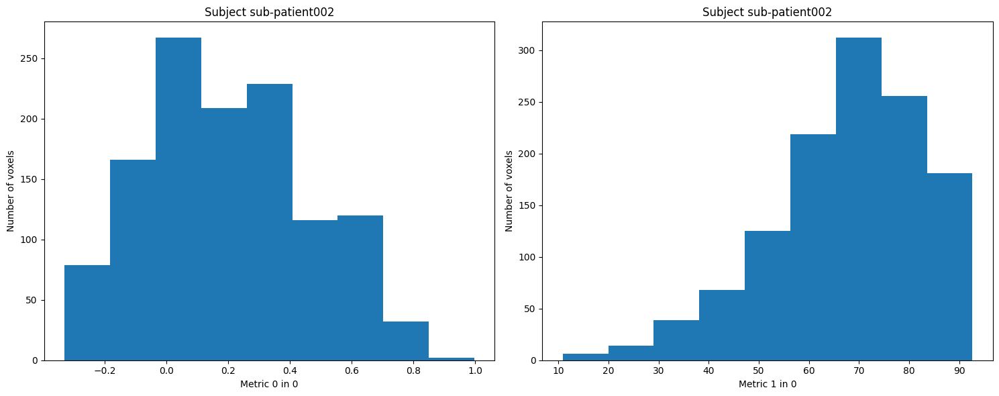

/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:134: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:151: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:163: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


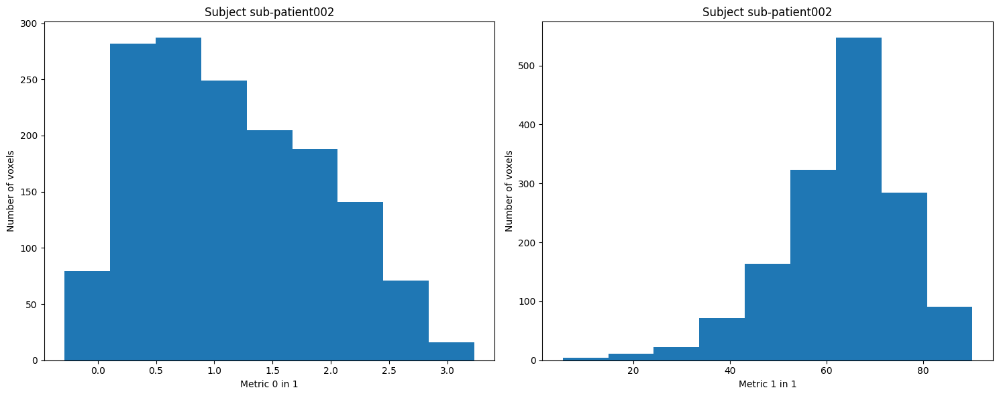

/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:185: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:190: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:179: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


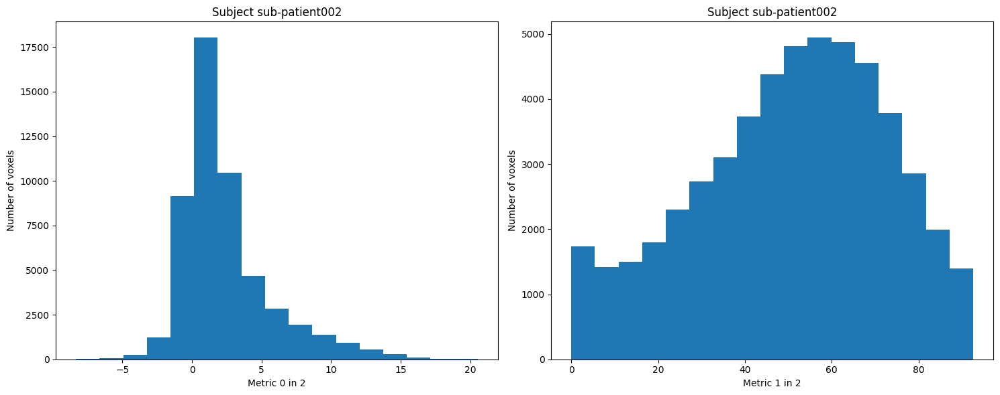

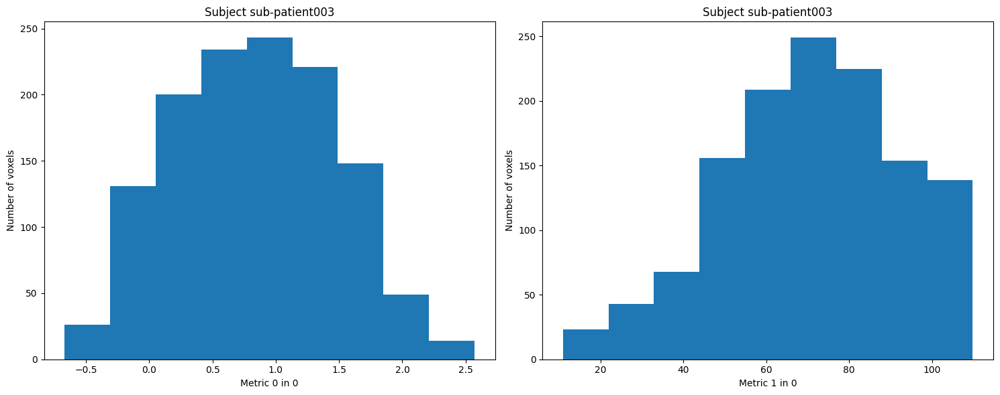

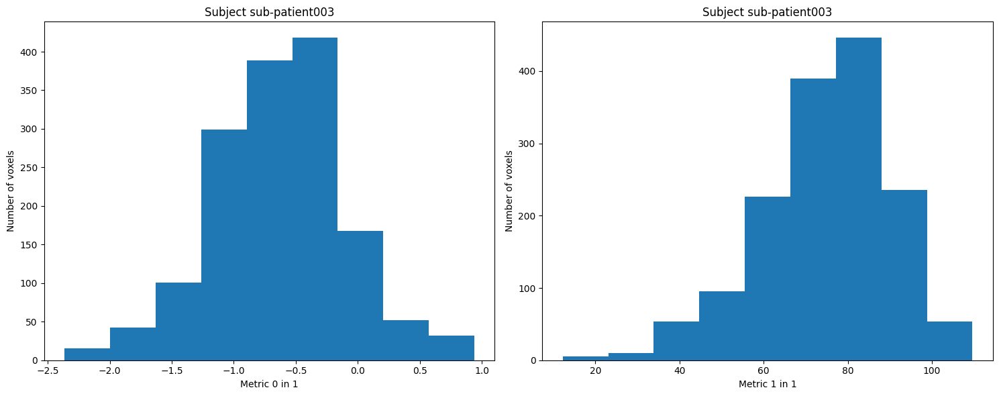

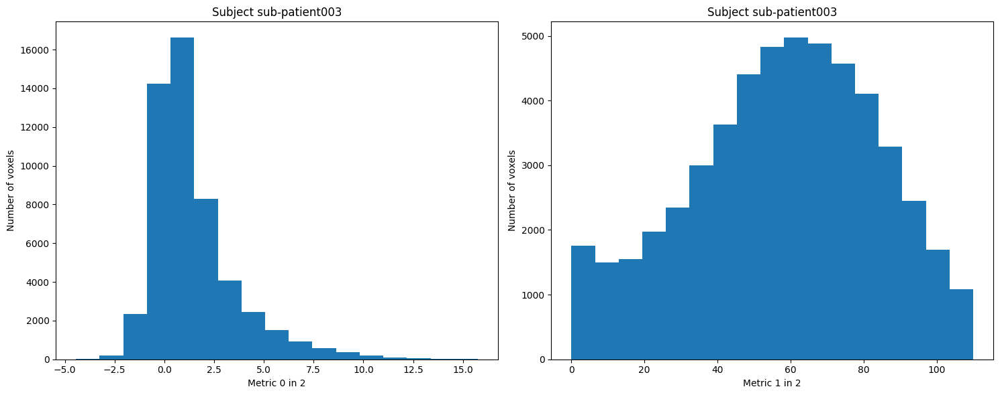

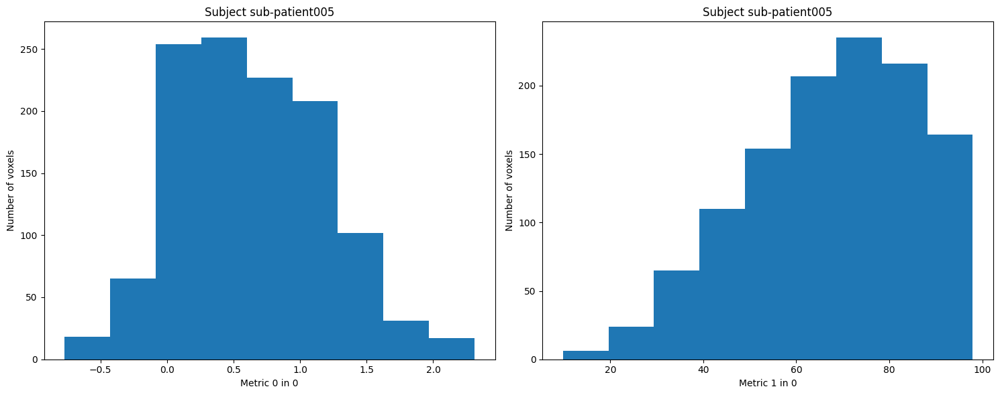

...

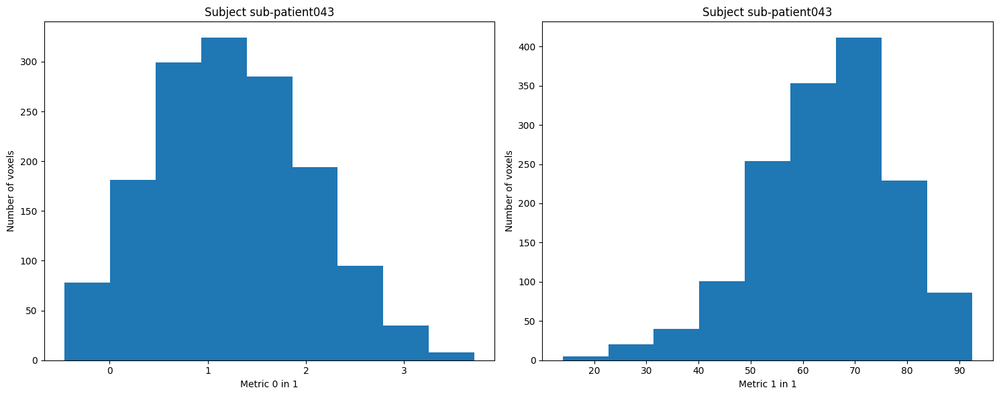

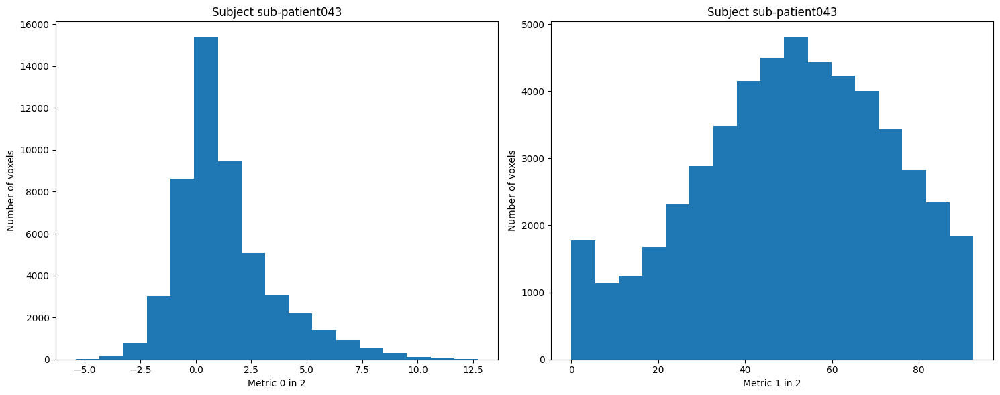

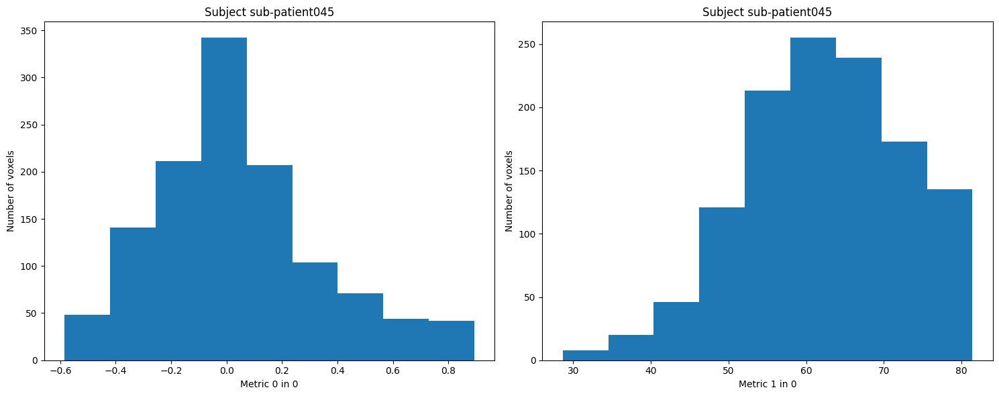

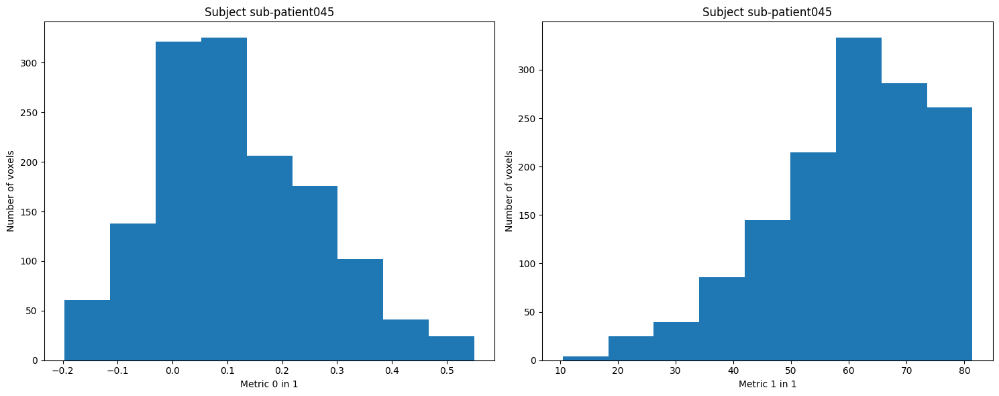

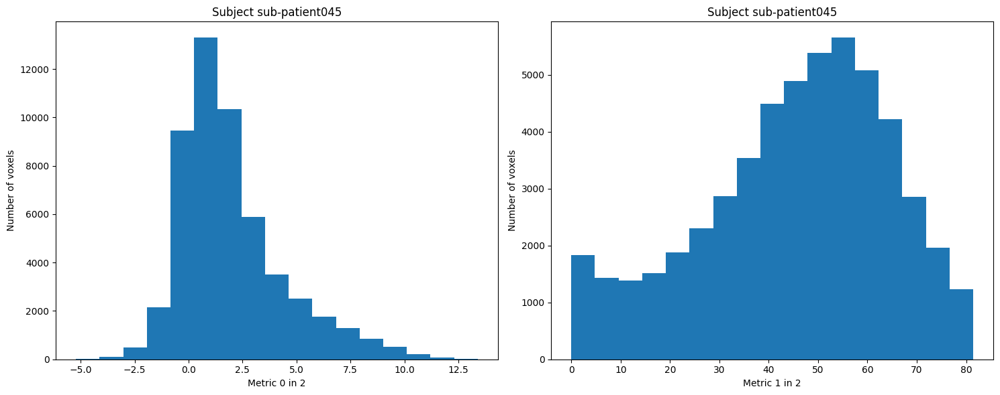

In [67]:
ASLnbinhappyint,ASLnbinangryint,ASLnbinvisint, ASLmeanhint, ASLmeanaint, ASLmeanvint = hist_spearman(neurowASL_interictal,"ses-interictal","ASL")

In [68]:
coefs_int = calc_spearman([ASLmeanhint,ASLmeanaint,ASLmeanvint])
coefs_intH = coefs_int[0]
coefs_intA = coefs_int[1]
coefs_intV = coefs_int[2]

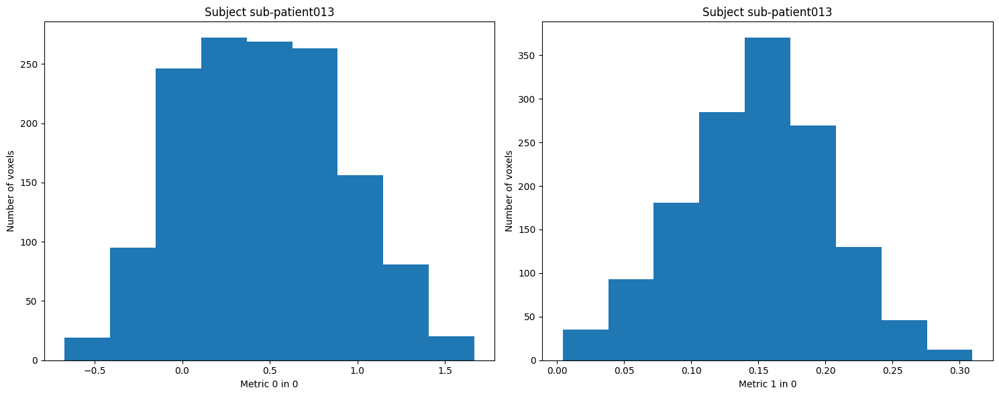

/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:134: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:151: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:163: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


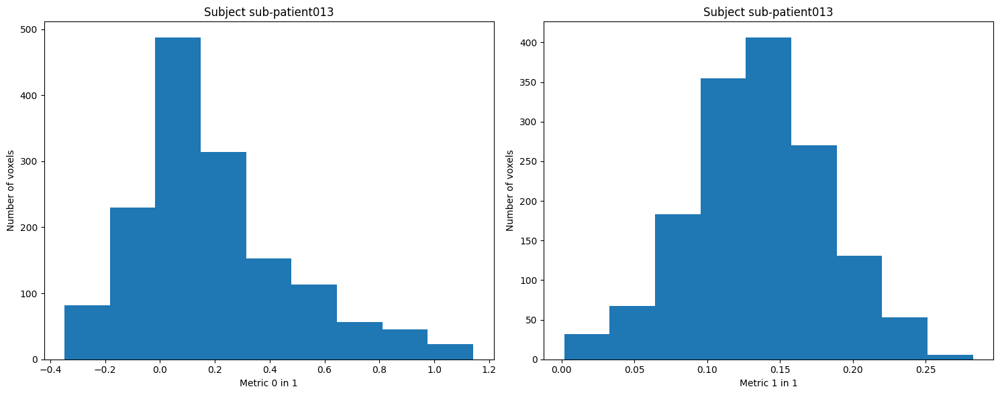

/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:185: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:190: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:179: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


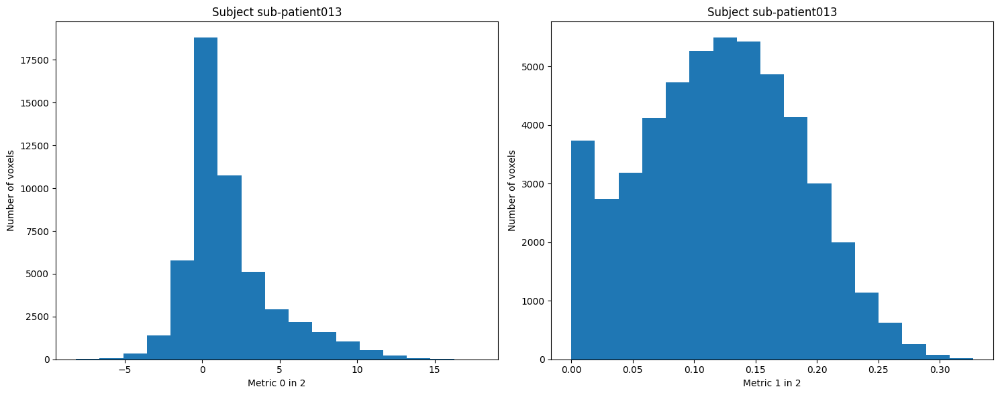

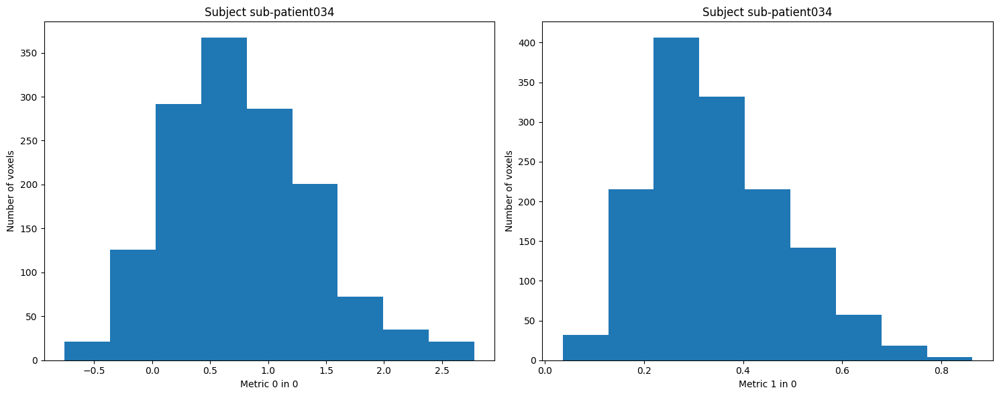

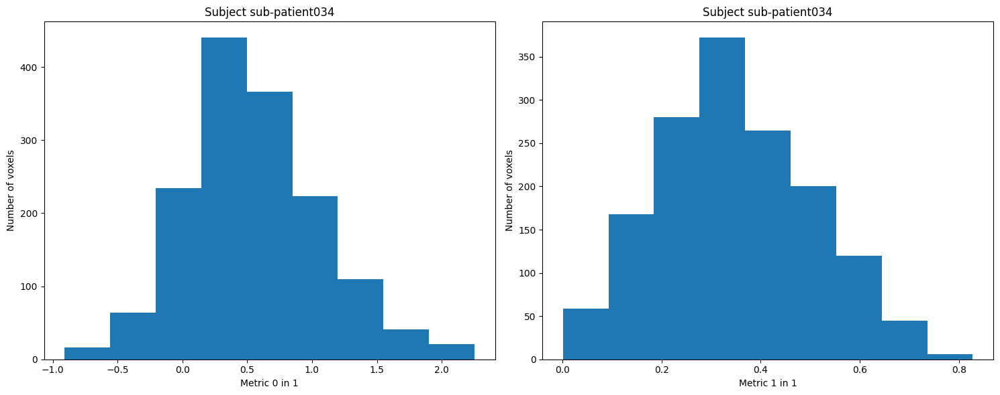

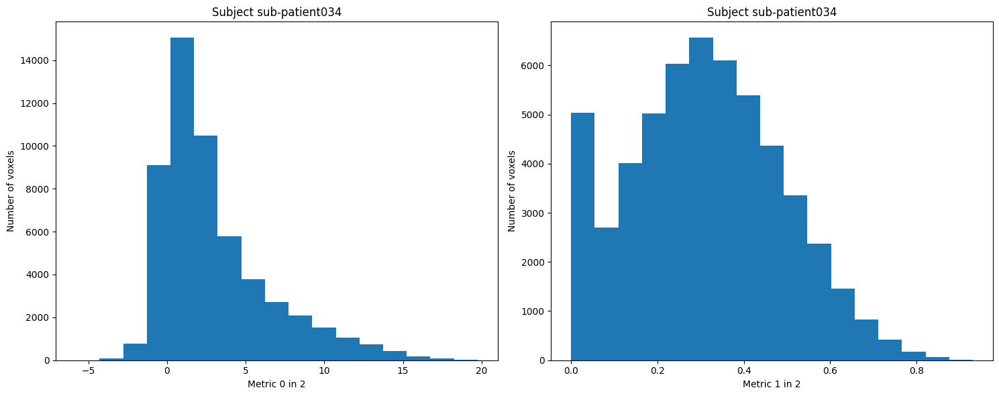

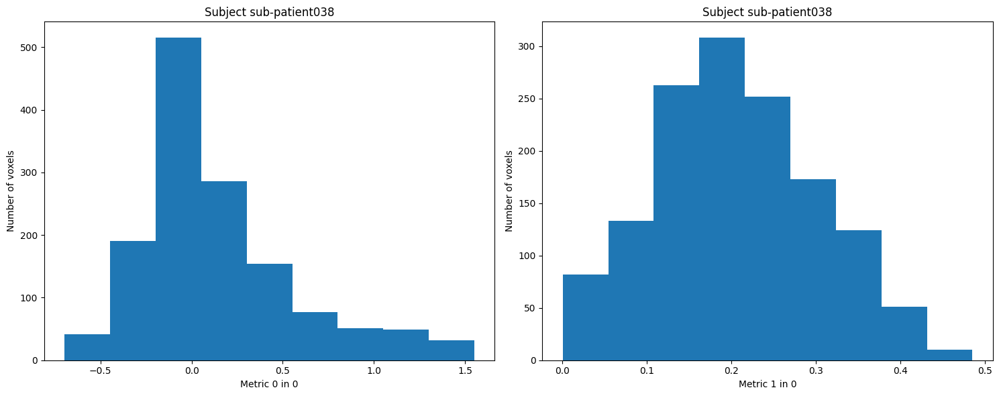

...

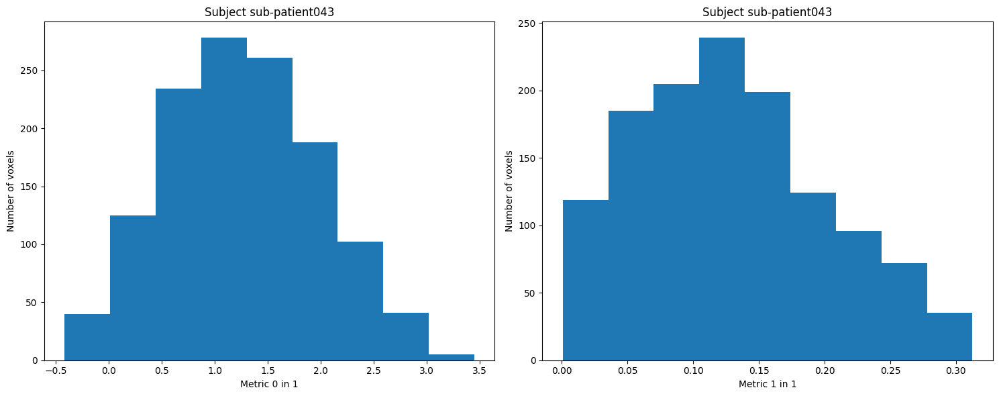

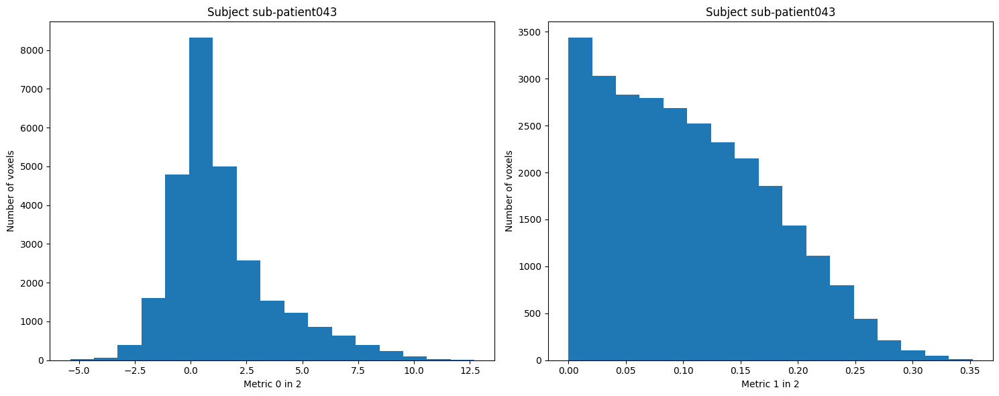

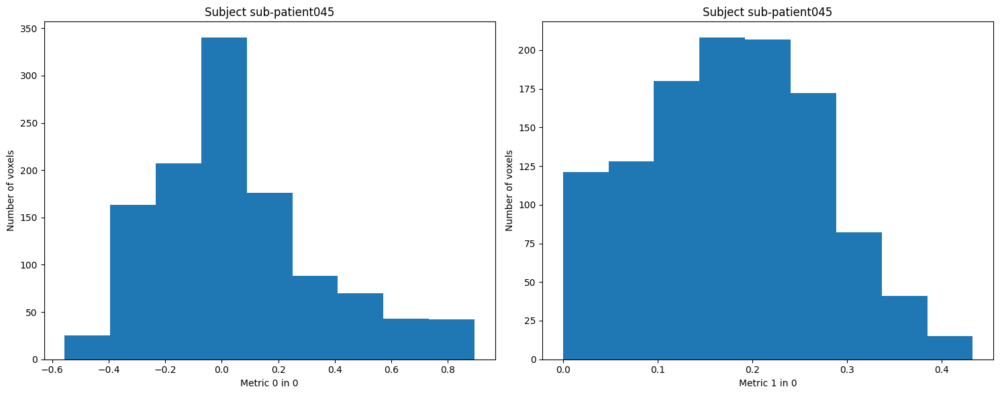

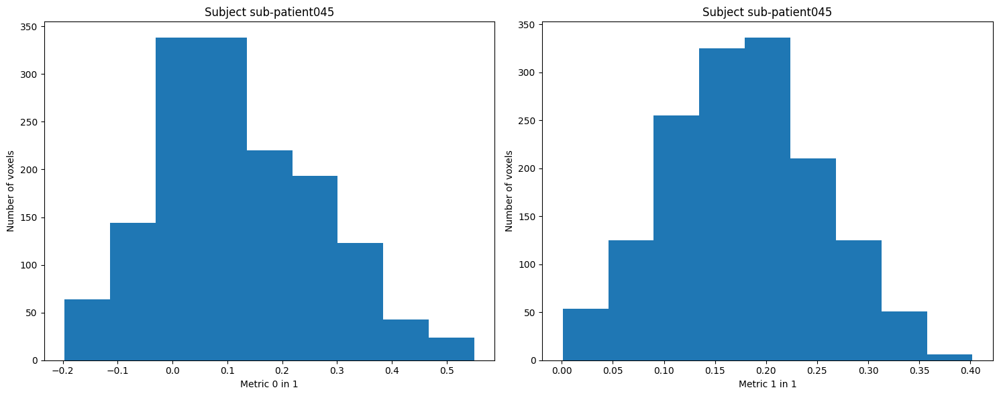

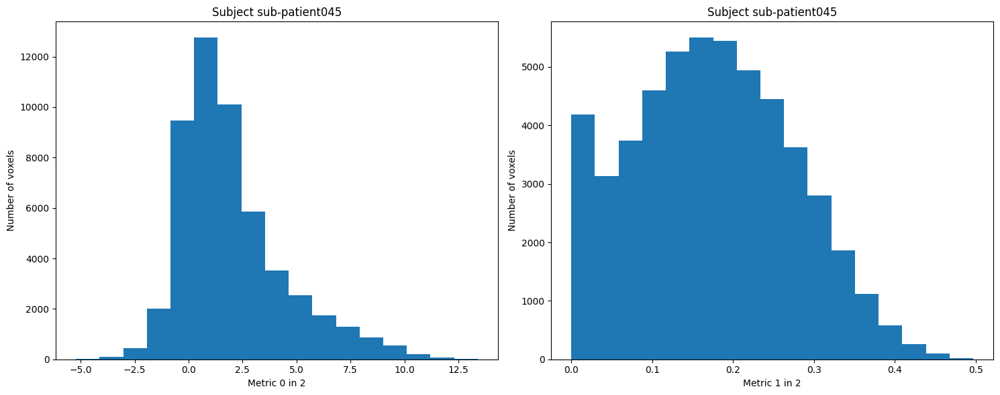

In [69]:
CVRnbinhappyint, CVRnbinangryint, CVRnbinvisint, CVRmeanhint, CVRmeanaint, CVRmeanvint = hist_spearman(neurowCVR_interictal, "ses-interictal", "CVR")

In [70]:
coefs_intCVR = calc_spearman([CVRmeanhint,CVRmeanaint,CVRmeanvint])
coefs_intHCVR = coefs_intCVR[0]
coefs_intACVR = coefs_intCVR[1]
coefs_intVCVR = coefs_intCVR[2]

## Preictal

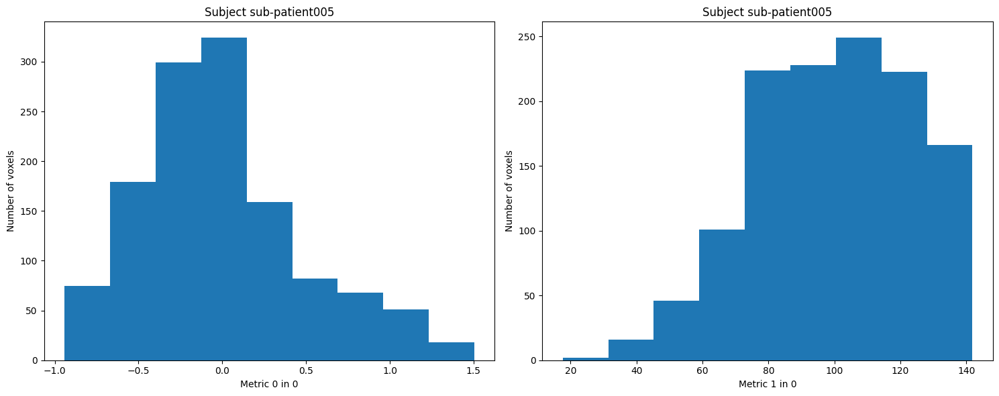

/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:134: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:151: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:163: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


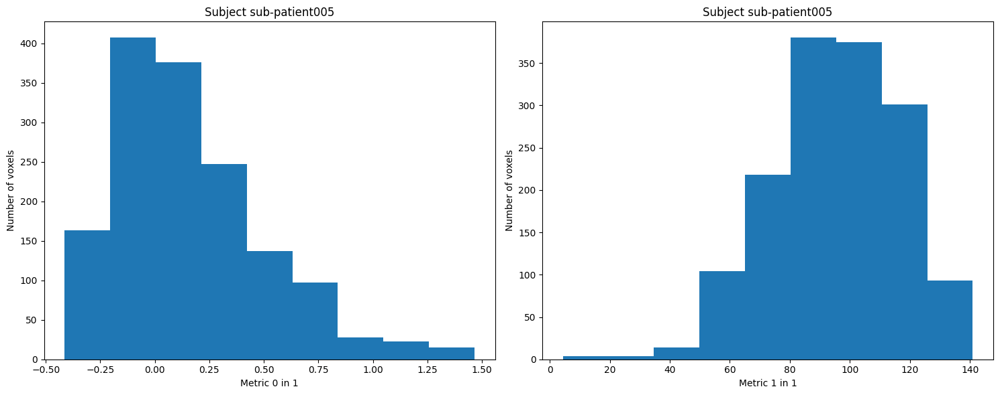

/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:185: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:190: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:179: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


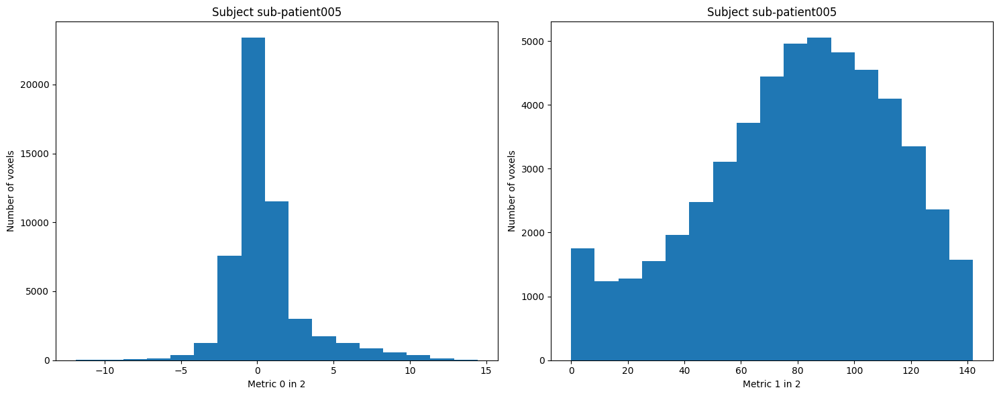

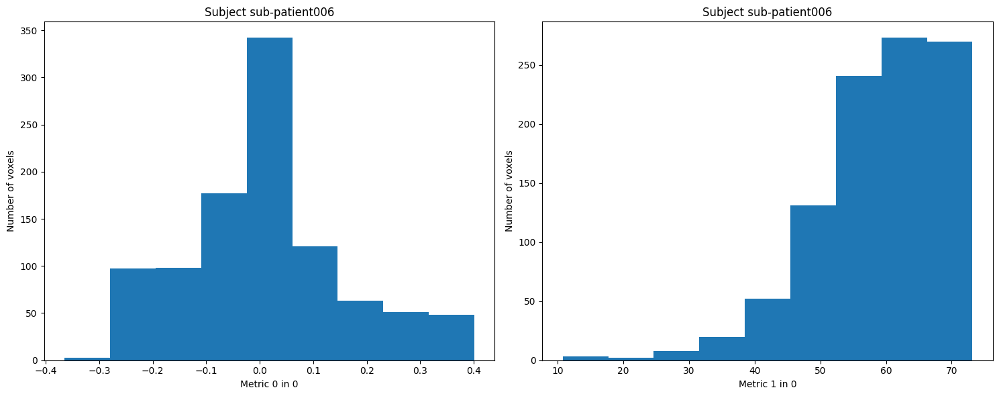

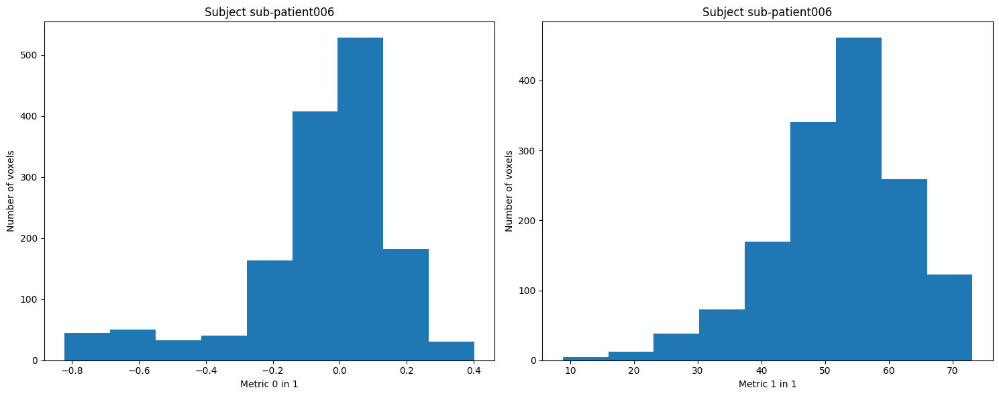

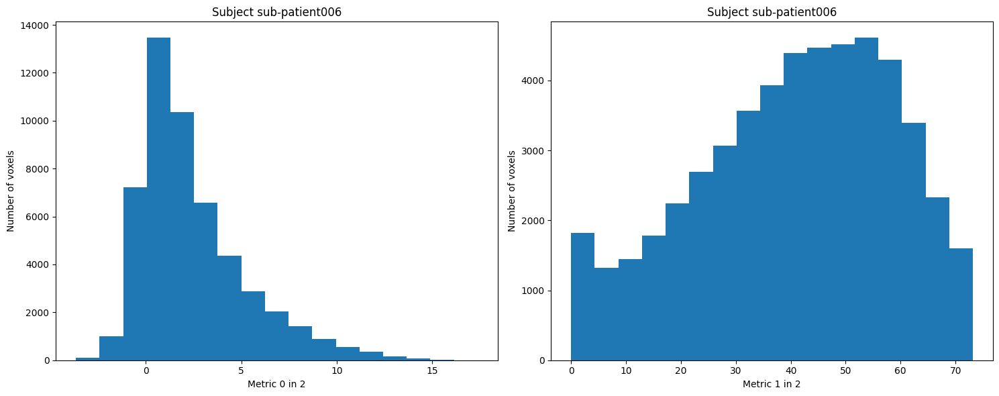

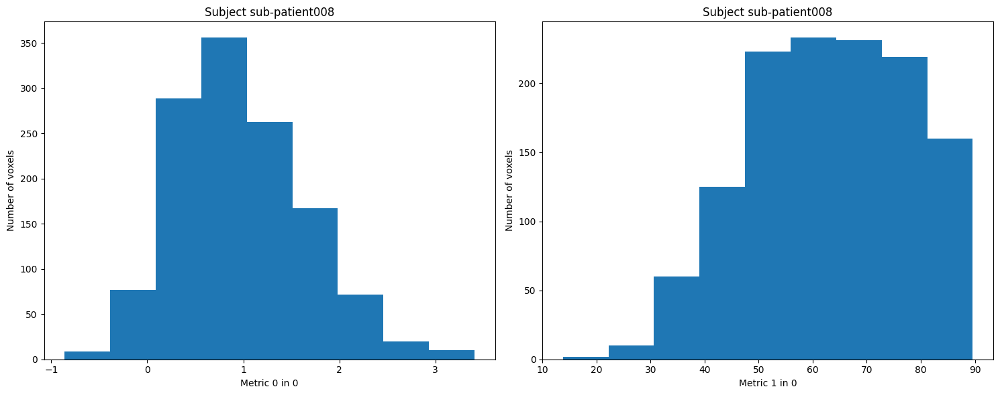

...

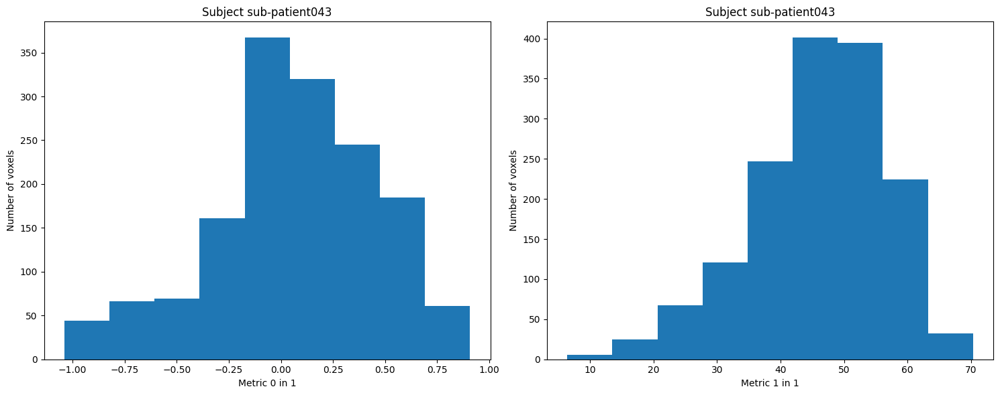

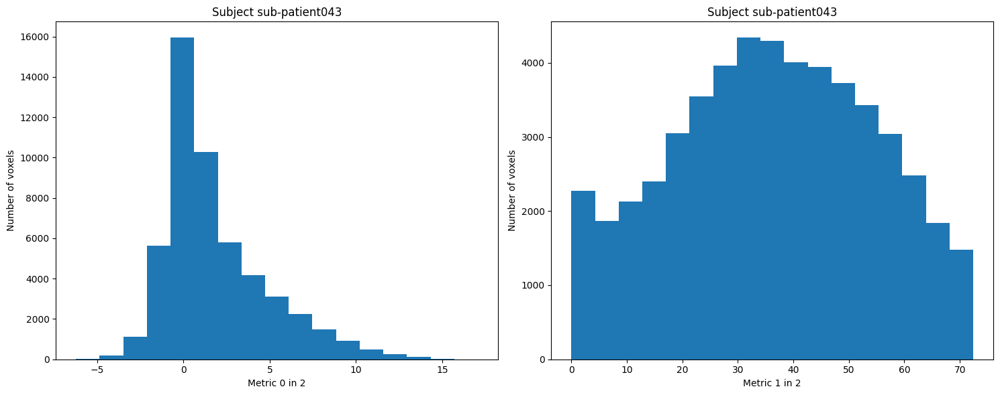

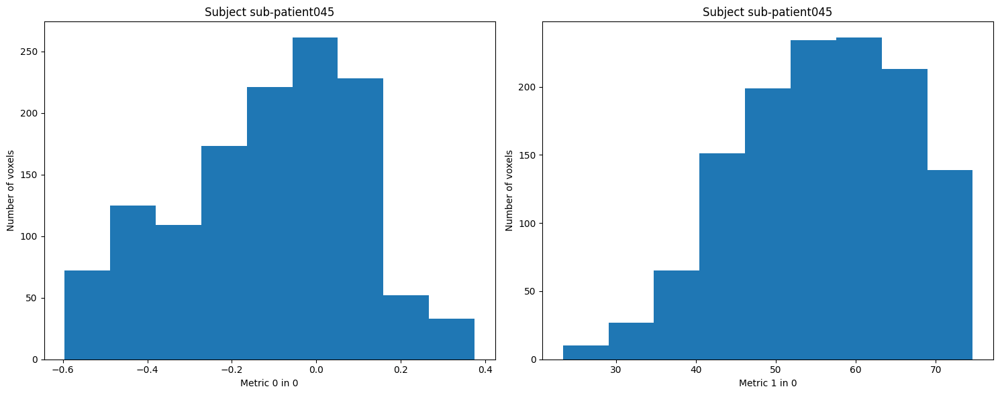

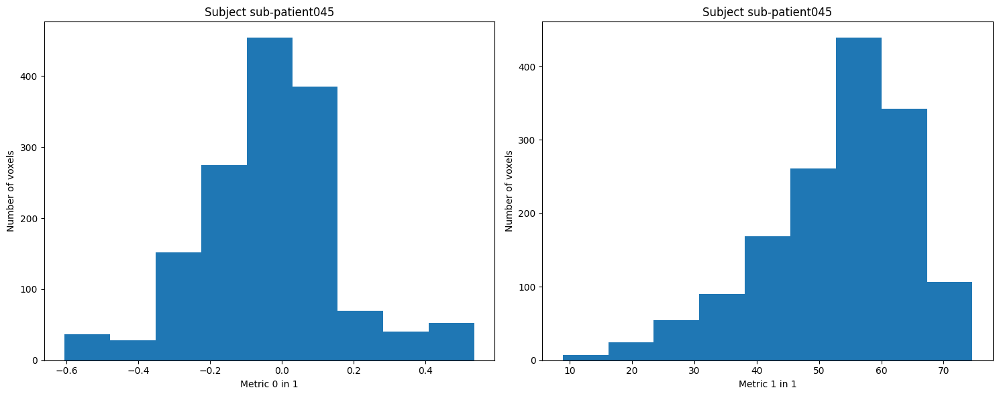

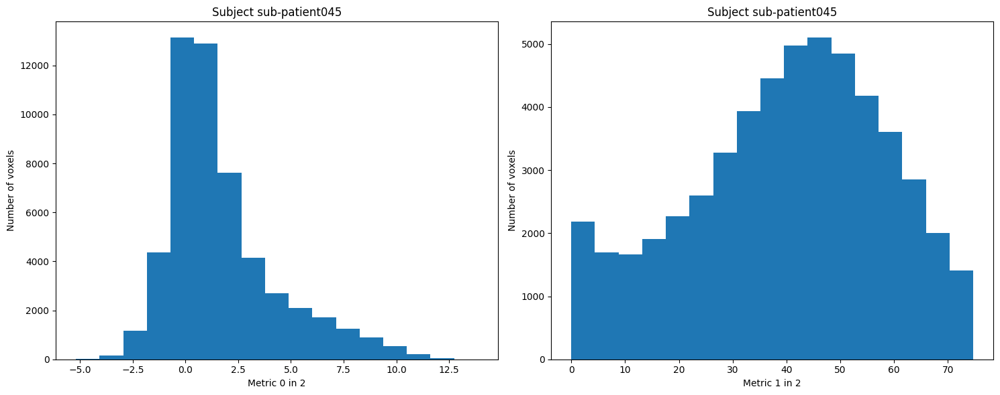

In [71]:
ASLnbinhappypreict,ASLnbinangrypreict,ASLnbinvispreict, ASLmeanhpreict, ASLmeanapreict, ASLmeanvpreict = hist_spearman(neurowASL_preictal,"ses-preictal","ASL")

In [72]:
coefs_preict = calc_spearman([ASLmeanhpreict,ASLmeanapreict,ASLmeanvpreict])
coefs_preictH = coefs_preict[0]
coefs_preictA = coefs_preict[1]
coefs_preictV = coefs_preict[2]

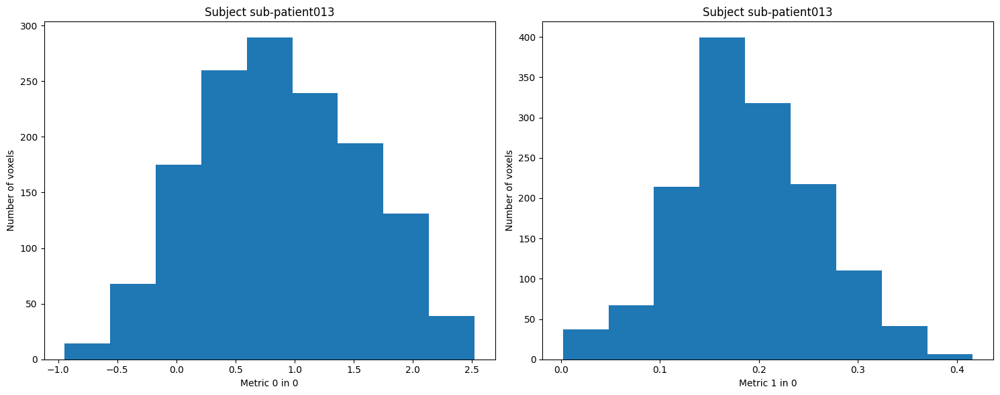

/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:134: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:151: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:163: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


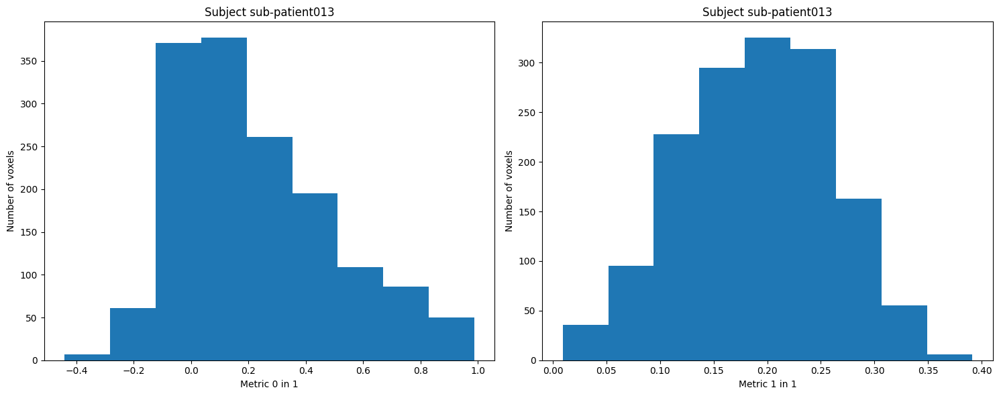

/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:185: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:190: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:179: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


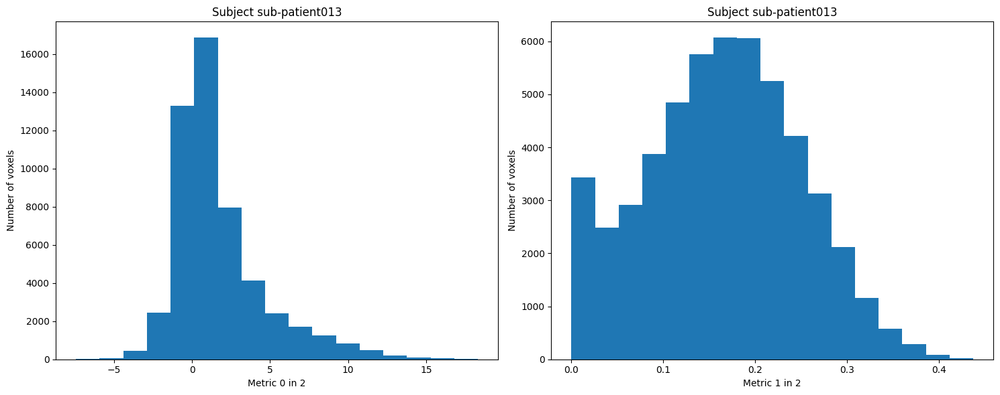

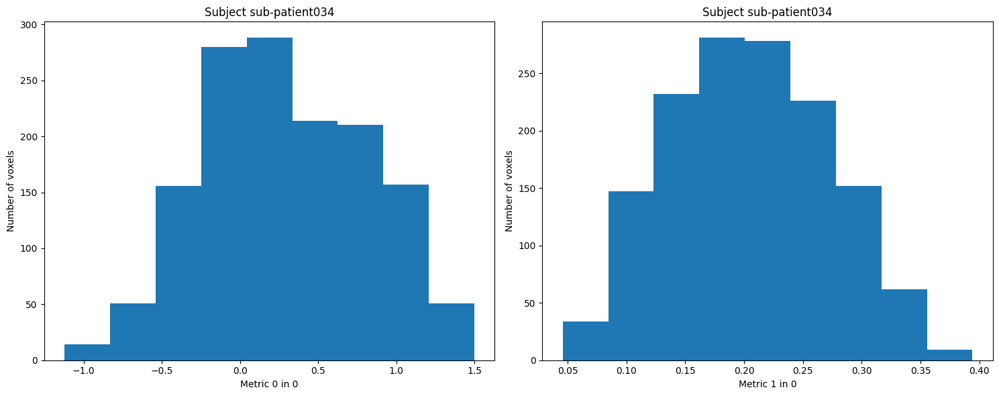

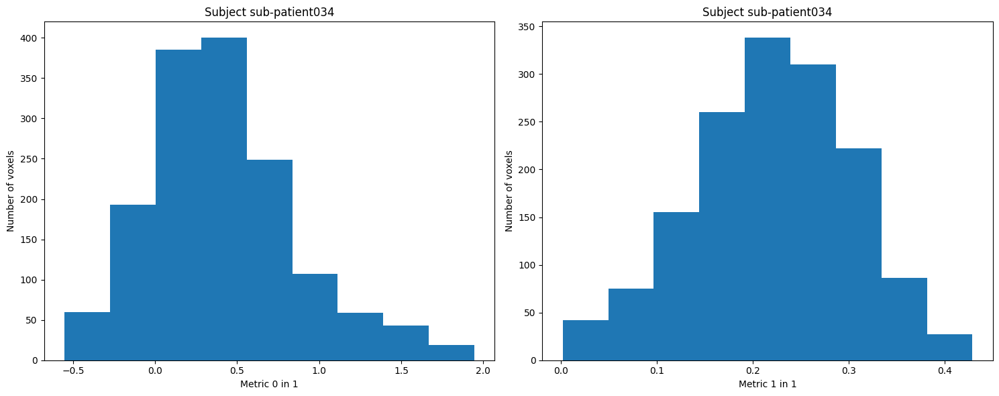

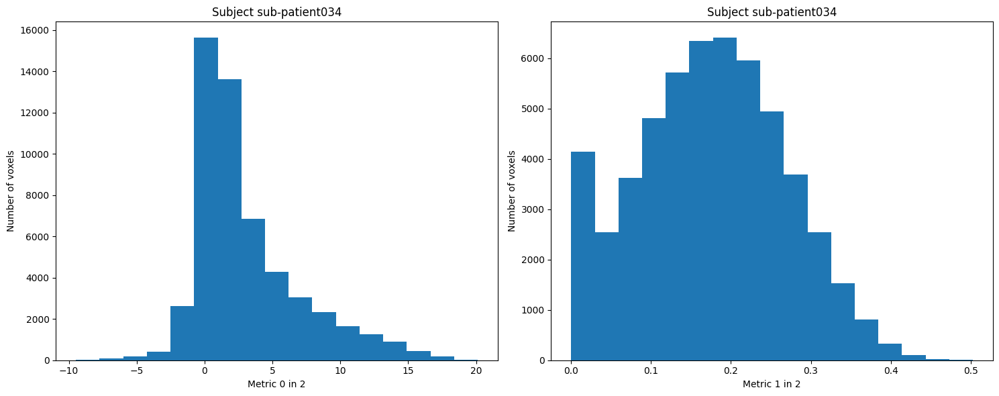

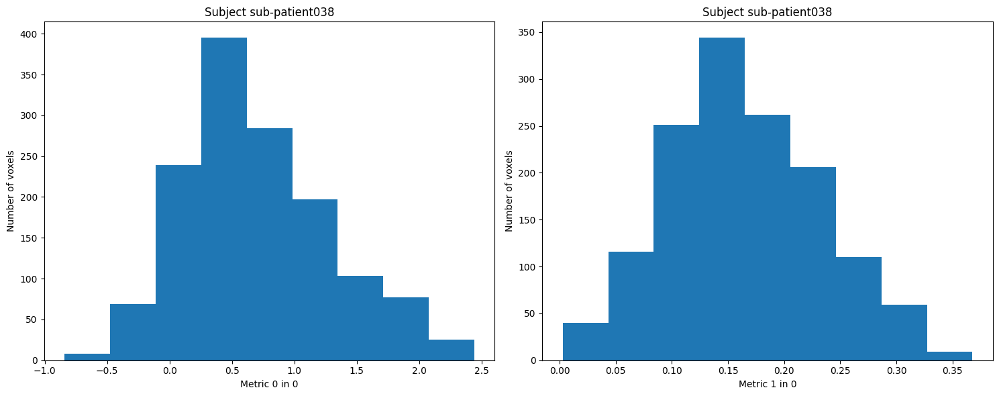

...

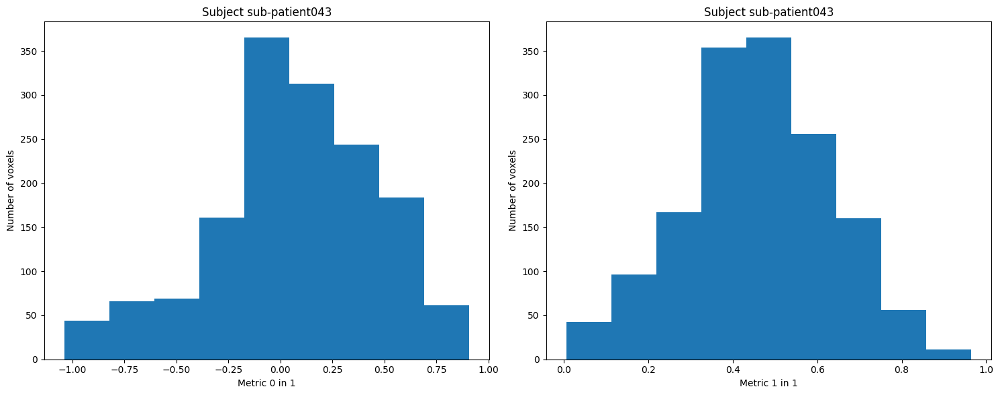

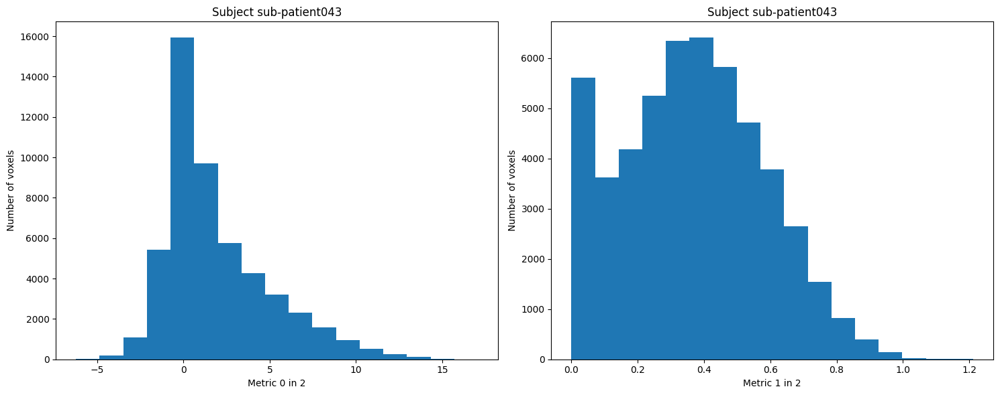

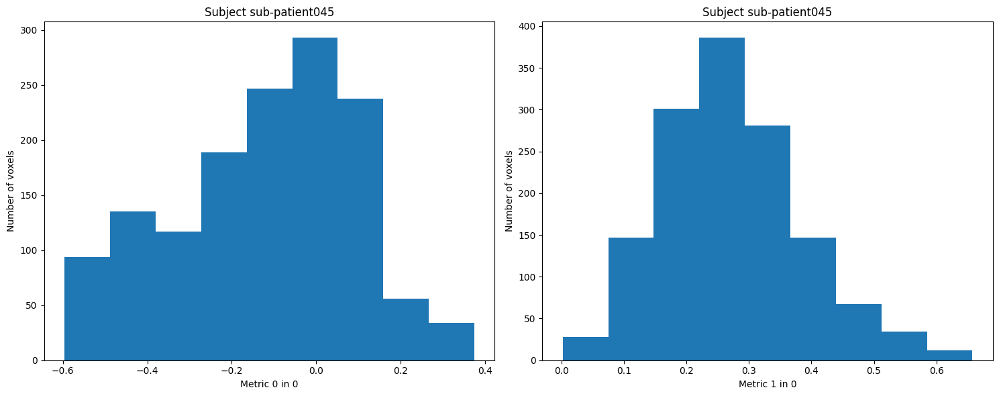

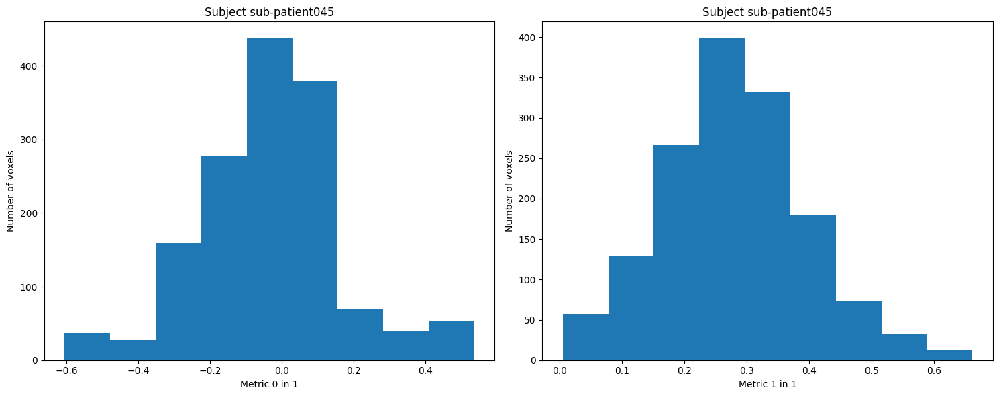

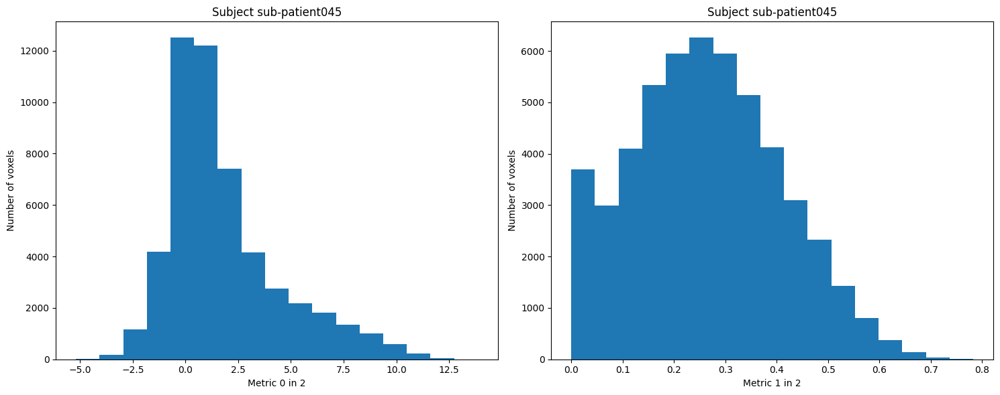

In [73]:
CVRnbinhappypreict, CVRnbinangrypreict, CVRnbinvispreict, CVRmeanhpreict, CVRmeanapreict, CVRmeanvpreict = hist_spearman(neurowCVR_preictal, "ses-preictal", "CVR")

In [74]:
coefs_preictCVR = calc_spearman([CVRmeanhpreict,CVRmeanapreict,CVRmeanvpreict])
coefs_preictHCVR = coefs_preictCVR[0]
coefs_preictACVR = coefs_preictCVR[1]
coefs_preictVCVR = coefs_preictCVR[2]

## Ictal

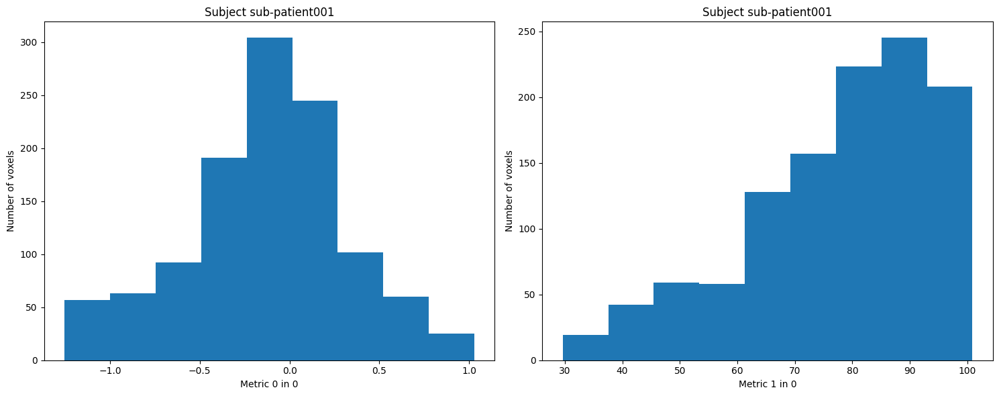

/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:134: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:151: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:163: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


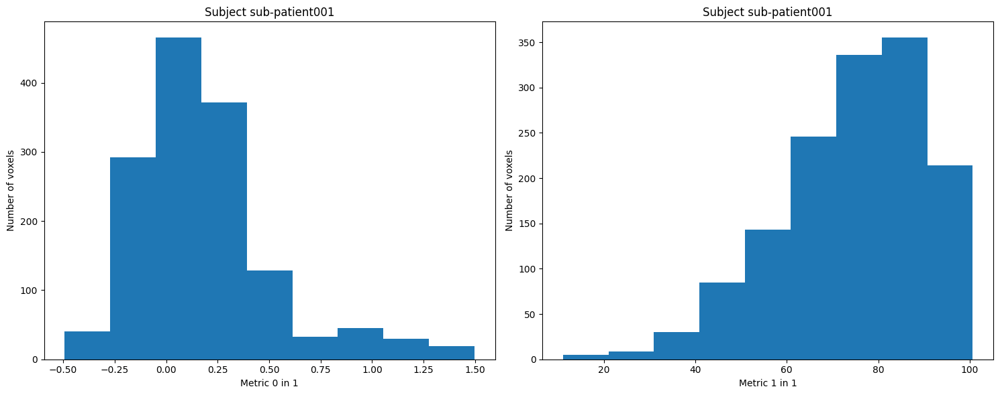

/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:185: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:190: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:179: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


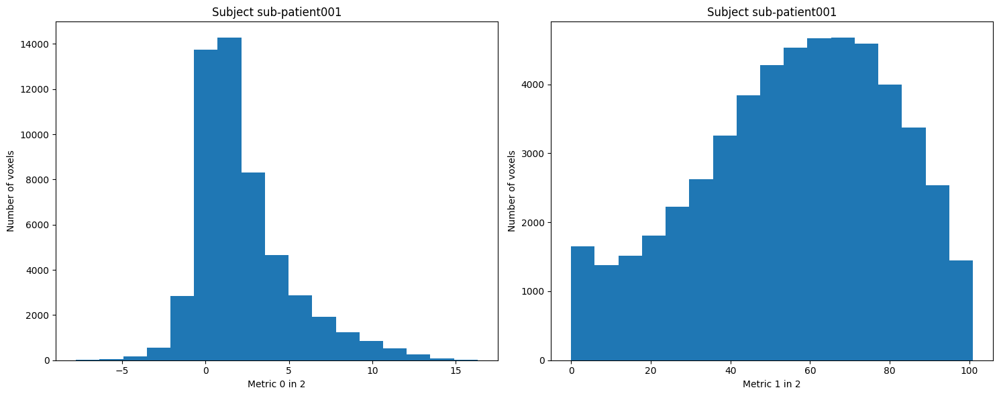

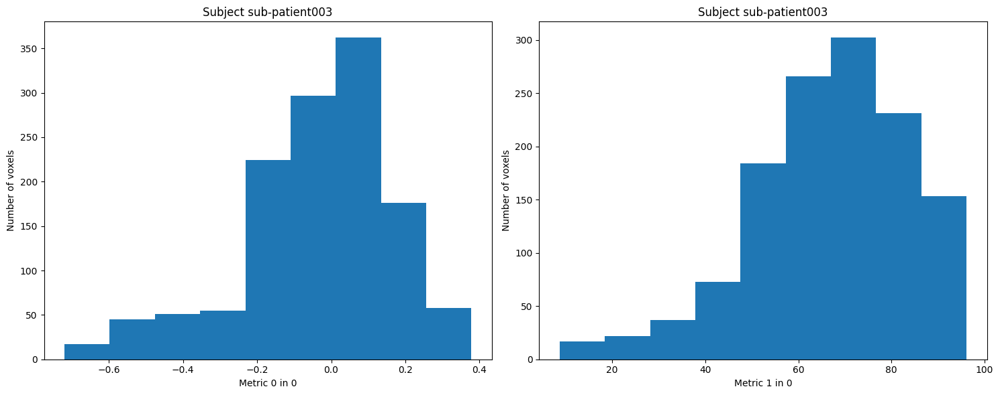

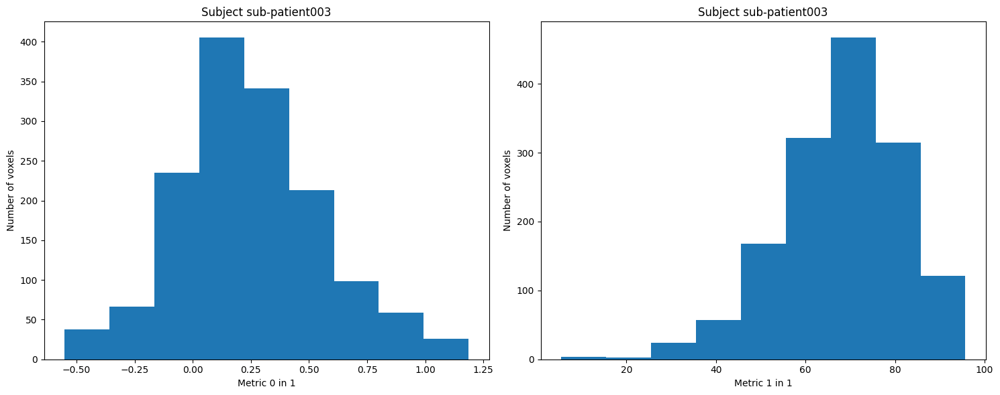

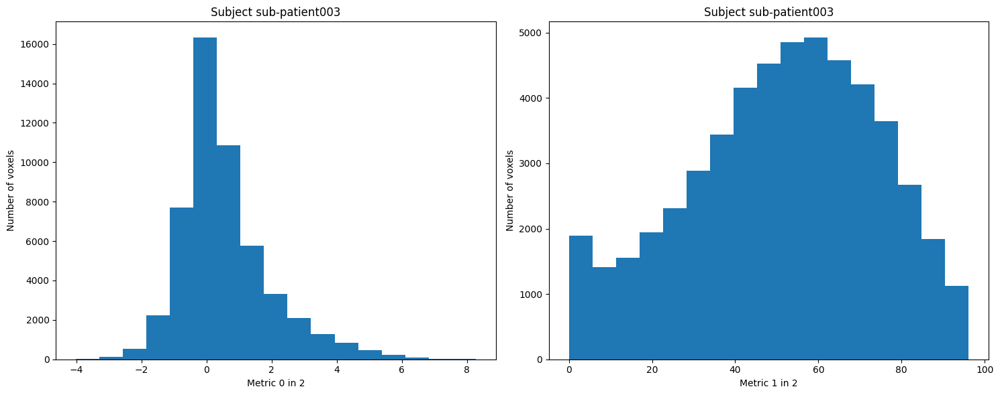

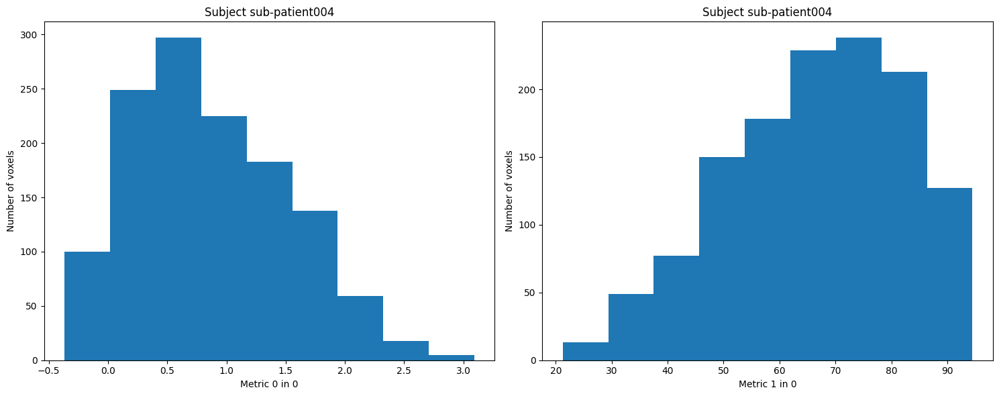

...

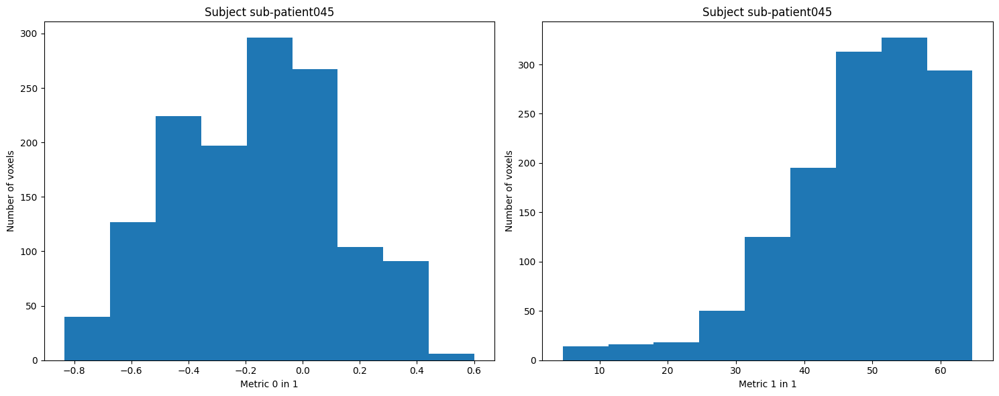

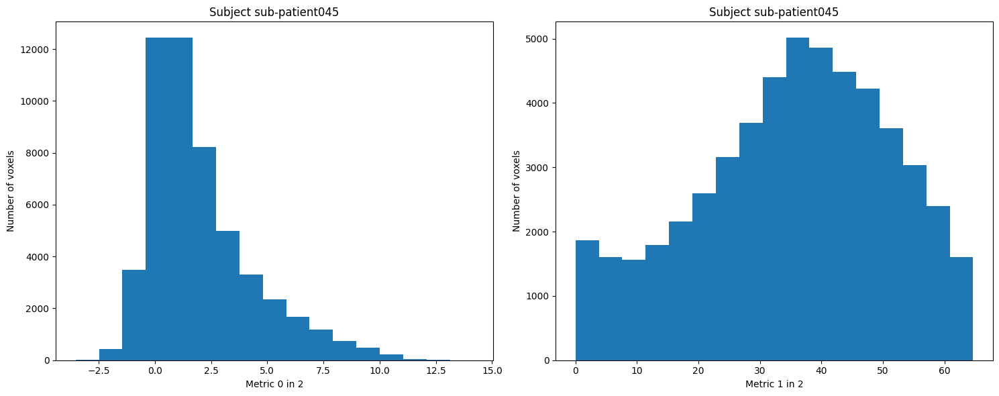

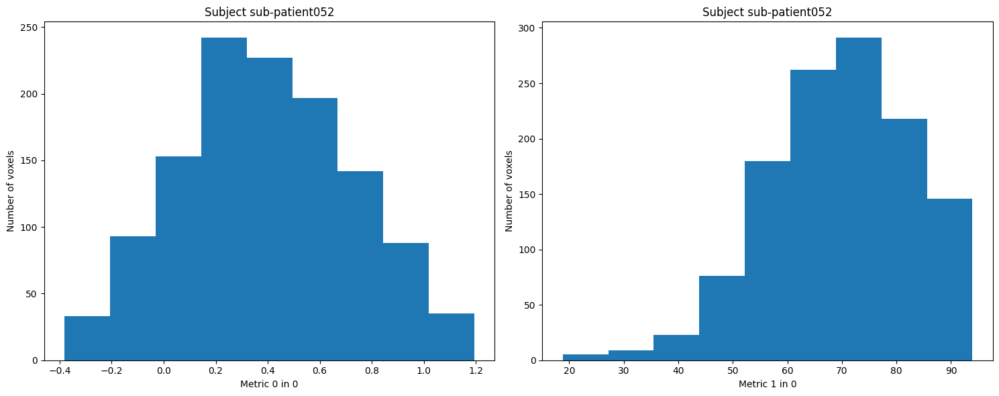

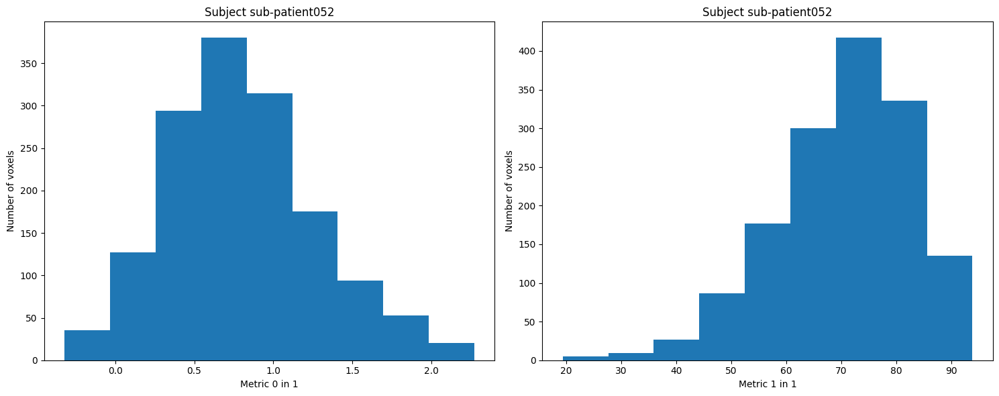

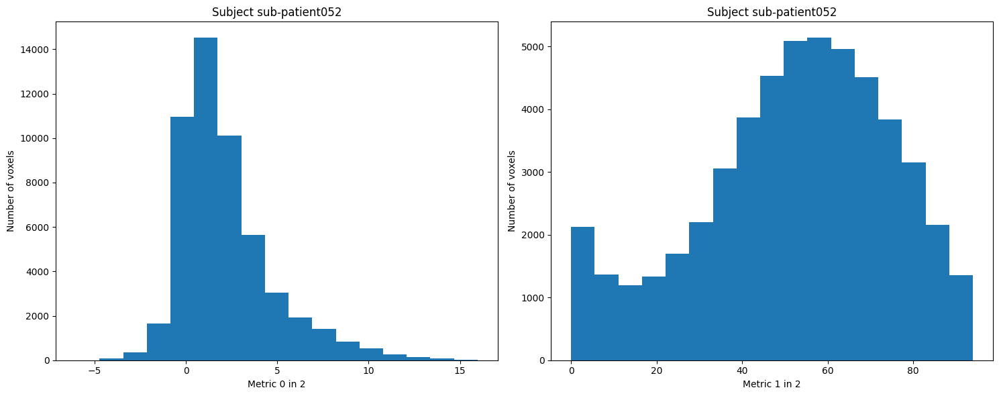

In [75]:
ASLnbinhappyict,ASLnbinangryict,ASLnbinvisict, ASLmeanhict, ASLmeanaict, ASLmeanvict = hist_spearman(neurowASL_ictal,"ses-ictal","ASL")

In [76]:
coefs_ict = calc_spearman([ASLmeanhict,ASLmeanaict,ASLmeanvict])
coefs_ictH = coefs_ict[0]
coefs_ictA = coefs_ict[1]
coefs_ictV = coefs_ict[2]

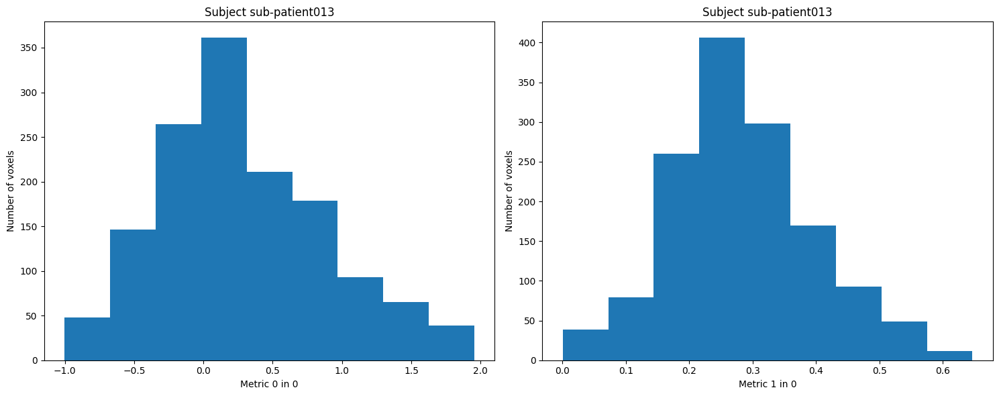

/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:134: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:151: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:163: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


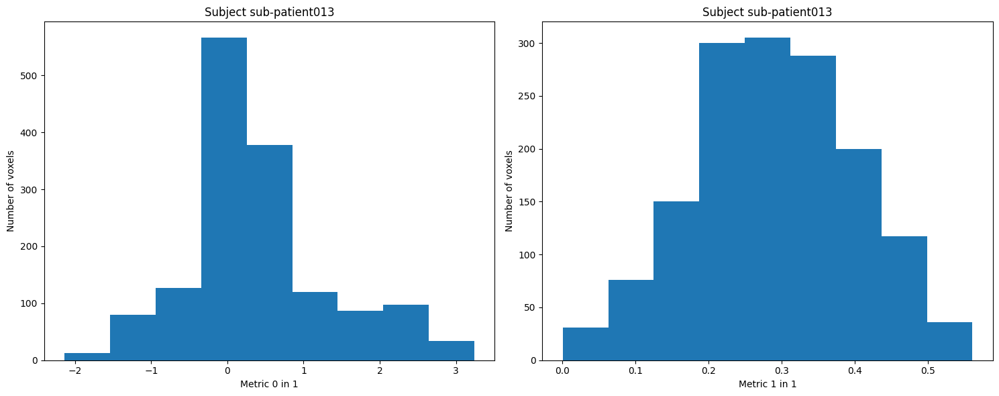

/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:185: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:190: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:179: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


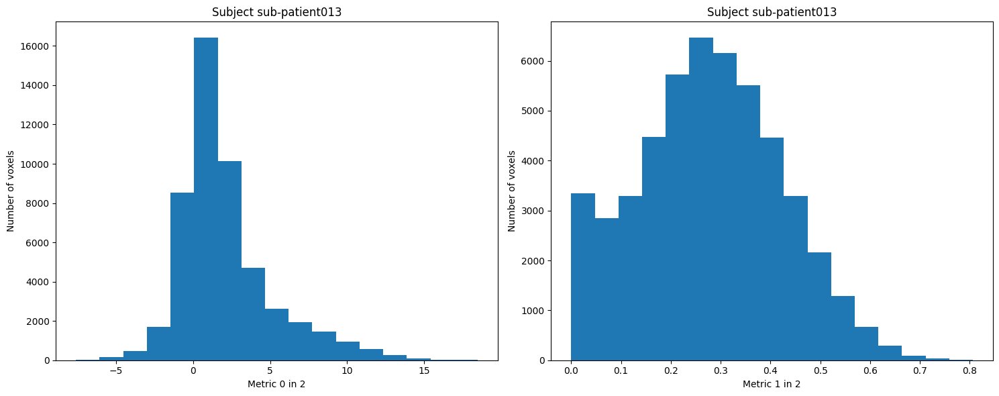

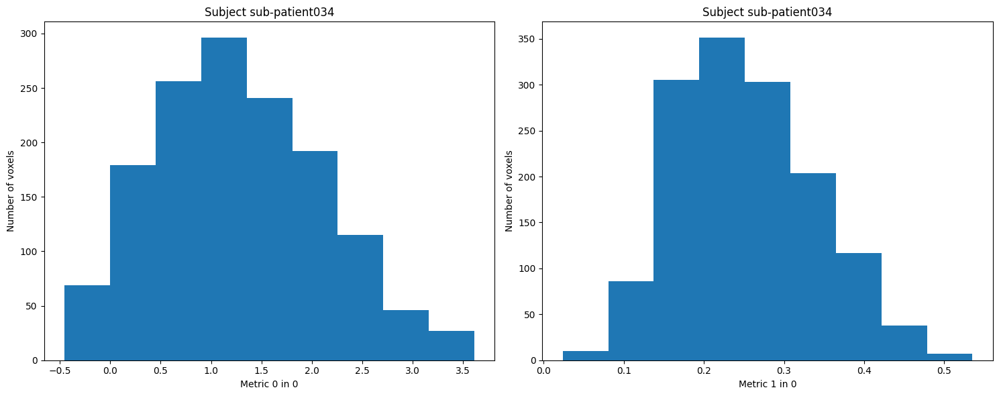

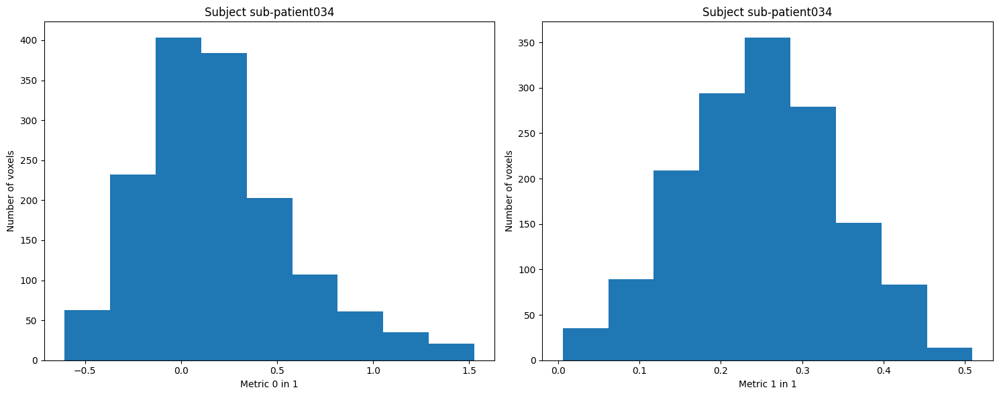

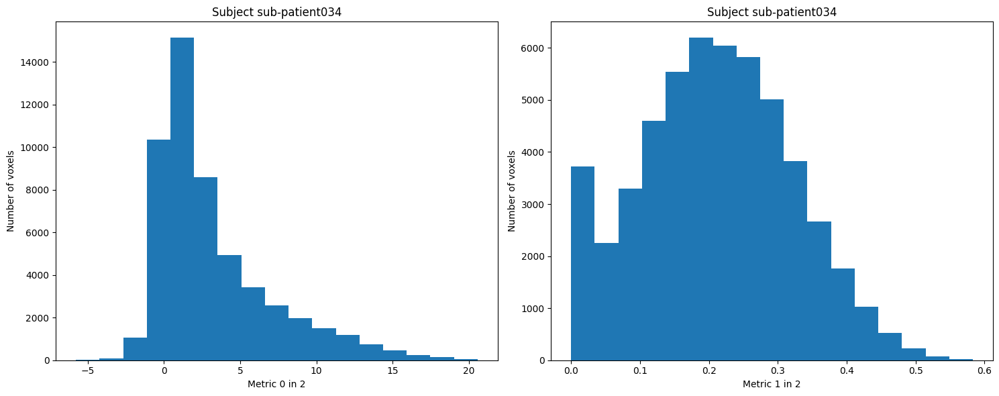

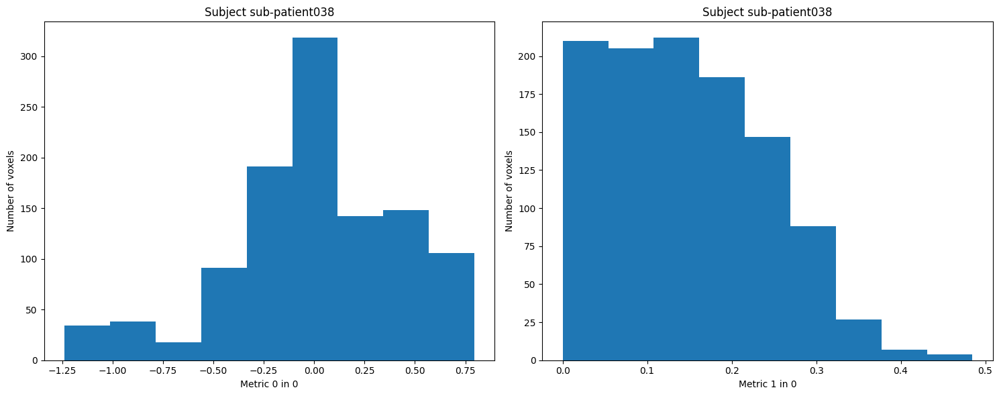

...

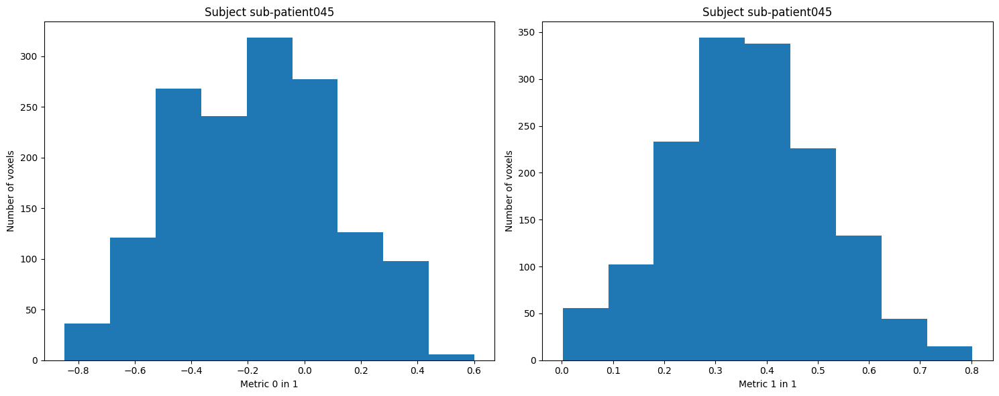

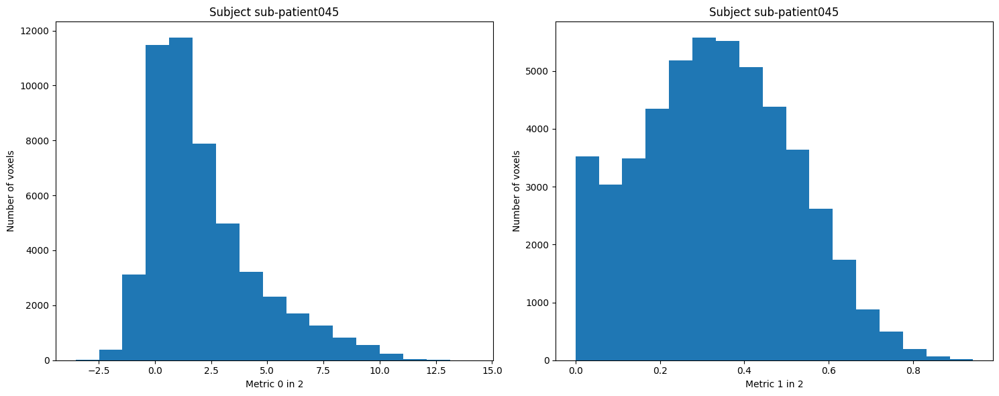

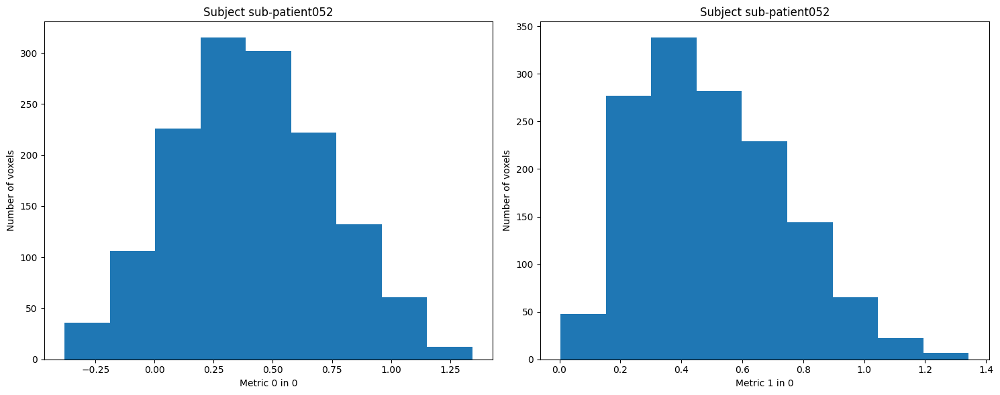

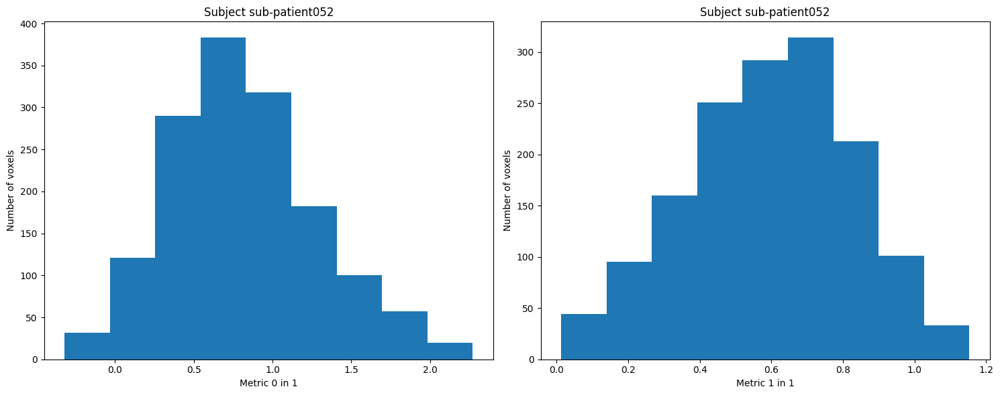

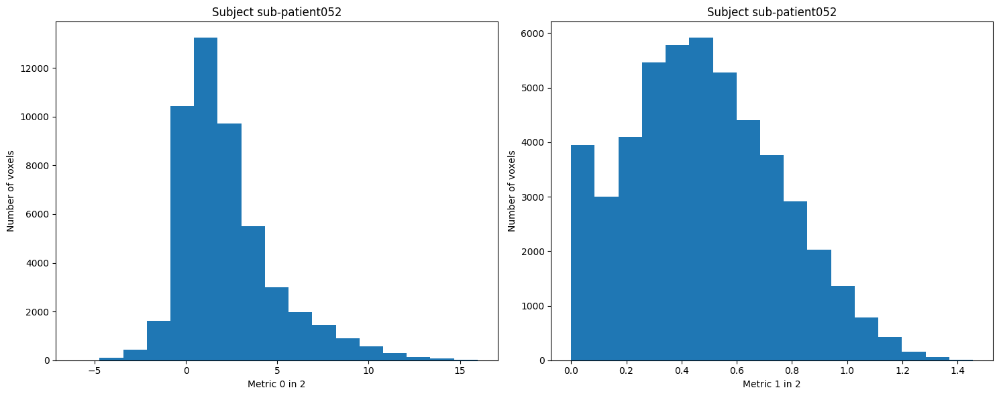

In [77]:
CVRnbinhappyict, CVRnbinangryict, CVRnbinvisict, CVRmeanhict, CVRmeanaict, CVRmeanvict = hist_spearman(neurowCVR_ictal, "ses-ictal", "CVR")

In [78]:
coefs_ictCVR = calc_spearman([CVRmeanhict,CVRmeanaict,CVRmeanvict])
coefs_ictHCVR = coefs_ictCVR[0]
coefs_ictACVR = coefs_ictCVR[1]
coefs_ictVCVR = coefs_ictCVR[2]

## Postictal

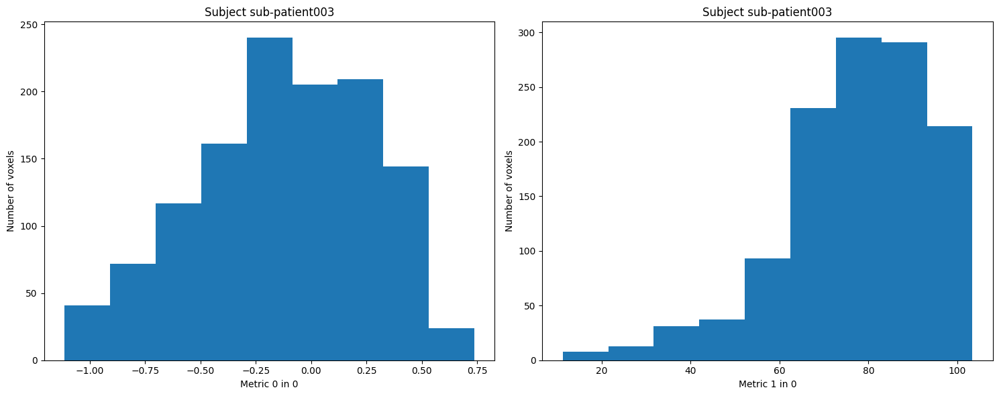

/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:134: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:151: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:163: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


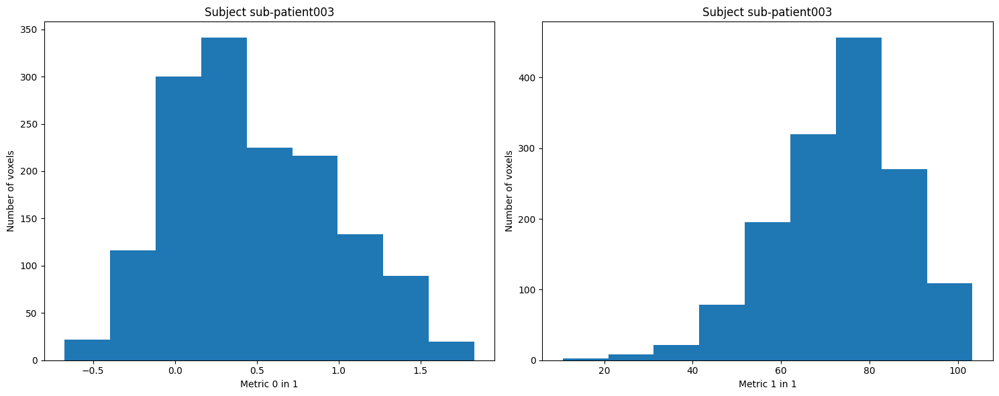

/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:185: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:190: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:179: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


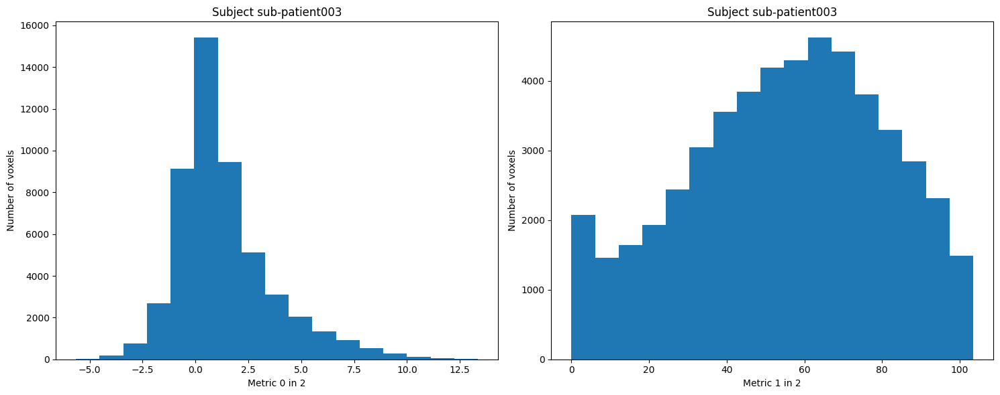

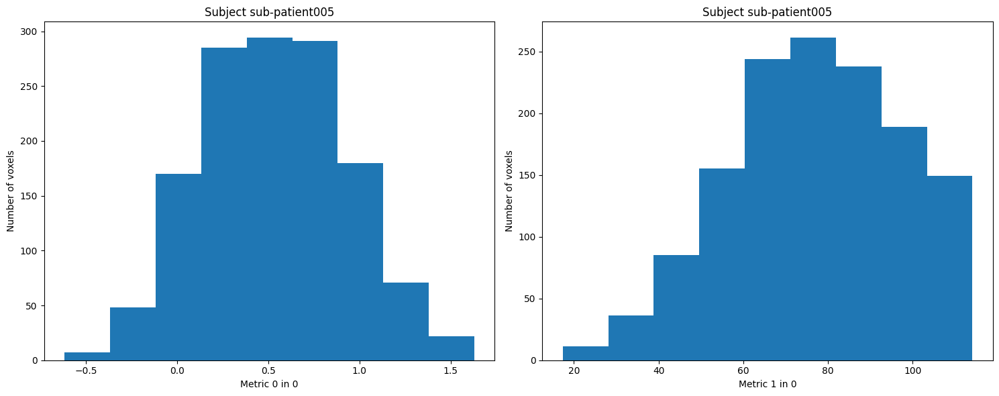

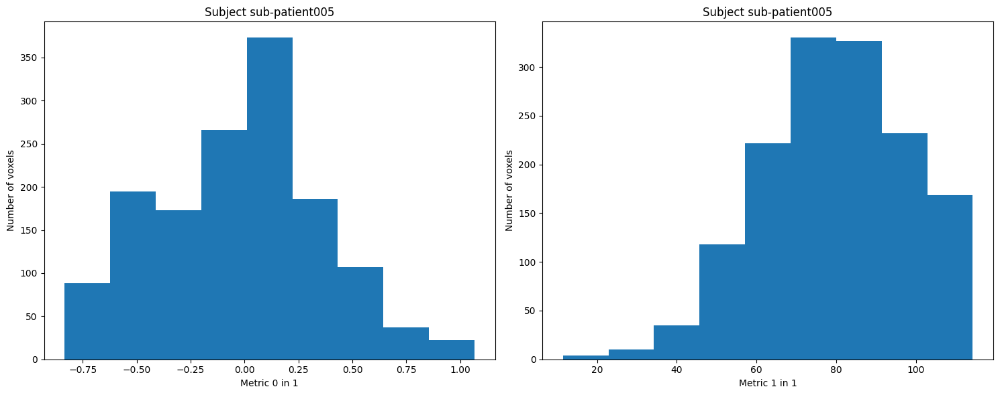

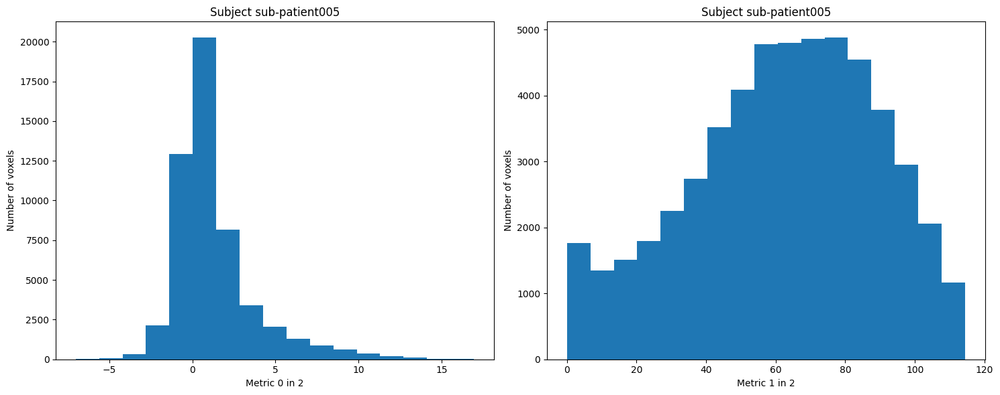

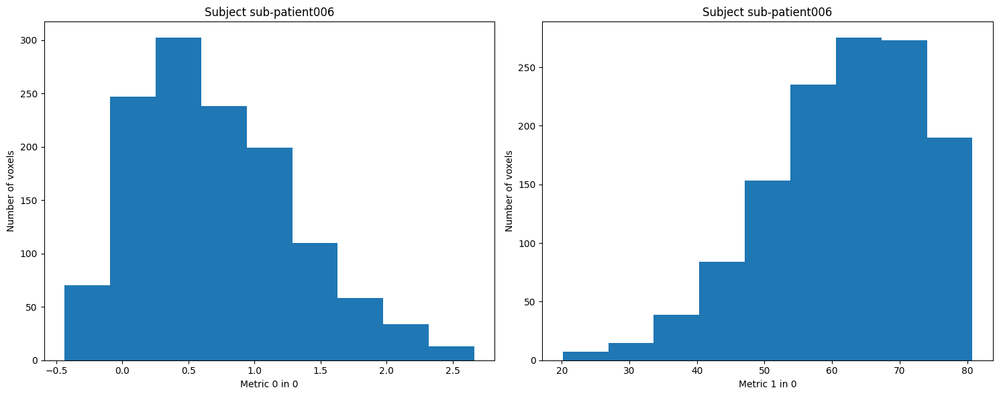

...

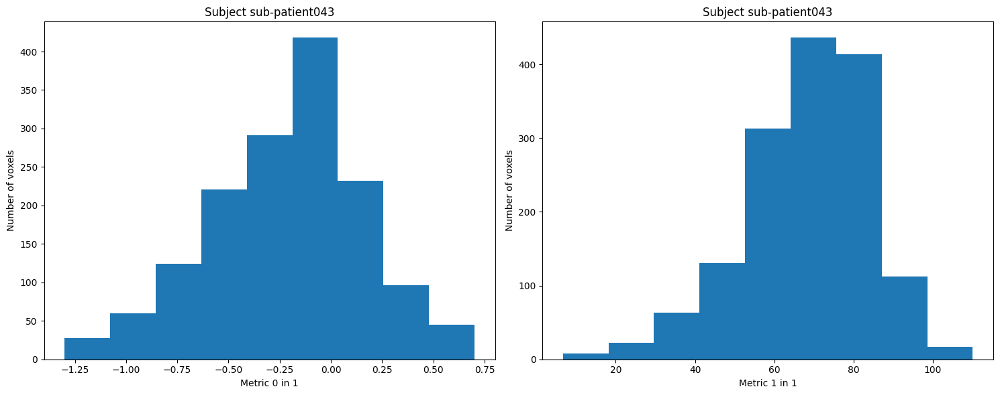

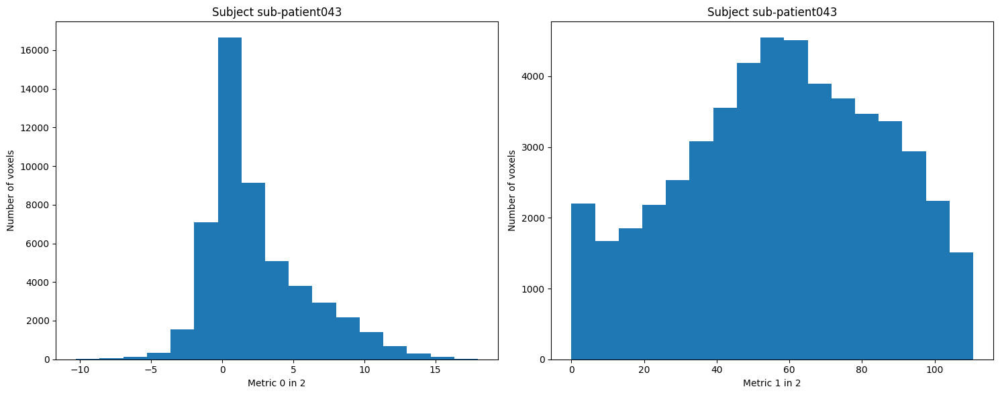

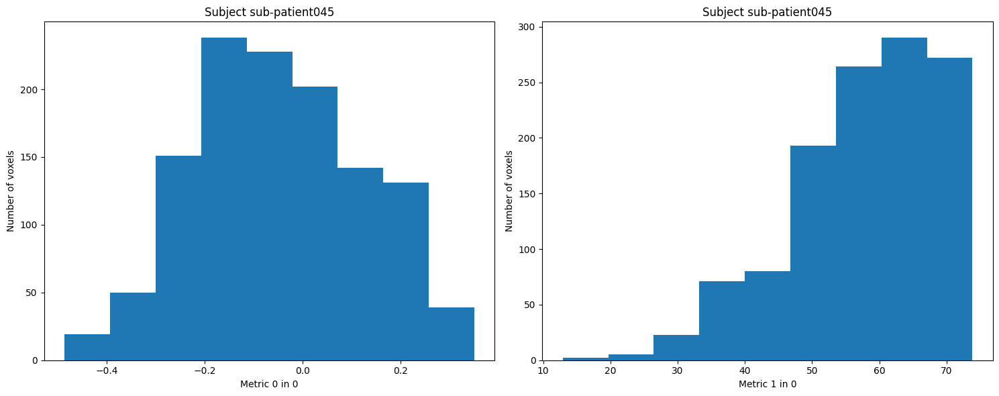

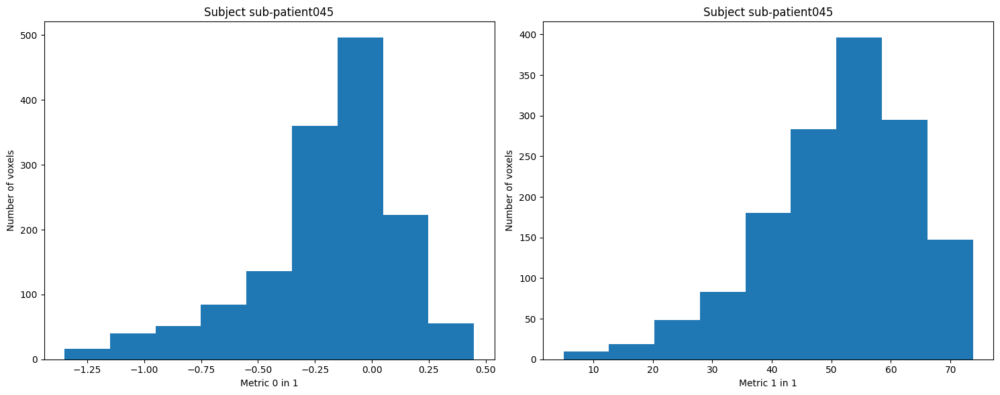

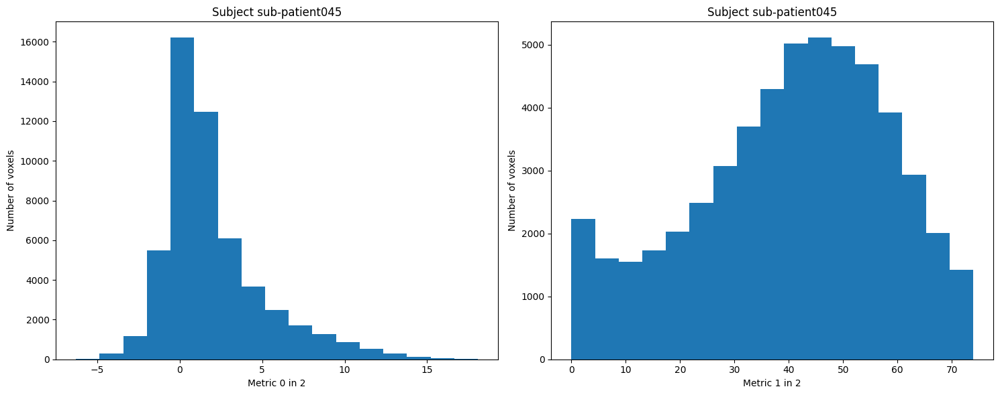

In [79]:
ASLnbinhappypostict,ASLnbinangrypostict,ASLnbinvispostict, ASLmeanhpostict, ASLmeanapostict, ASLmeanvpostict = hist_spearman(neurowASL_postictal,"ses-postictal","ASL")

In [80]:
coefs_postict = calc_spearman([ASLmeanhpostict,ASLmeanapostict,ASLmeanvpostict])
coefs_postictH = coefs_postict[0]
coefs_postictA = coefs_postict[1]
coefs_postictV = coefs_postict[2]

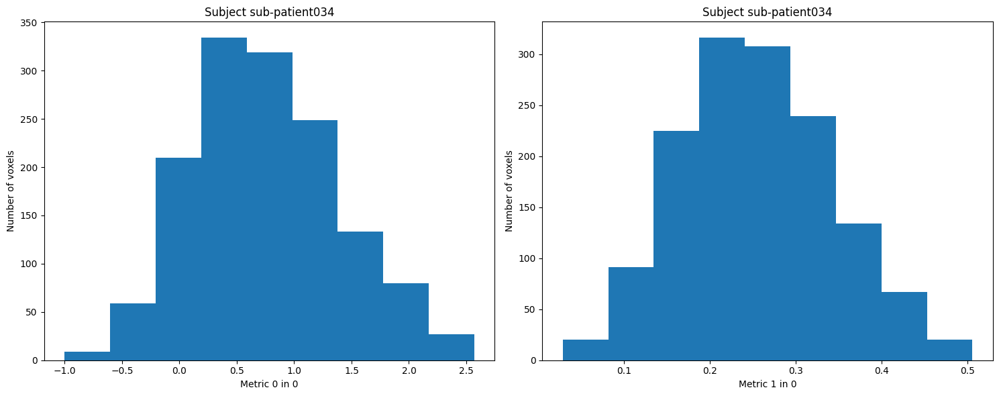

/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:134: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:151: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:163: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


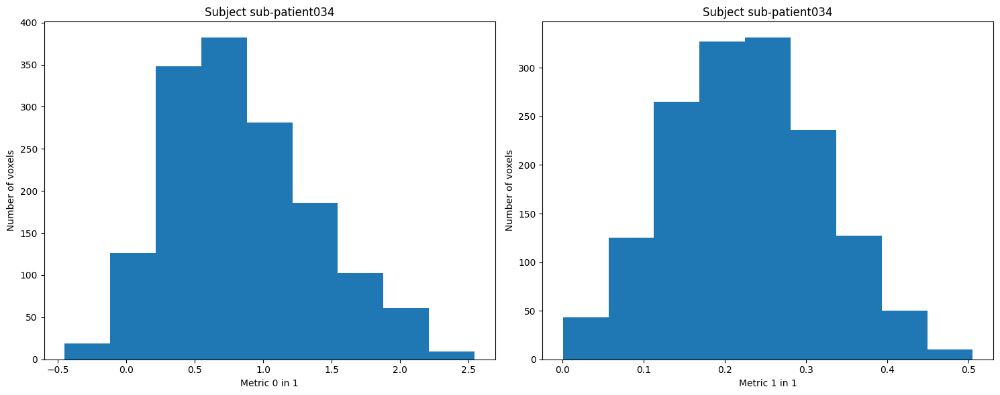

/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:185: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:190: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:179: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


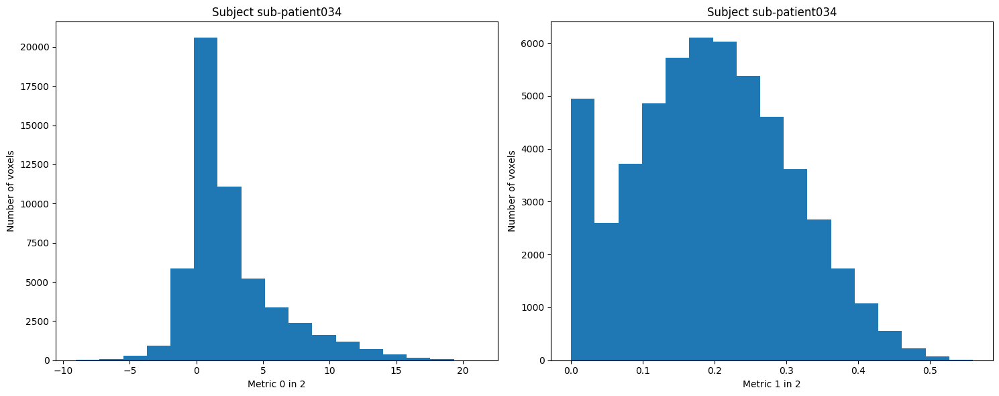

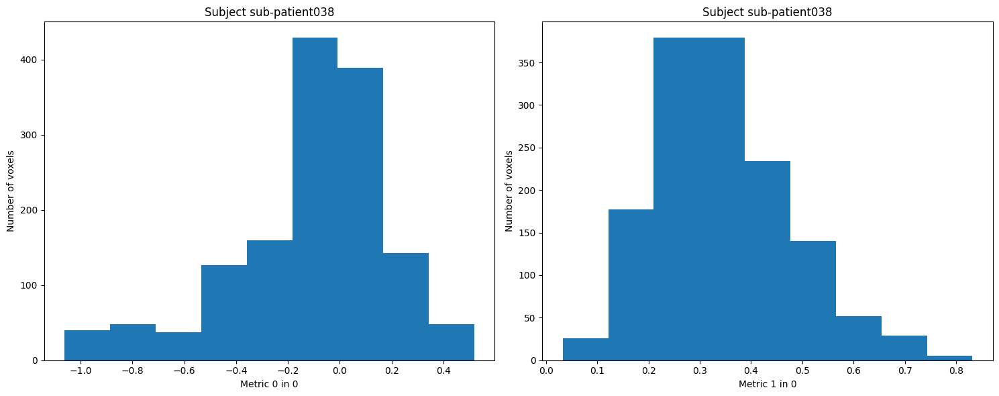

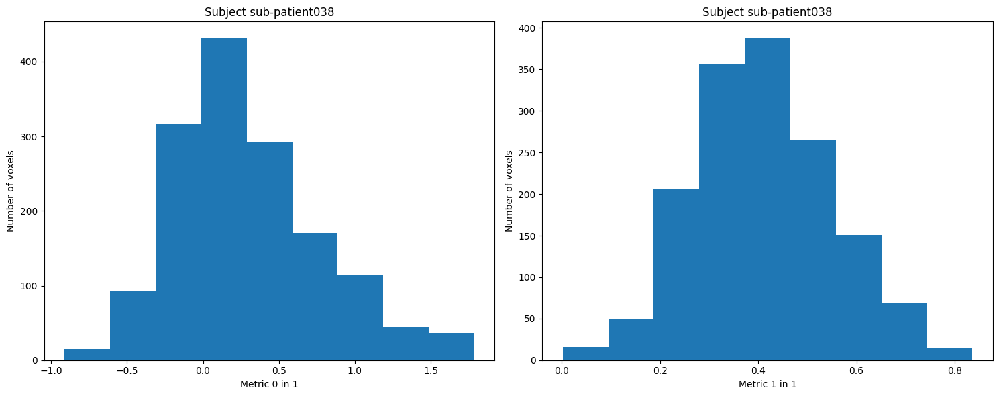

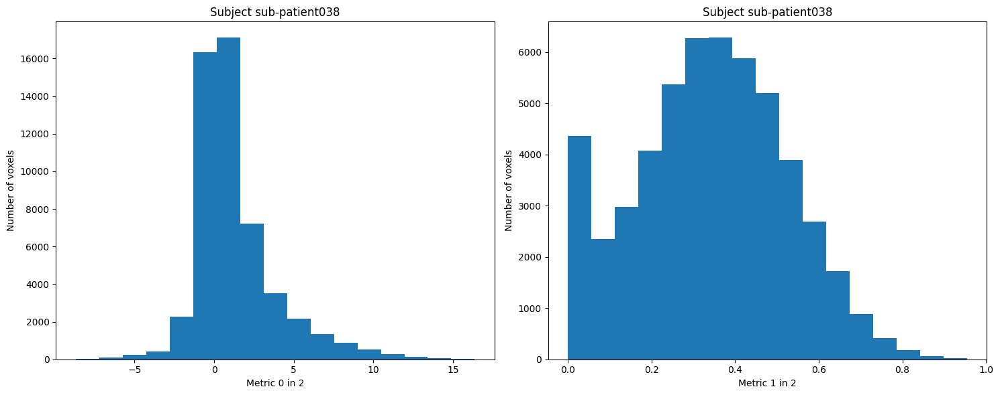

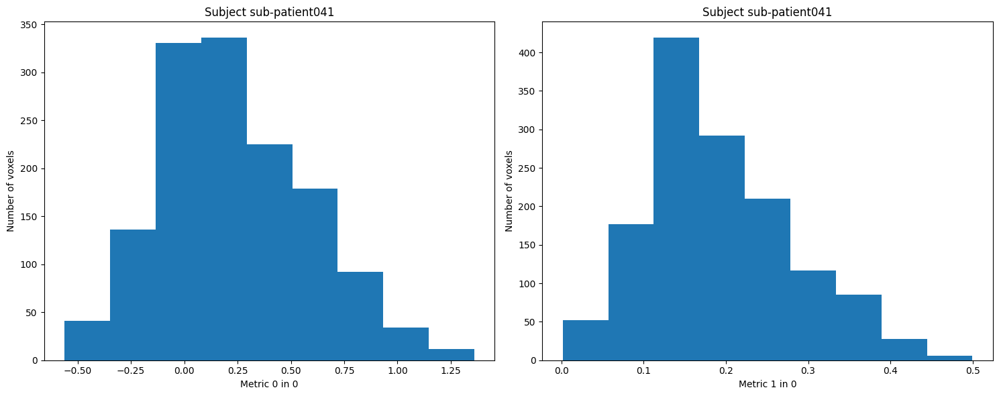

...

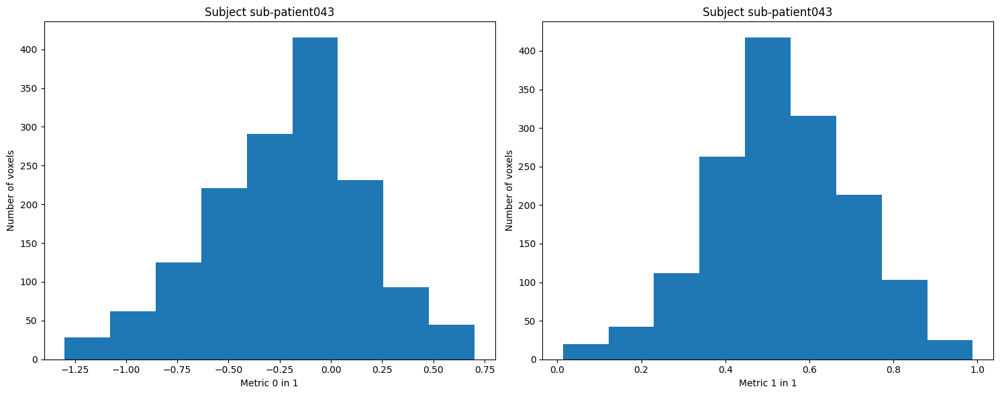

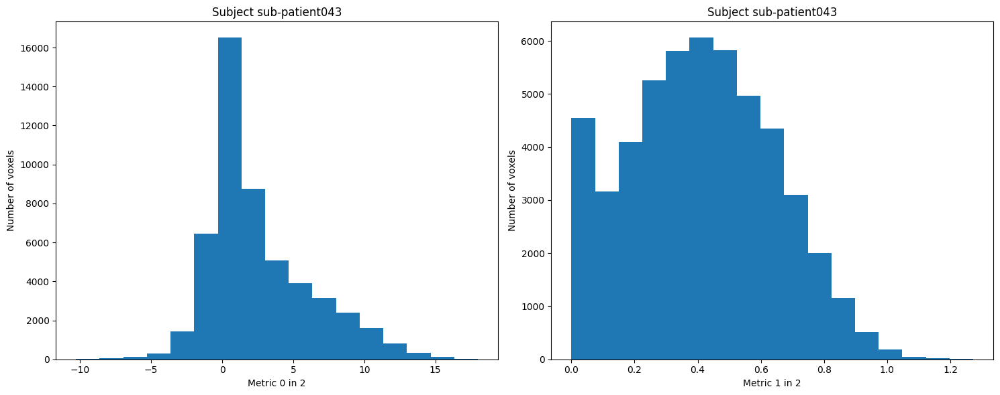

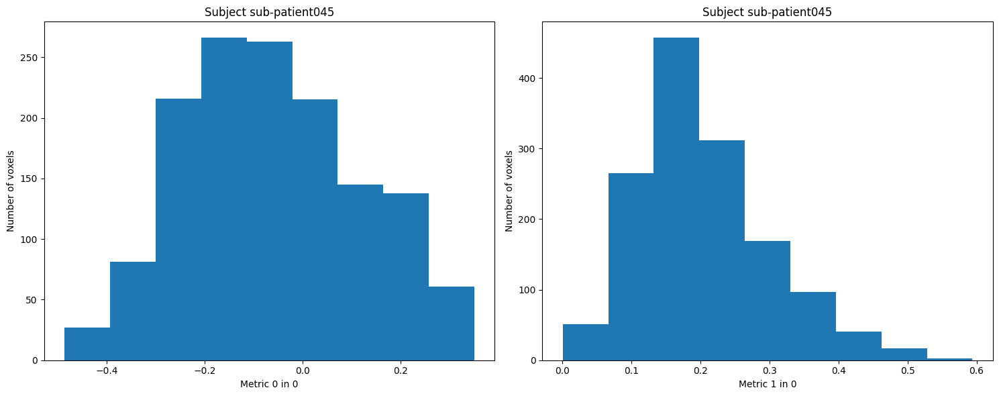

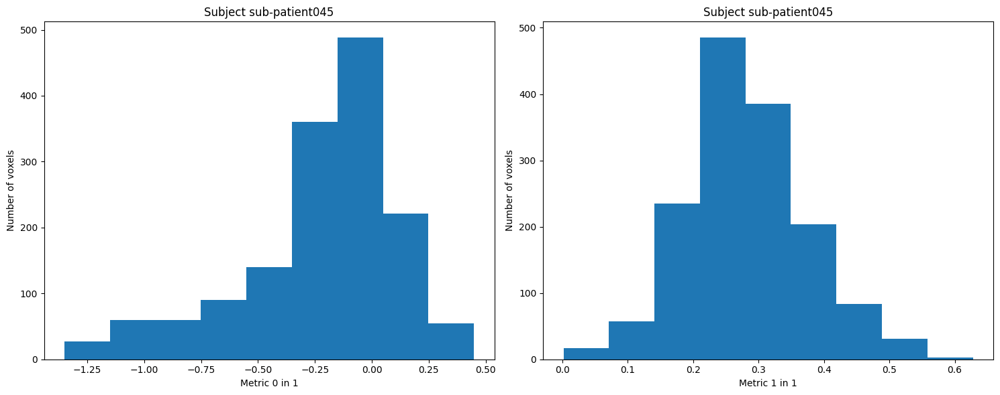

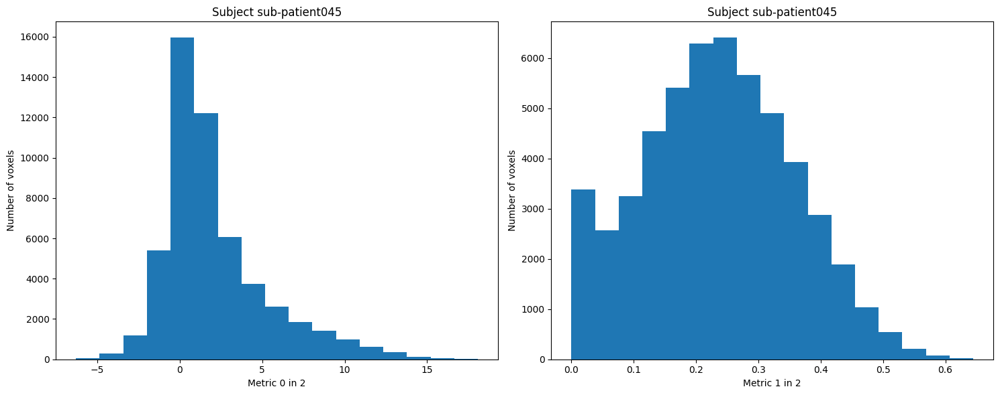

In [81]:
CVRnbinhappypostict, CVRnbinangrypostict, CVRnbinvispostict, CVRmeanhpostict, CVRmeanapostict, CVRmeanvpostict = hist_spearman(neurowCVR_postictal, "ses-postictal", "CVR")


In [82]:
coefs_postictCVR = calc_spearman([CVRmeanhpostict,CVRmeanapostict,CVRmeanvpostict])
coefs_postictHCVR = coefs_postictCVR[0]
coefs_postictACVR = coefs_postictCVR[1]
coefs_postictVCVR = coefs_postictCVR[2]

## Midcycle

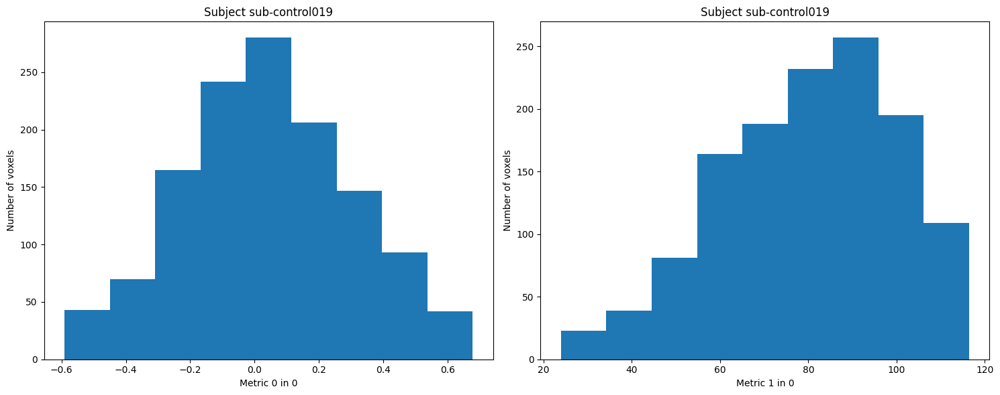

/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:134: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:151: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:163: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


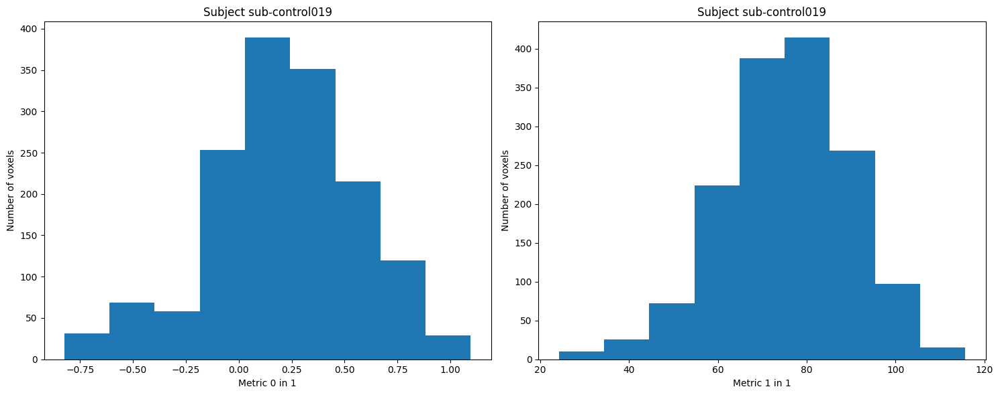

/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:185: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:190: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:179: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


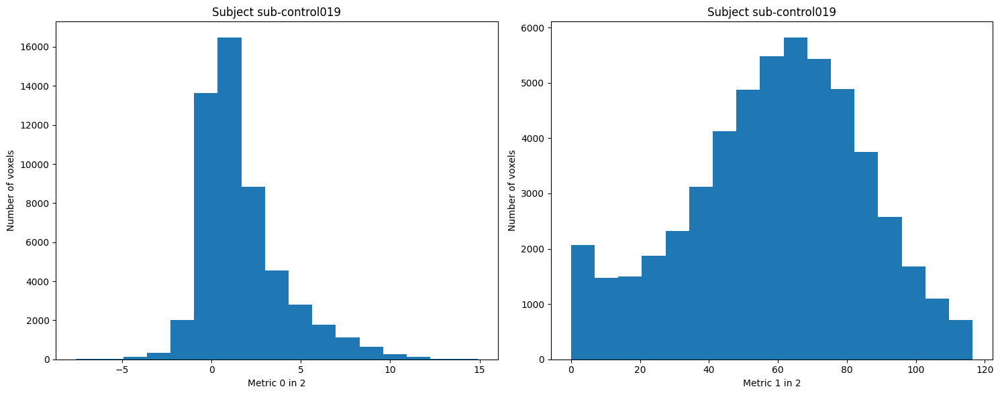

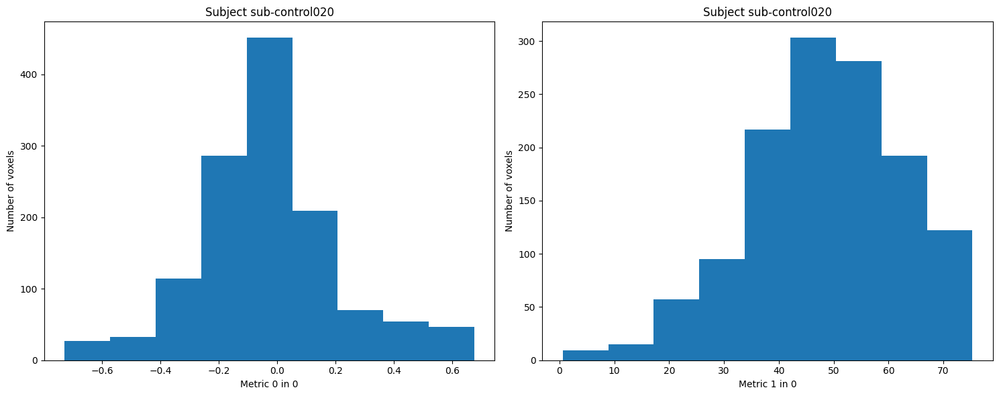

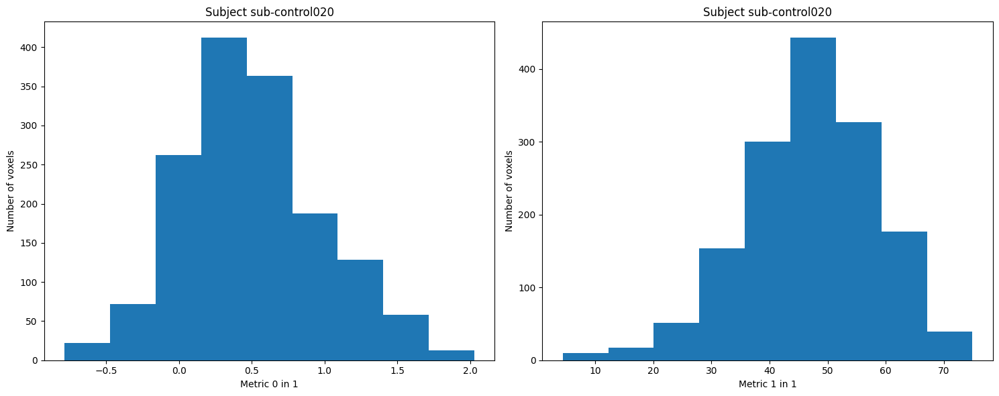

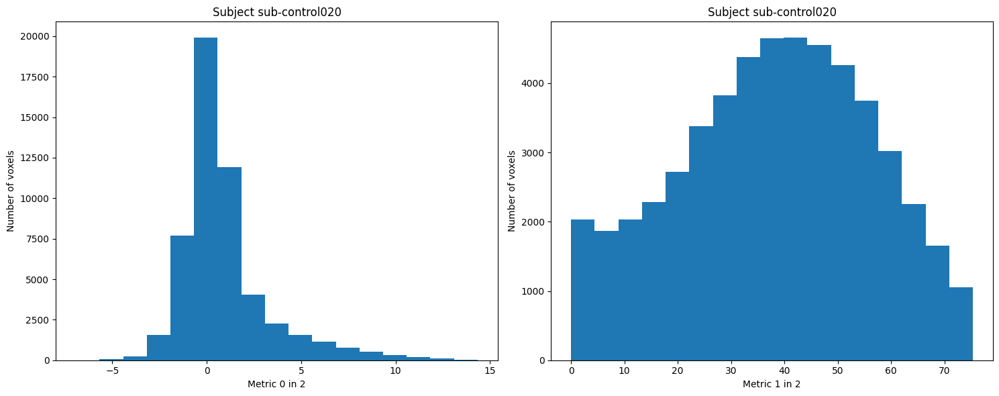

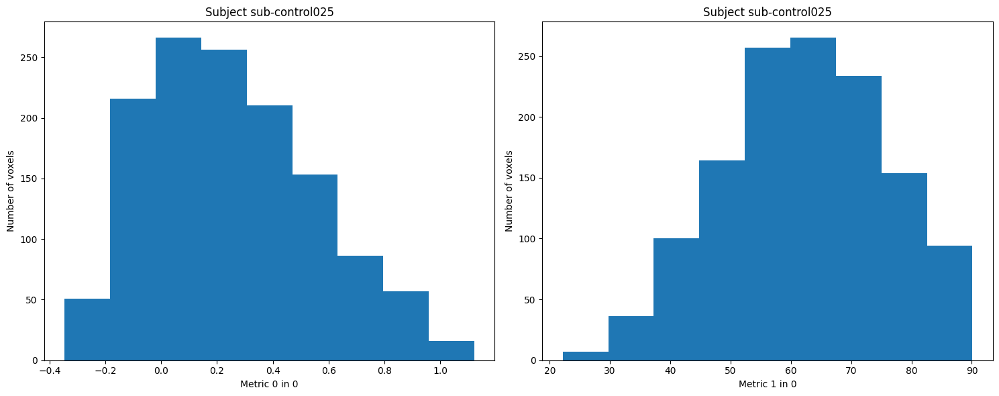

...

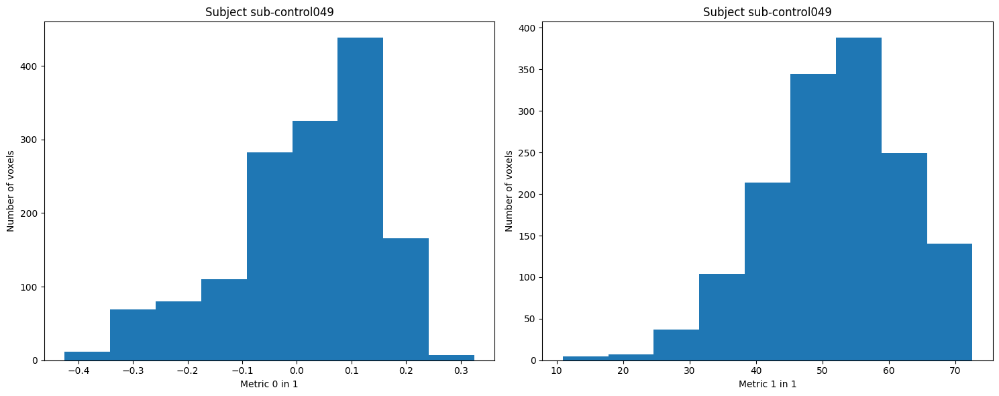

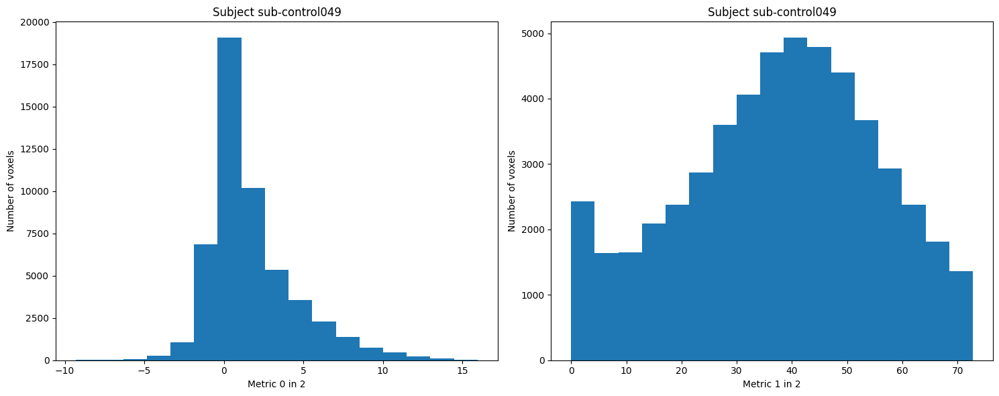

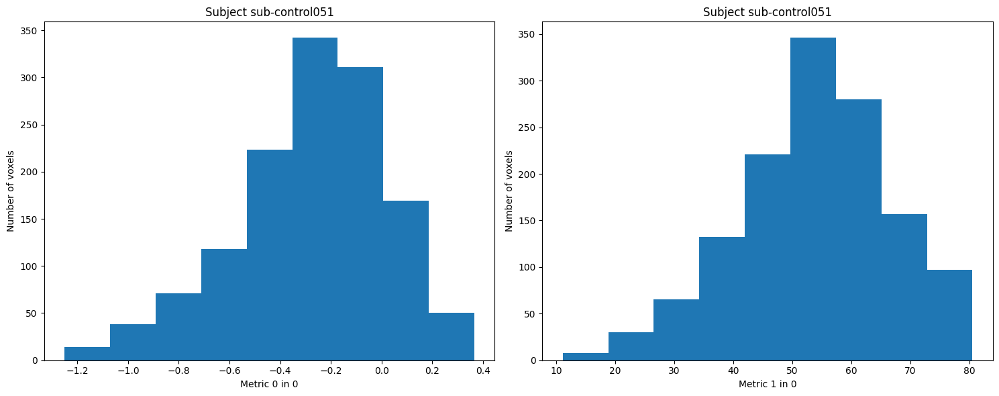

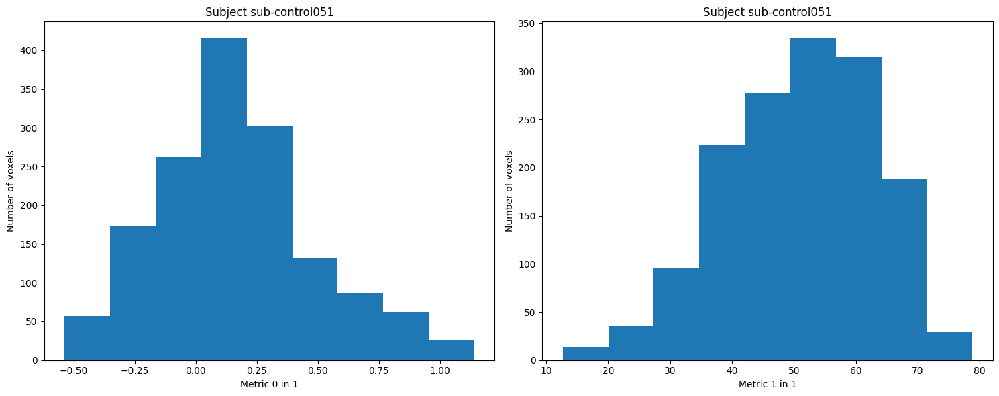

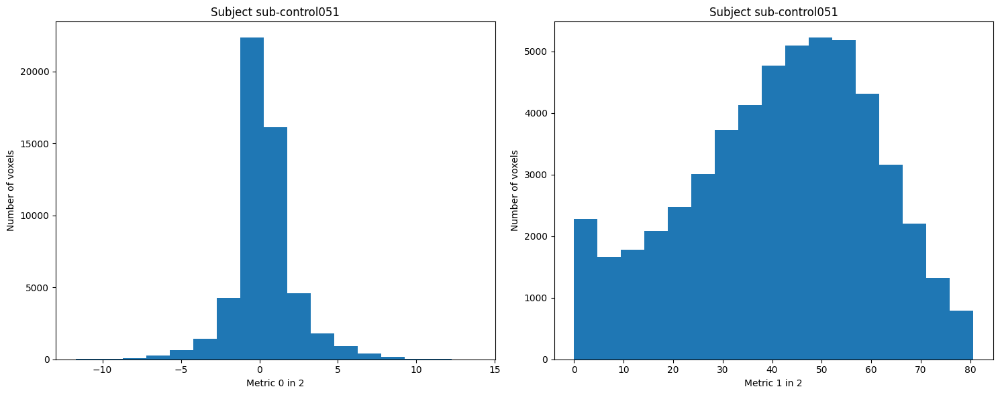

In [83]:
ASLnbinhappymid,ASLnbinangrymid,ASLnbinvismid, ASLmeanhmid, ASLmeanamid, ASLmeanvmid = hist_spearman(neurowASL_midcycle,"ses-midcycle","ASL")

In [84]:
coefs_mid = calc_spearman([ASLmeanhmid,ASLmeanamid,ASLmeanvmid])
coefs_midH = coefs_mid[0]
coefs_midA = coefs_mid[1]
coefs_midV = coefs_mid[2]

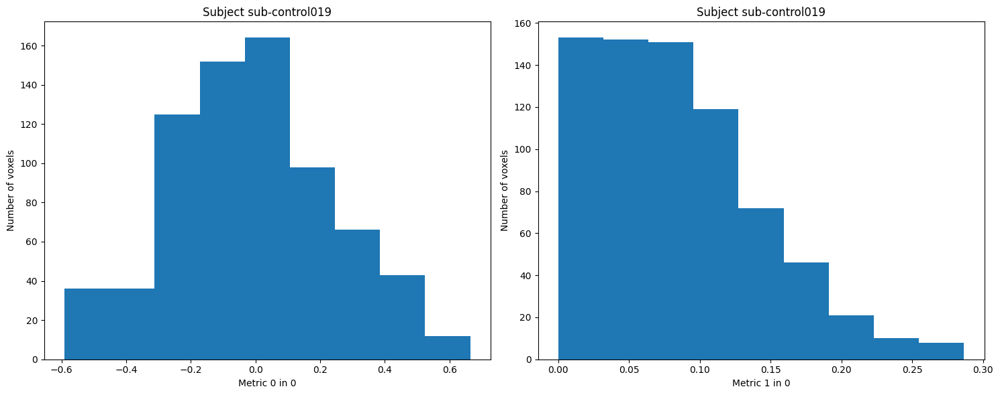

/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:134: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:151: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:163: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


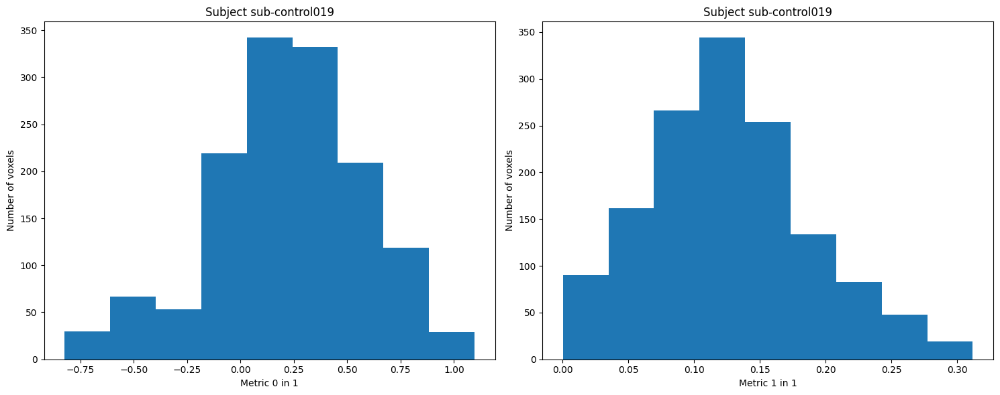

/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:185: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:190: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:179: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


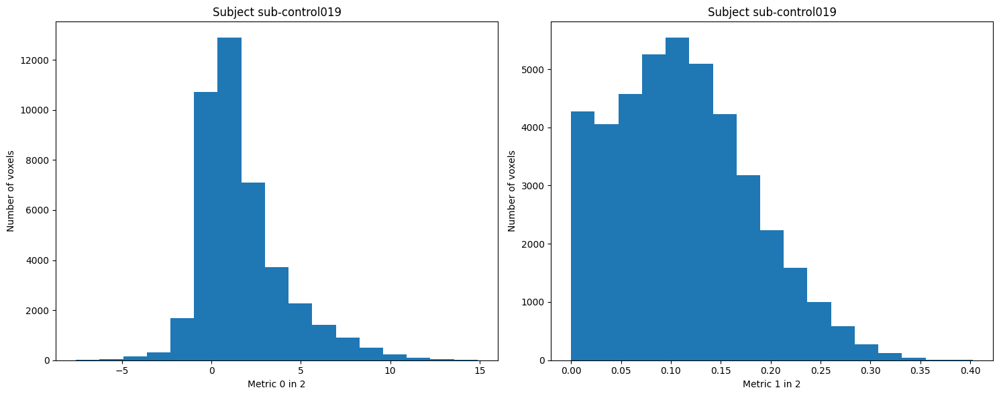

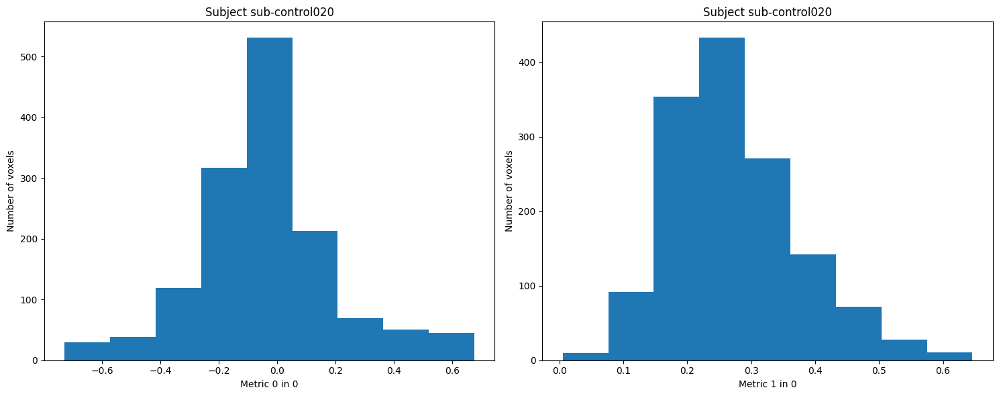

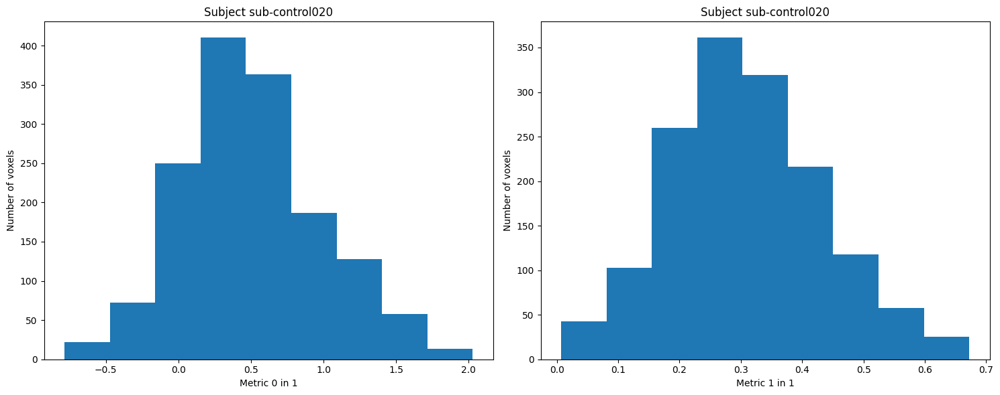

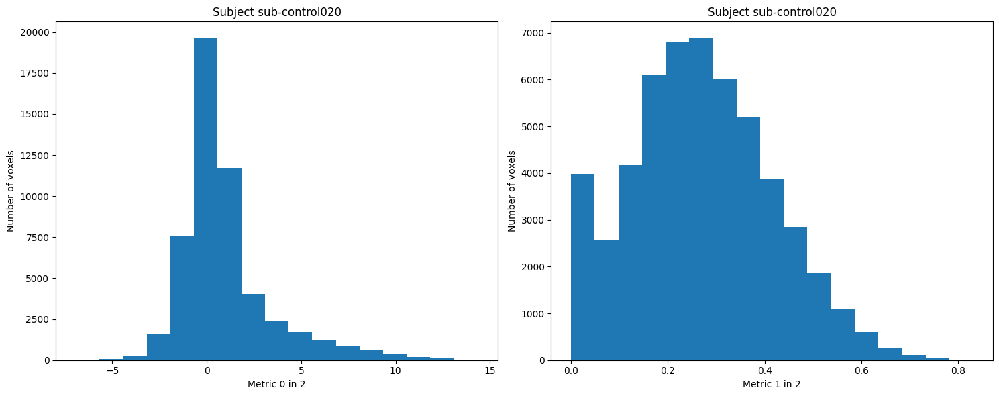

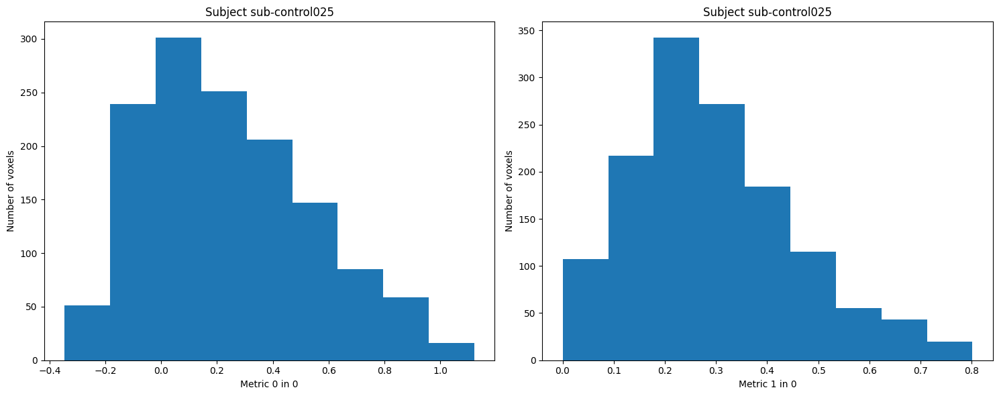

...

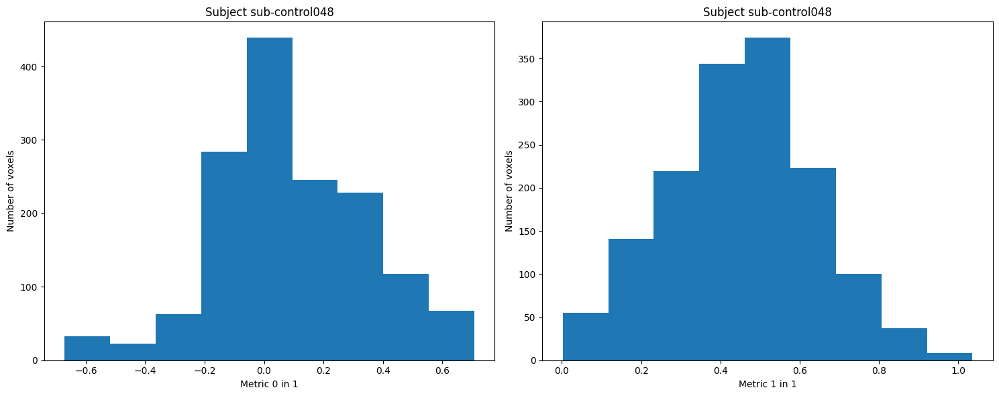

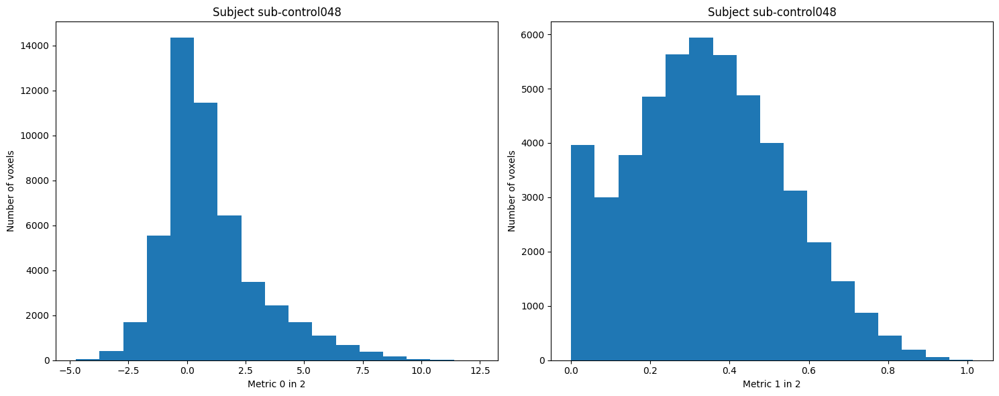

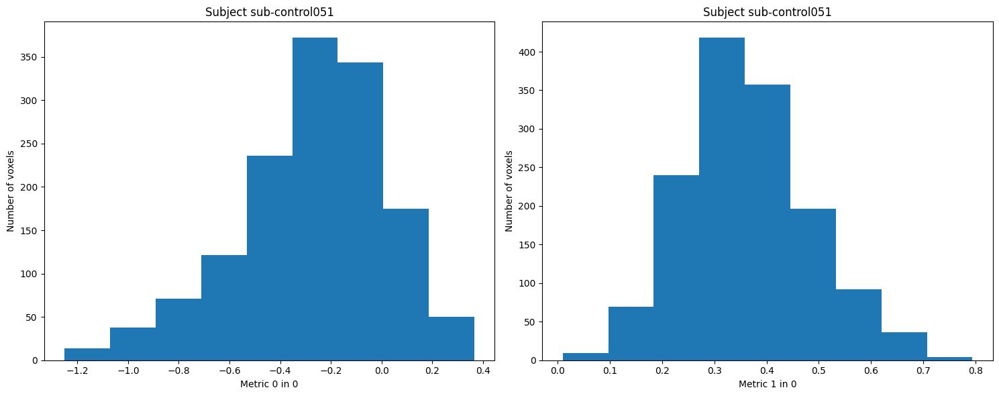

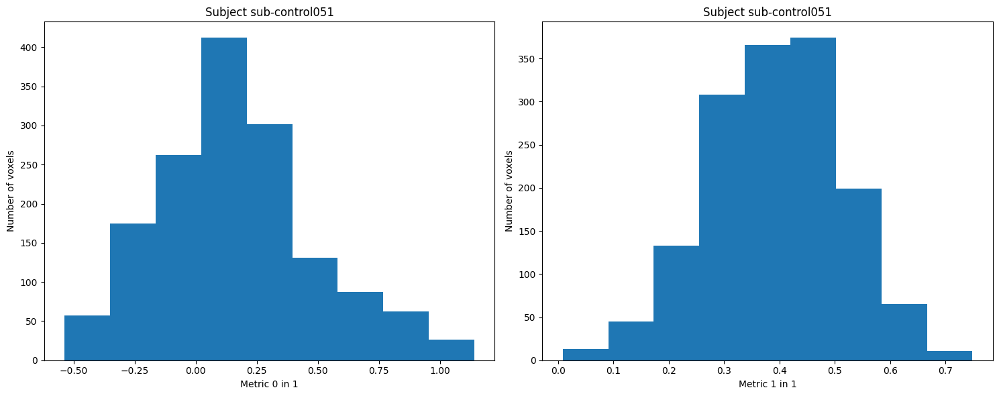

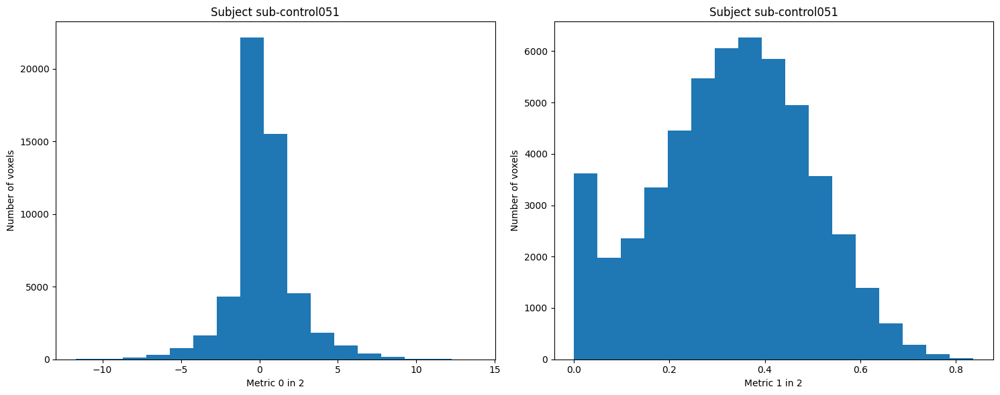

In [85]:
CVRnbinhappymid, CVRnbinangrymid, CVRnbinvismid, CVRmeanhmid, CVRmeanamid, CVRmeanvmid = hist_spearman(neurowCVR_midcycle, "ses-midcycle", "CVR")

In [86]:
coefs_midCVR = calc_spearman([CVRmeanhmid,CVRmeanamid,CVRmeanvmid])
coefs_midHCVR = coefs_midCVR[0]
coefs_midACVR = coefs_midCVR[1]
coefs_midVCVR = coefs_midCVR[2]

## Premenstrual

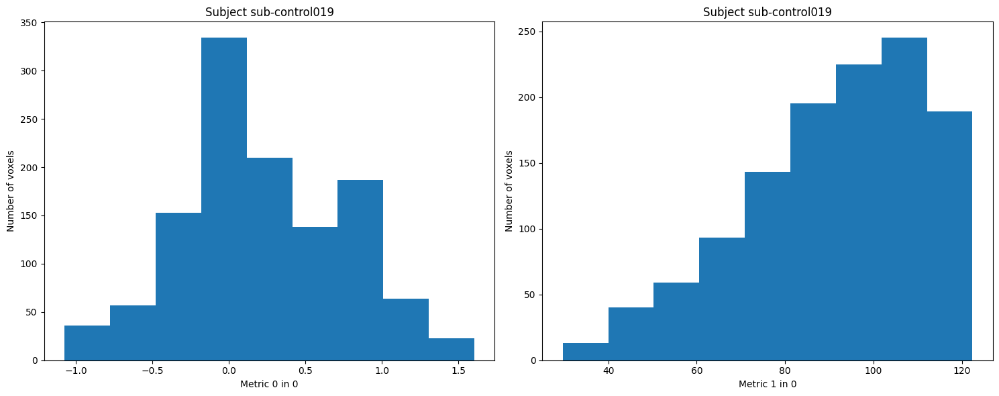

/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:134: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:151: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:163: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


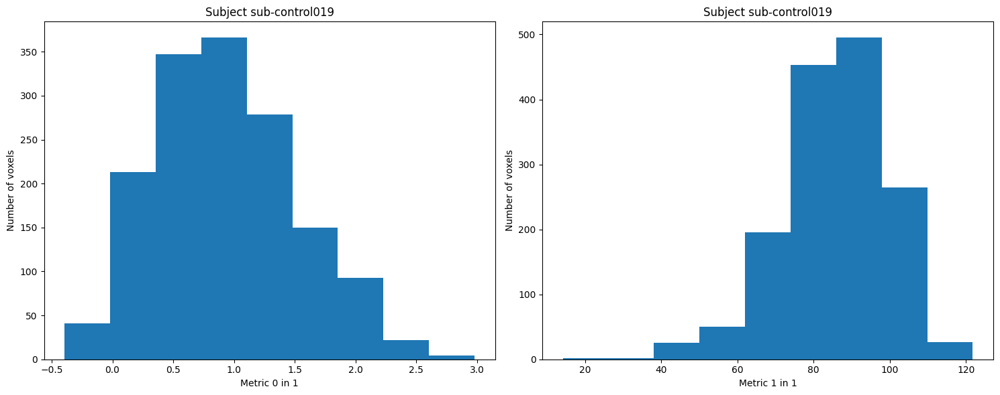

/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:185: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:190: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:179: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


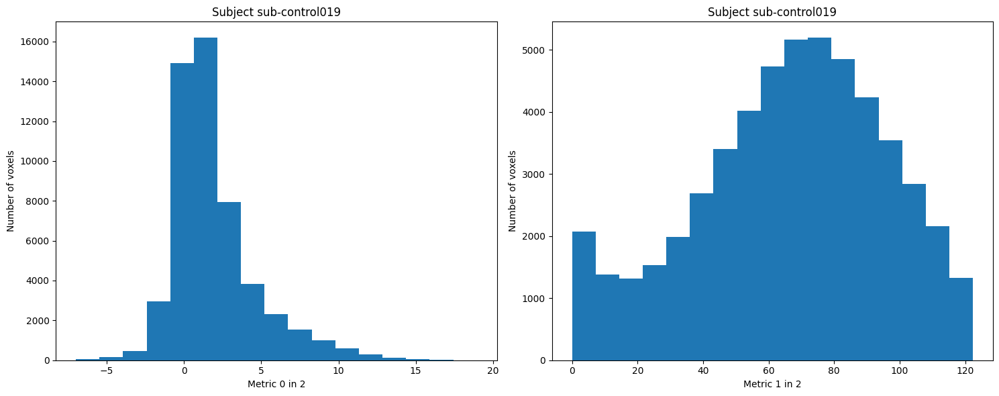

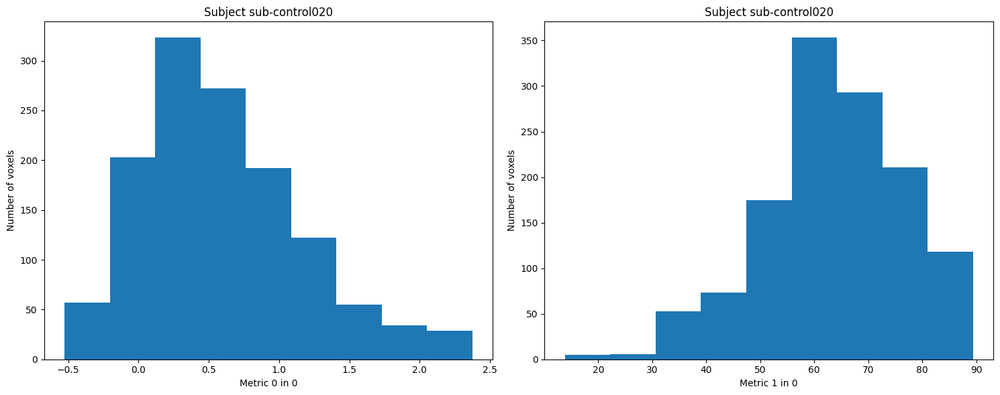

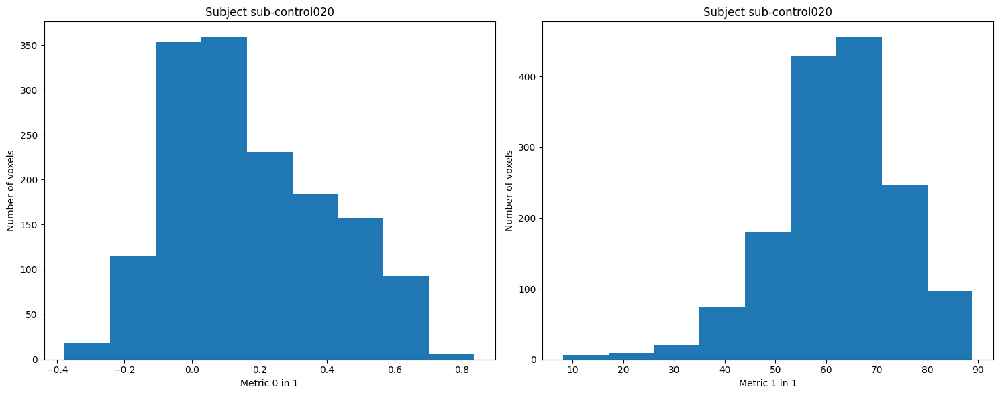

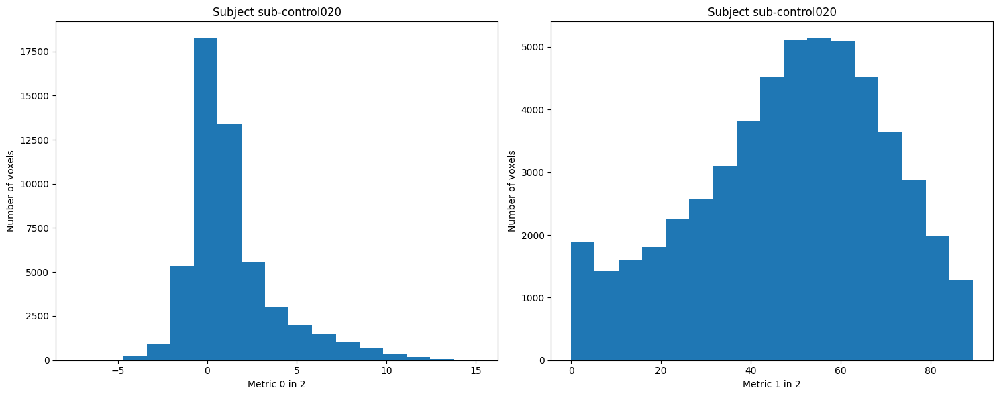

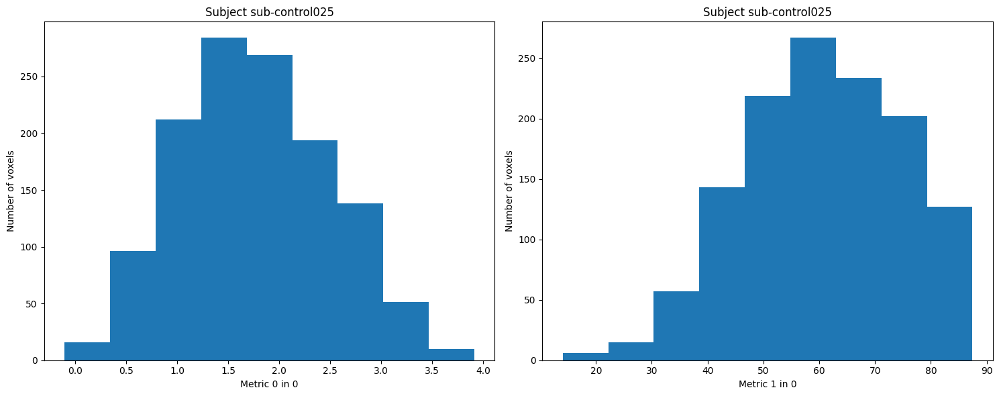

...

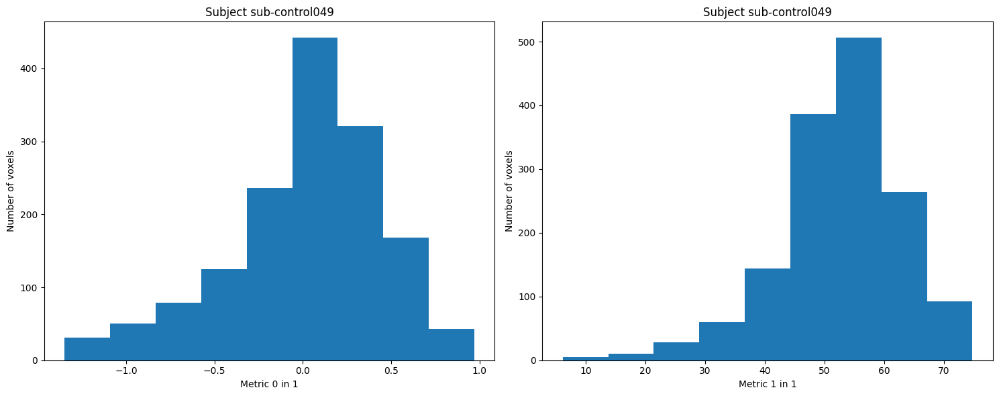

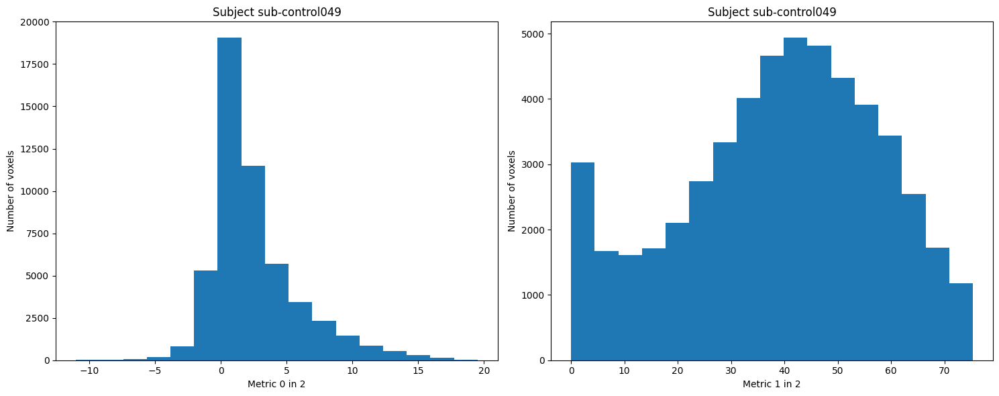

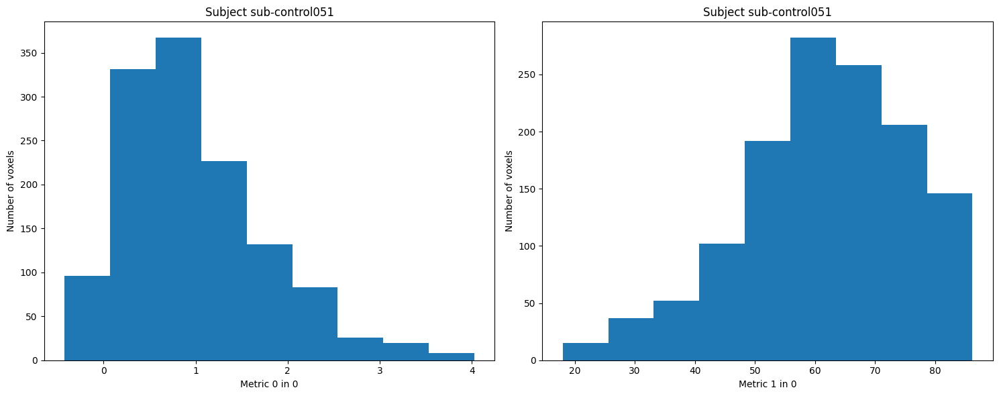

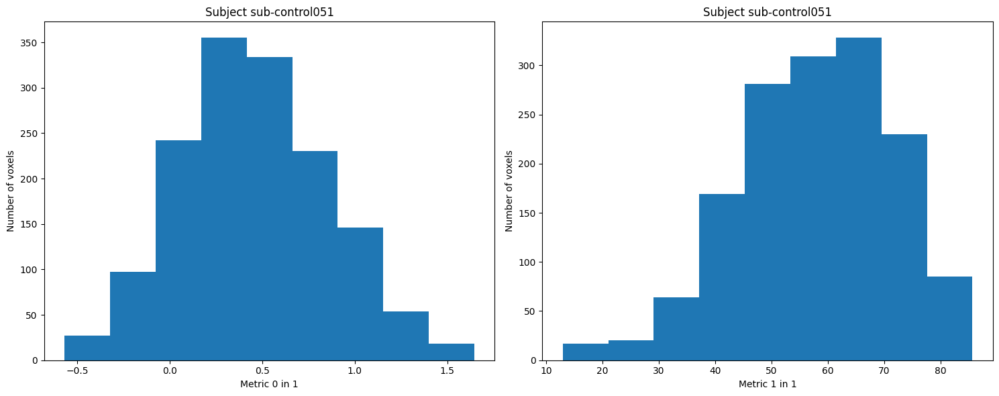

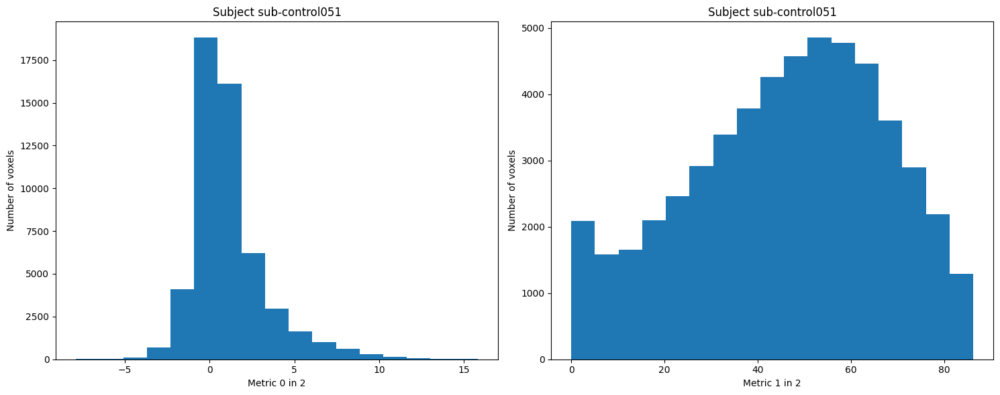

In [87]:
ASLnbinhappypremens,ASLnbinangrypremens,ASLnbinvispremens, ASLmeanhpremens, ASLmeanapremens, ASLmeanvpremens = hist_spearman(neurowASL_premens,"ses-premenstrual","ASL")

In [88]:
coefs_premens = calc_spearman([ASLmeanhpremens,ASLmeanapremens,ASLmeanvpremens])
coefs_premensH = coefs_premens[0]
coefs_premensA = coefs_premens[1]
coefs_premensV = coefs_premens[2]

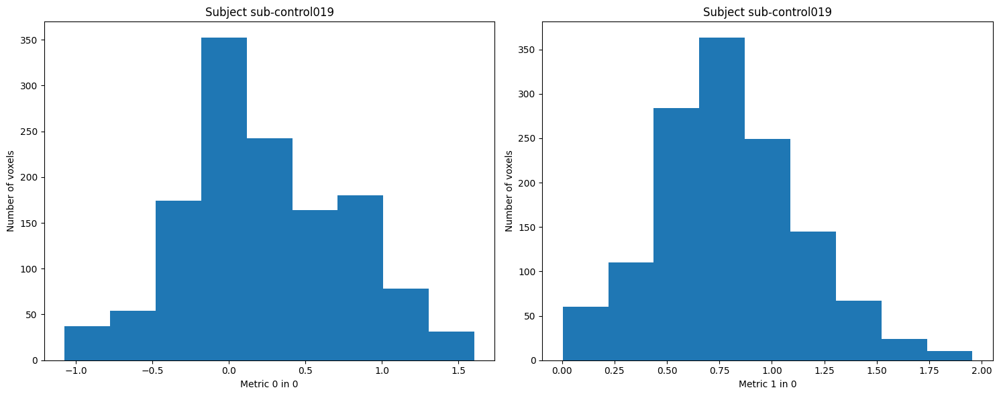

/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:134: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:151: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:163: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


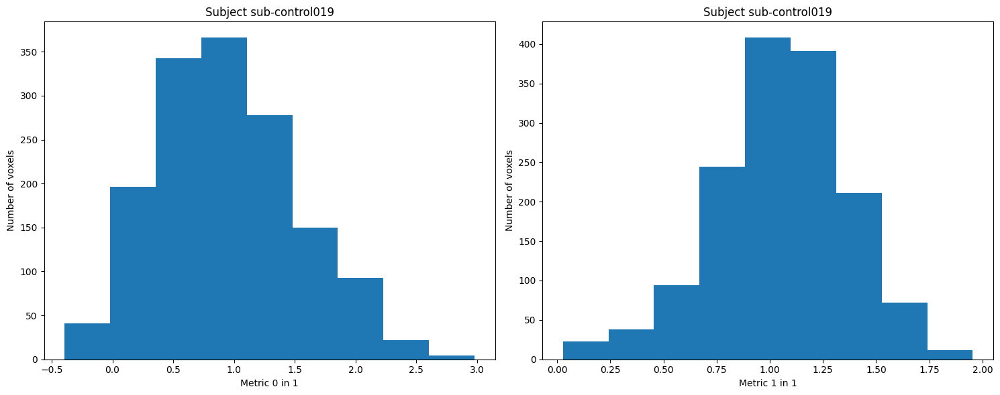

/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:185: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:190: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/home/bpereira/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:179: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


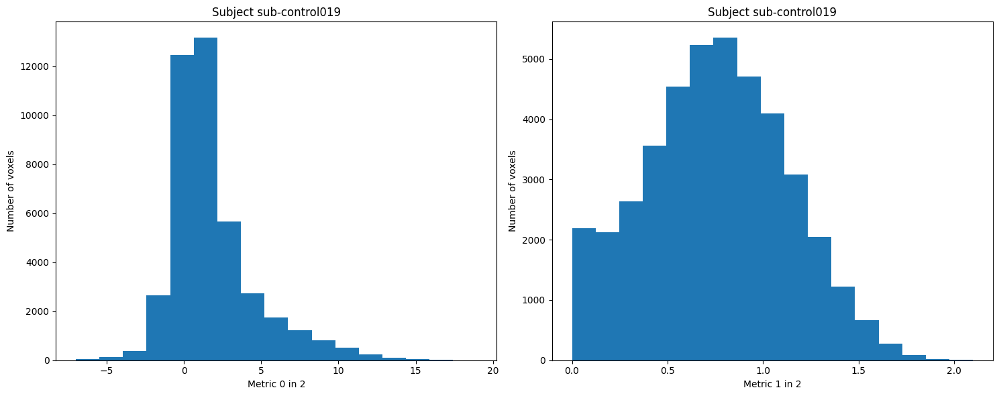

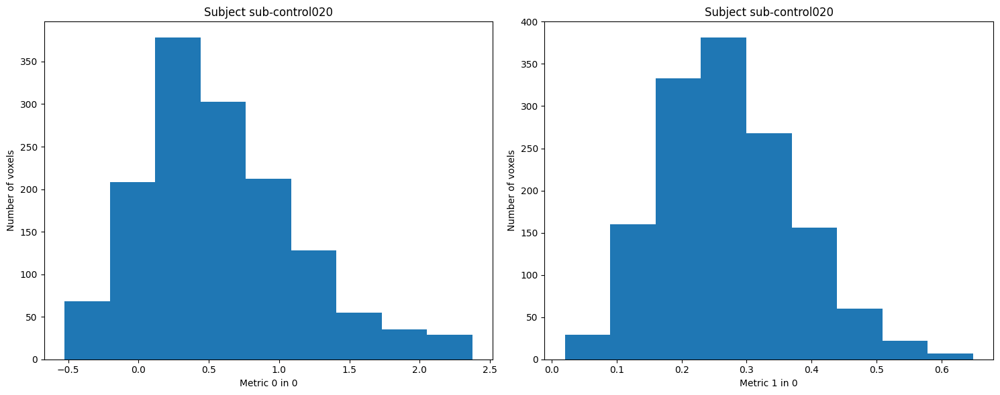

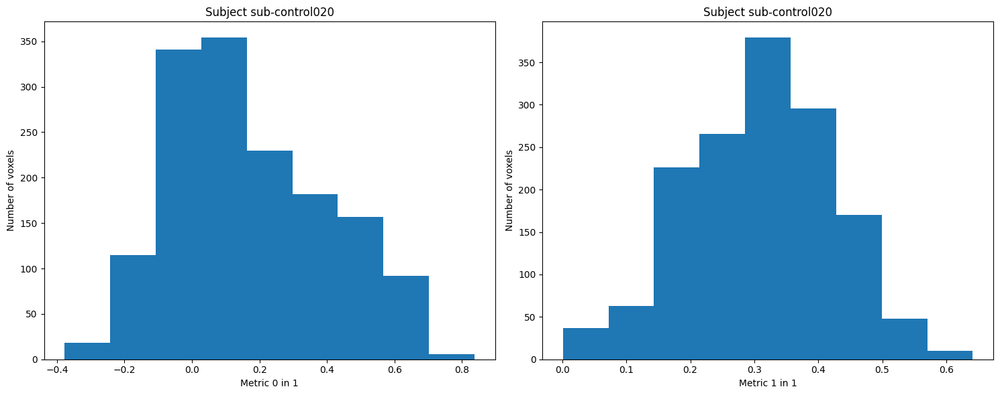

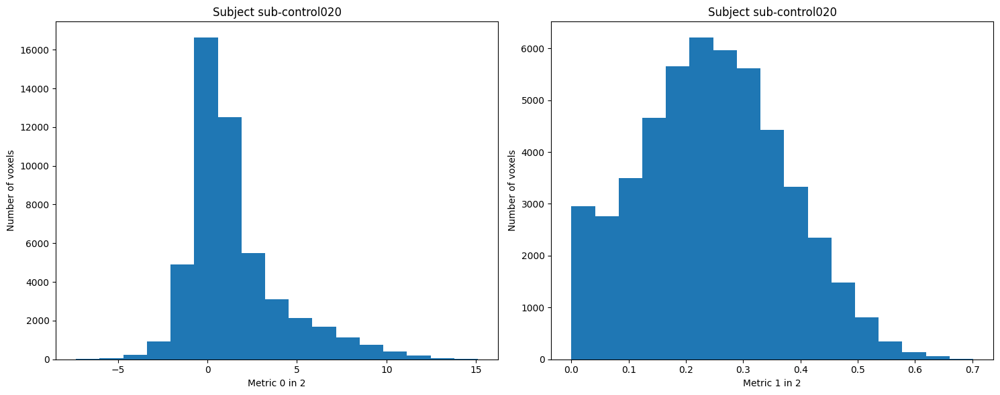

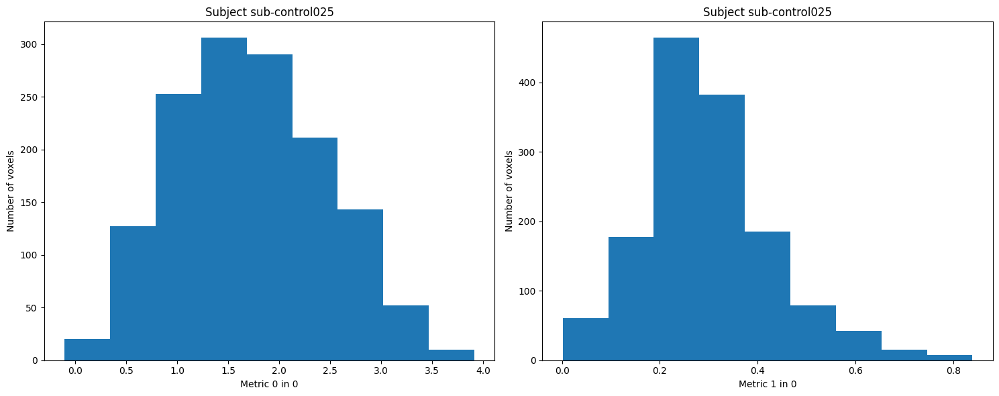

...

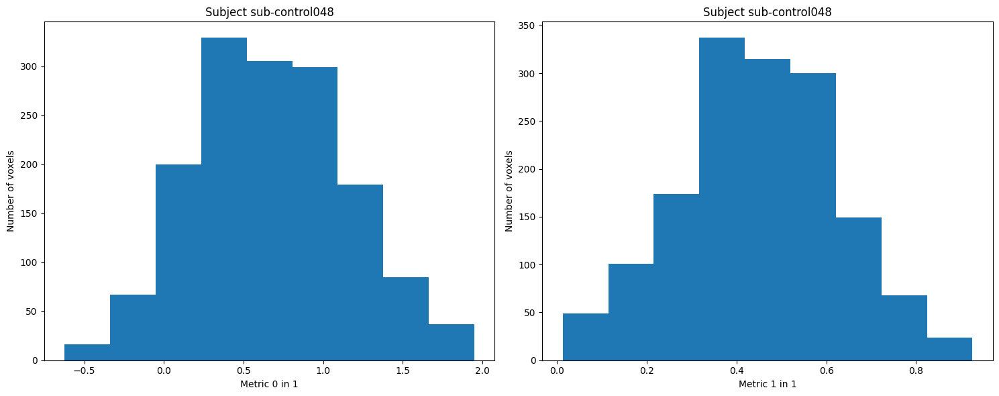

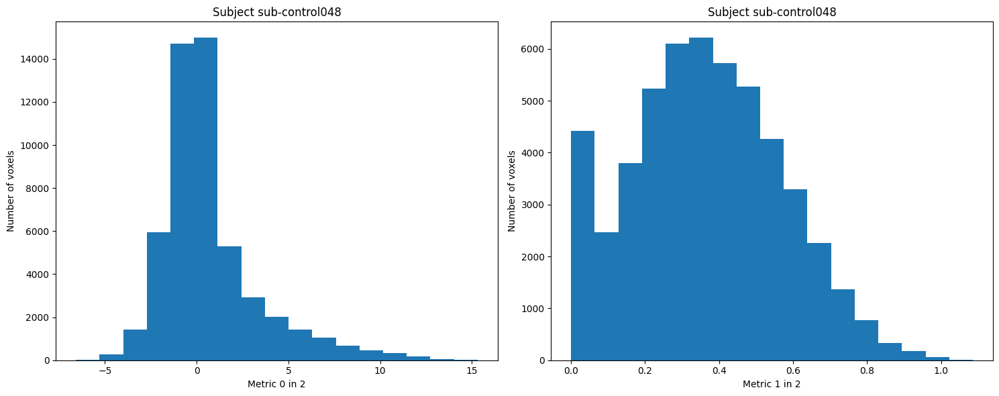

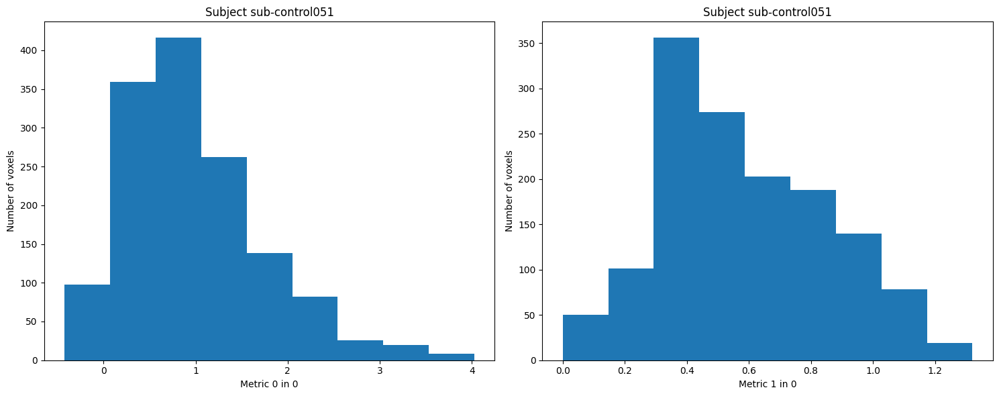

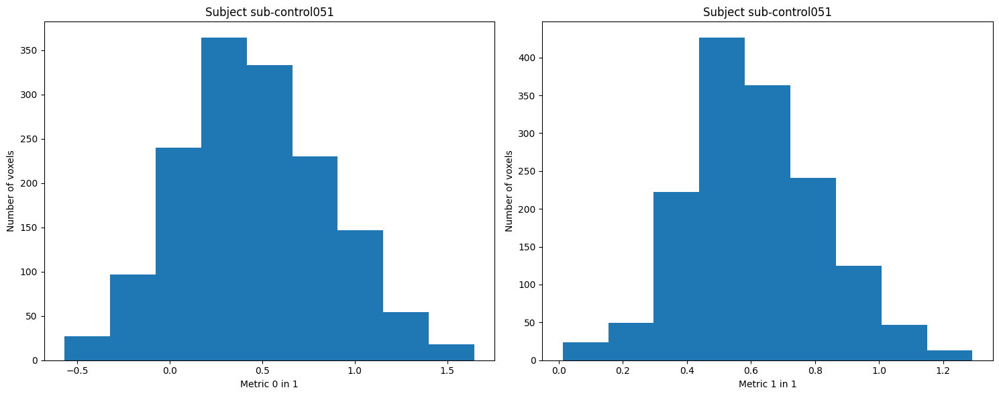

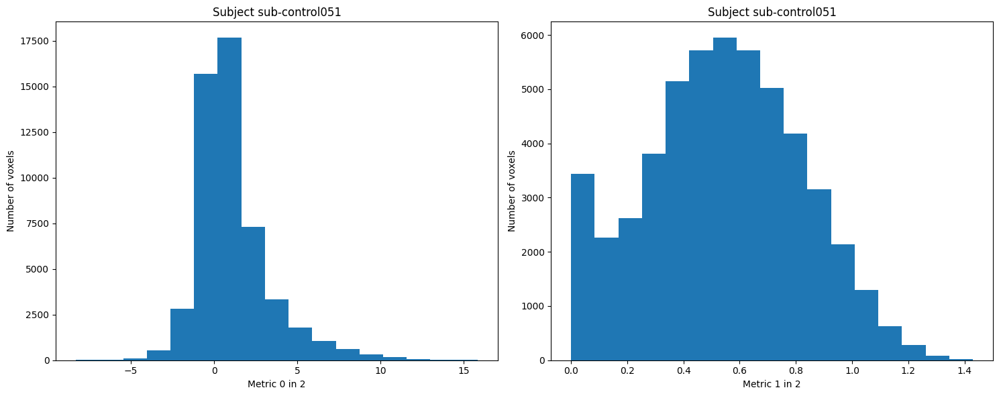

In [89]:
CVRnbinhappypremens, CVRnbinangrypremens, CVRnbinvispremens, CVRmeanhpremens, CVRmeanapremens, CVRmeanvpremens = hist_spearman(neurowCVR_premens, "ses-premenstrual", "CVR")

In [90]:
coefs_premensCVR = calc_spearman([CVRmeanhpremens,CVRmeanapremens,CVRmeanvpremens])
coefs_premensHCVR = coefs_premensCVR[0]
coefs_premensACVR = coefs_premensCVR[1]
coefs_premensVCVR = coefs_premensCVR[2]

# Plots

## Happy ASL

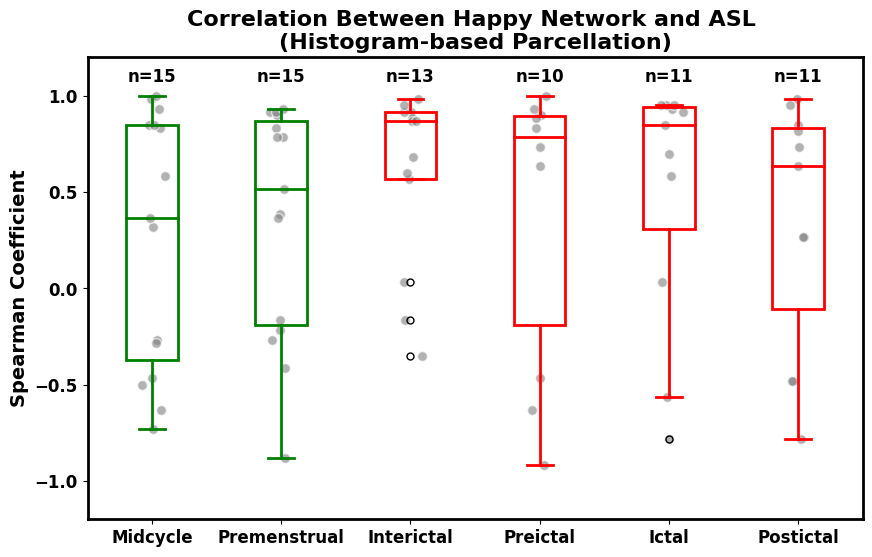

In [91]:
boxplots2_spearman([coefs_midH, coefs_premensH, coefs_intH, coefs_preictH, coefs_ictH, coefs_postictH],"Happy Network","ASL")

In [92]:
all_stats([coefs_midH, coefs_premensH, coefs_intH, coefs_preictH, coefs_ictH, coefs_postictH])

Midcycle vs Interictal (Welch): p-value = 0.12215
Premenstrual vs Preictal (Welch): p-value = 0.91360
Premenstrual vs Ictal (Welch): p-value = 0.57124
Premenstrual vs Postictal (Welch): p-value = 0.94288
Midcycle vs Premenstrual (Wilcoxon): p-value = 0.76154


[0.12214837832051594,
 0.9136031664675691,
 0.5712436876558062,
 0.9428816972783365,
 0.76153564453125]

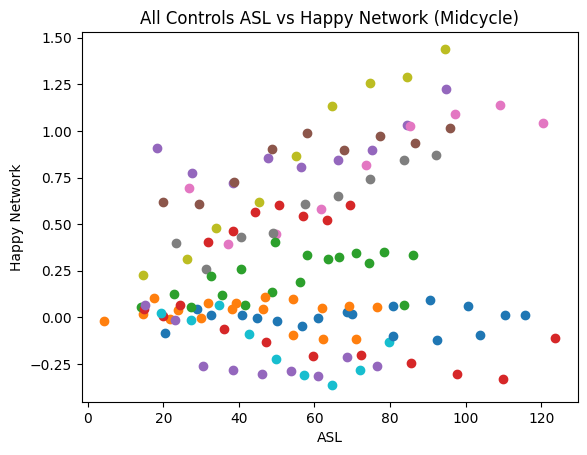

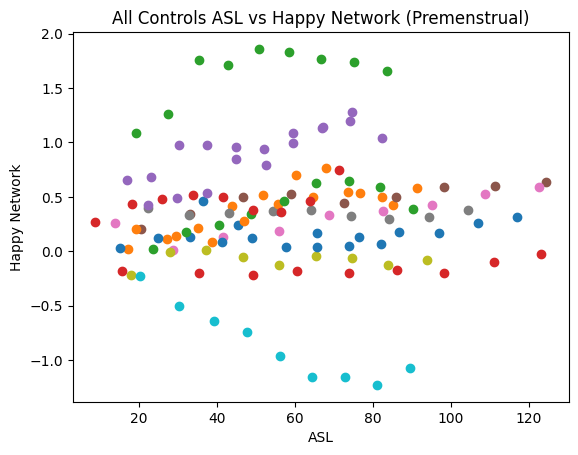

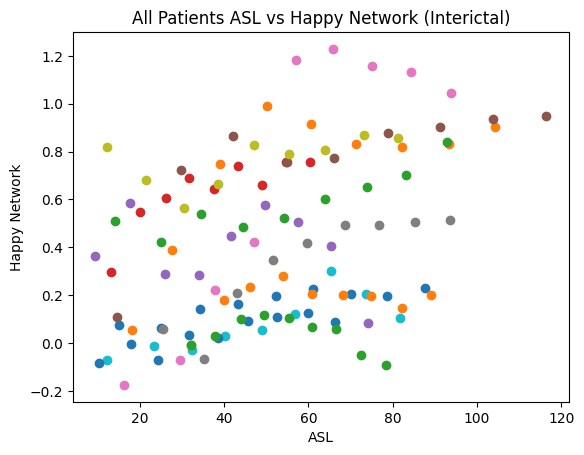

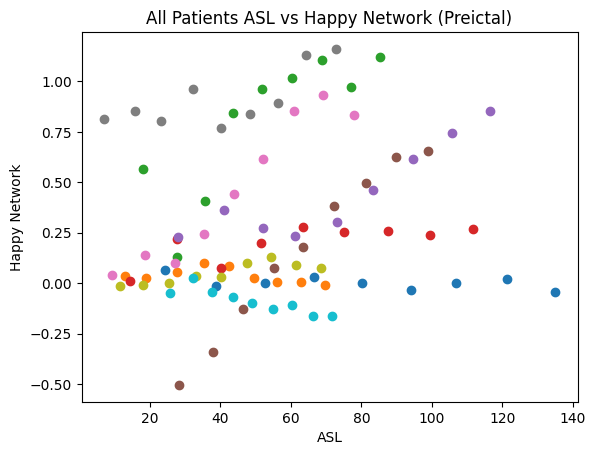

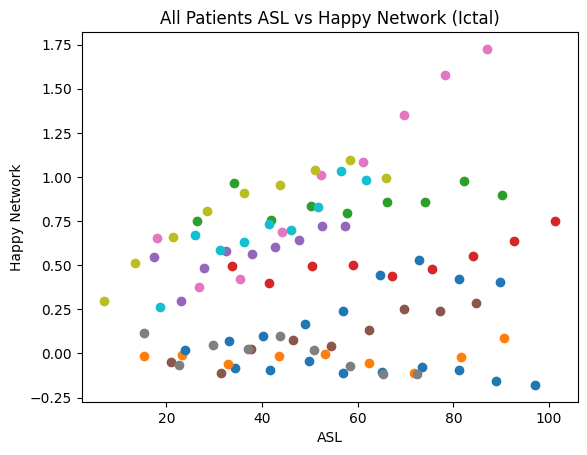

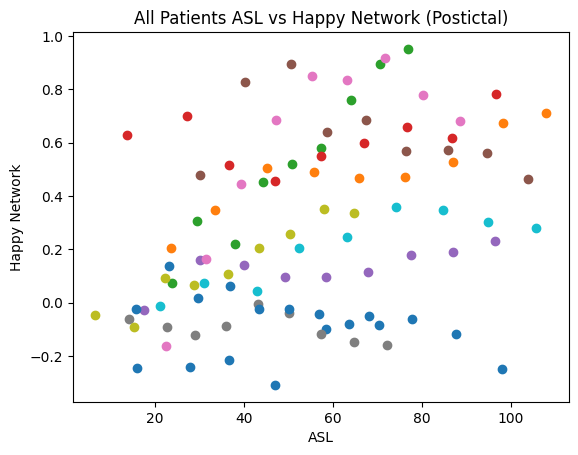

In [93]:
scatter(ASLmeanhmid,"Happy Network", "ASL", "Controls","Midcycle")
scatter(ASLmeanhpremens,"Happy Network","ASL","Controls", "Premenstrual")
scatter(ASLmeanhint,"Happy Network","ASL", "Patients","Interictal")
scatter(ASLmeanhpreict,"Happy Network","ASL", "Patients","Preictal")
scatter(ASLmeanhict,"Happy Network","ASL", "Patients","Ictal")
scatter(ASLmeanhpostict,"Happy Network","ASL","Patients","Postictal")

## Happy CVR

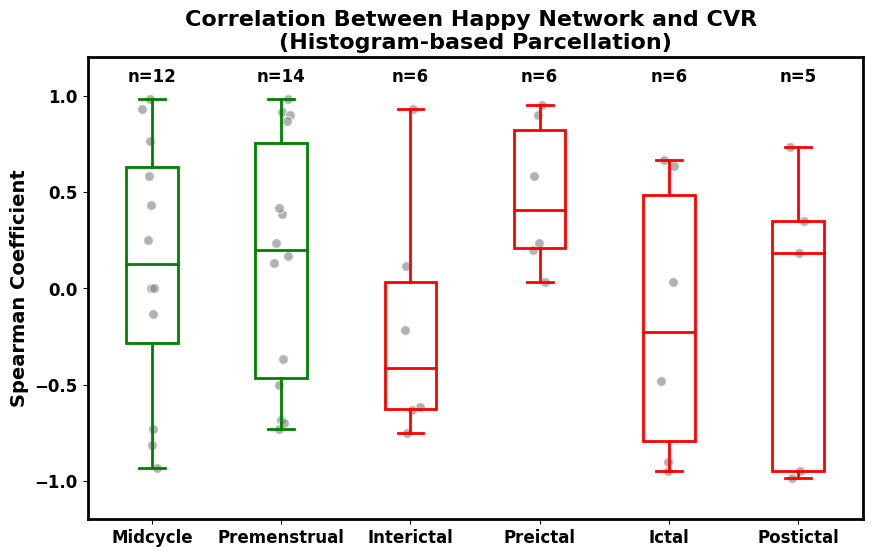

In [94]:
boxplots2_spearman([coefs_midHCVR, coefs_premensHCVR, coefs_intHCVR, coefs_preictHCVR, coefs_ictHCVR, coefs_postictHCVR],"Happy Network","CVR")

In [95]:
all_statsCVR([coefs_midHCVR, coefs_premensHCVR, coefs_intHCVR, coefs_preictHCVR, coefs_ictHCVR, coefs_postictHCVR])

Midcycle vs Interictal: p-value = 0.36961
Premenstrual vs Preictal: p-value = 0.24871
Premenstrual vs Ictal: p-value = 0.35226
Premenstrual vs Postictal: p-value = 0.44417
Midcycle vs Premenstrual: p-value = 0.89956


[0.36960770166344314,
 0.24871443868689053,
 0.3522564038904932,
 0.444170710695852,
 0.8995625799864772]

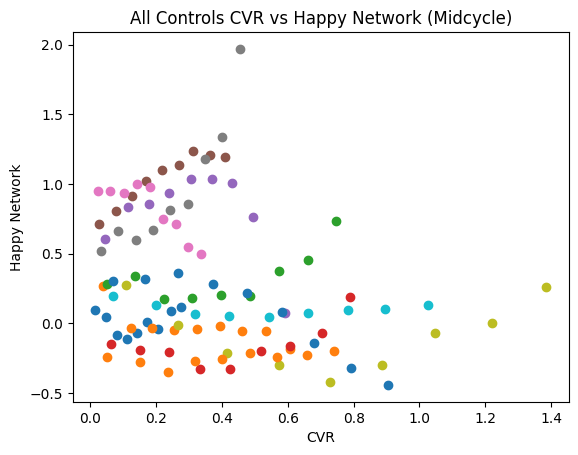

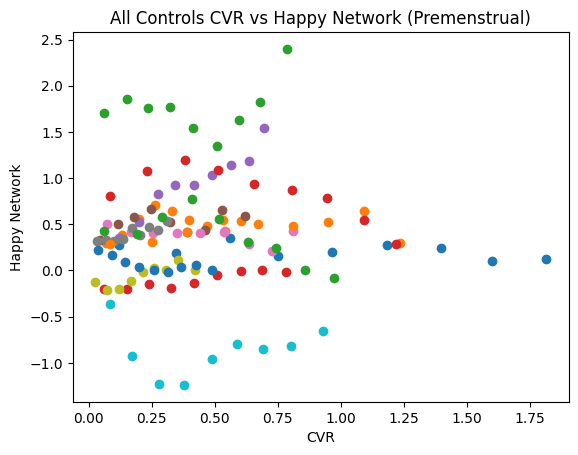

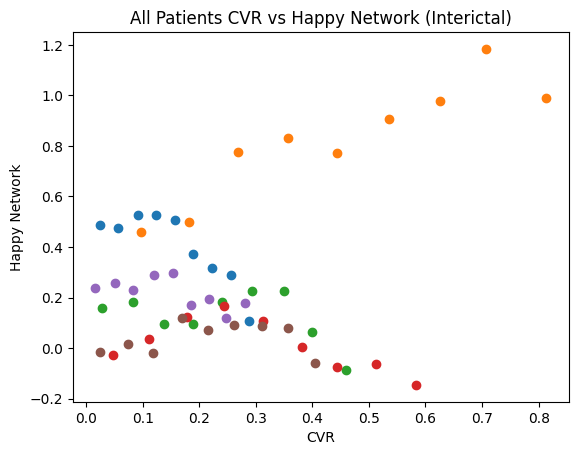

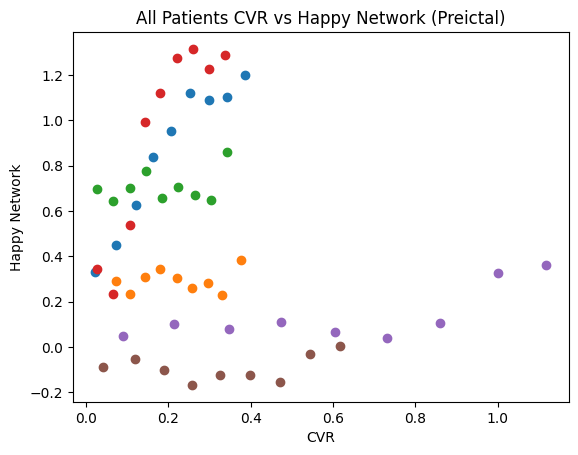

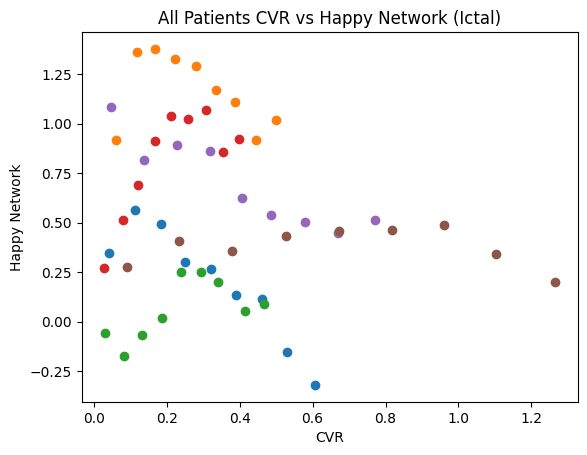

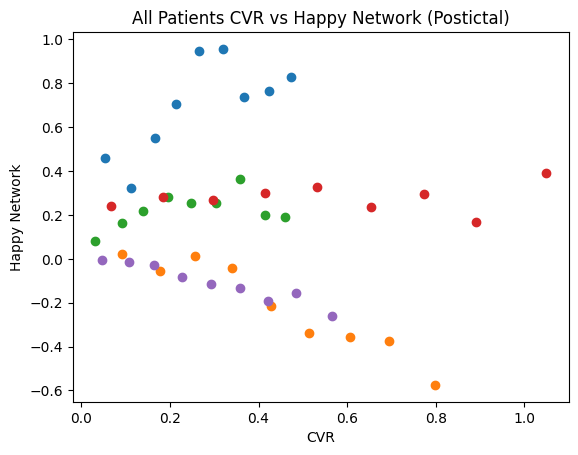

In [96]:
scatter(CVRmeanhmid,"Happy Network", "CVR", "Controls","Midcycle")
scatter(CVRmeanhpremens,"Happy Network","CVR", "Controls", "Premenstrual")
scatter(CVRmeanhint,"Happy Network","CVR","Patients","Interictal")
scatter(CVRmeanhpreict,"Happy Network","CVR","Patients","Preictal")
scatter(CVRmeanhict,"Happy Network","CVR", "Patients","Ictal")
scatter(CVRmeanhpostict,"Happy Network","CVR", "Patients","Postictal")

## Angry ASL

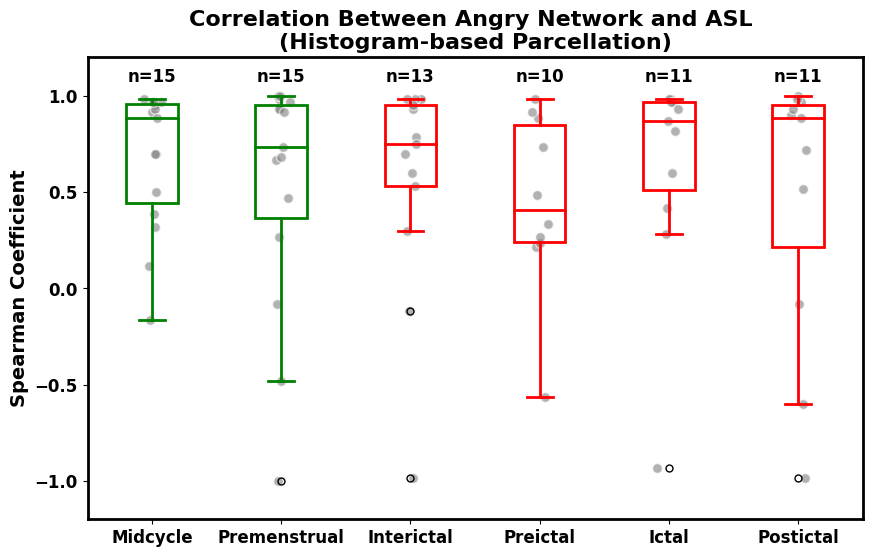

In [97]:
boxplots2_spearman([coefs_midA, coefs_premensA, coefs_intA, coefs_preictA, coefs_ictA, coefs_postictA],"Angry Network","ASL")

In [98]:
all_stats([coefs_midA, coefs_premensA, coefs_intA, coefs_preictA, coefs_ictA, coefs_postictA])

Midcycle vs Interictal (Welch): p-value = 0.57178
Premenstrual vs Preictal (Welch): p-value = 0.70102
Premenstrual vs Ictal (Welch): p-value = 0.69259
Premenstrual vs Postictal (Welch): p-value = 0.83339
Midcycle vs Premenstrual (Wilcoxon): p-value = 0.71973


[0.5717780871560921,
 0.7010209541943899,
 0.6925871582844625,
 0.8333879576226958,
 0.7197265625]

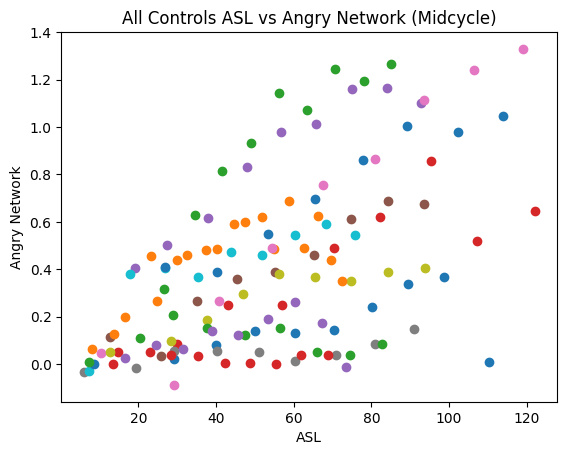

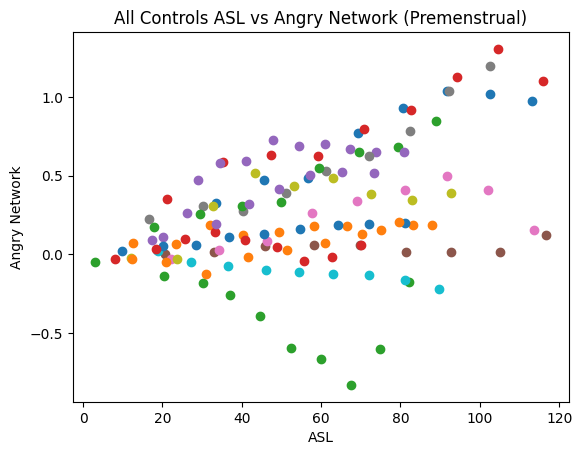

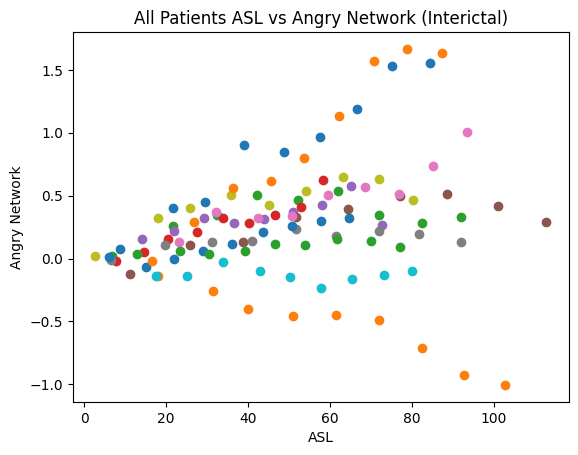

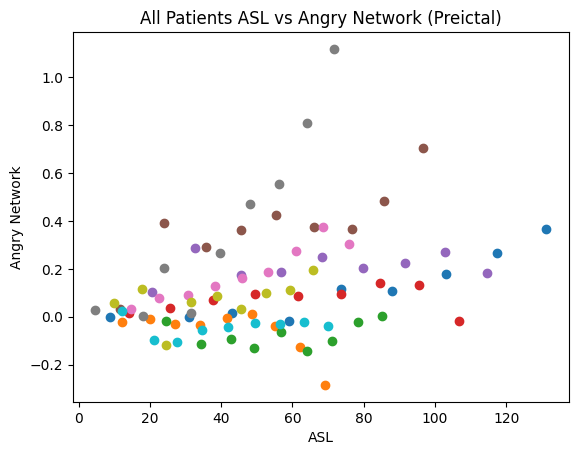

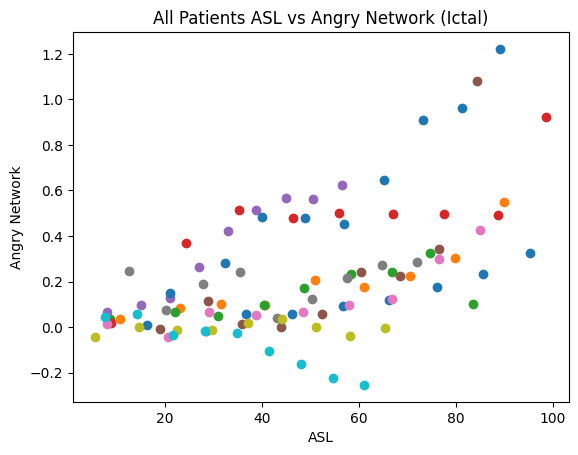

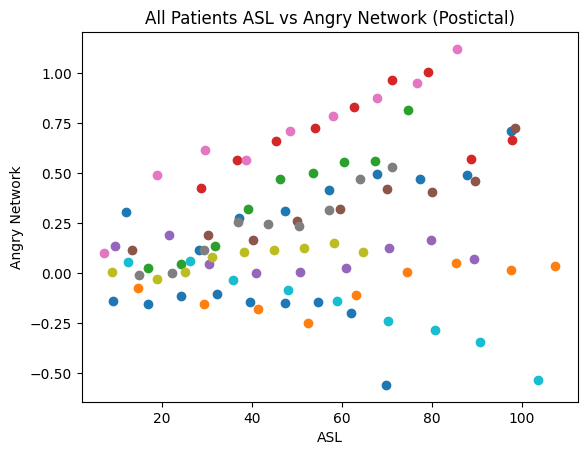

In [99]:
scatter(ASLmeanamid,"Angry Network", "ASL","Controls","Midcycle")
scatter(ASLmeanapremens,"Angry Network","ASL", "Controls", "Premenstrual")
scatter(ASLmeanaint,"Angry Network","ASL", "Patients","Interictal")
scatter(ASLmeanapreict,"Angry Network","ASL", "Patients","Preictal")
scatter(ASLmeanaict,"Angry Network","ASL", "Patients","Ictal")
scatter(ASLmeanapostict,"Angry Network","ASL", "Patients","Postictal")

## Angry CVR

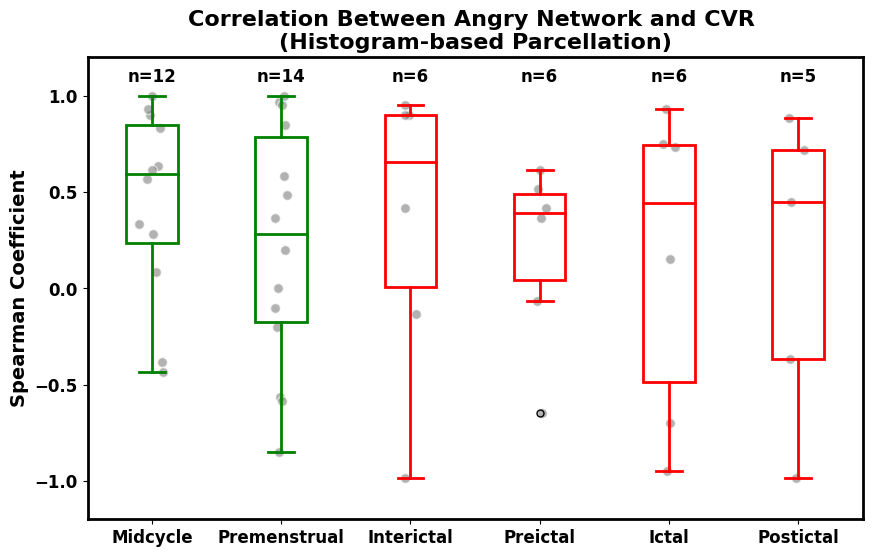

In [100]:
boxplots2_spearman([coefs_midACVR, coefs_premensACVR, coefs_intACVR, coefs_preictACVR, coefs_ictACVR, coefs_postictACVR],"Angry Network","CVR")

In [101]:
all_statsCVR([coefs_midACVR, coefs_premensACVR, coefs_intACVR, coefs_preictACVR, coefs_ictACVR, coefs_postictACVR])

Midcycle vs Interictal: p-value = 0.72567
Premenstrual vs Preictal: p-value = 0.94117
Premenstrual vs Ictal: p-value = 0.83820
Premenstrual vs Postictal: p-value = 0.81743
Midcycle vs Premenstrual: p-value = 0.31998


[0.7256714429575974,
 0.9411656760083134,
 0.8382030340844305,
 0.8174337784483783,
 0.31998133850026156]

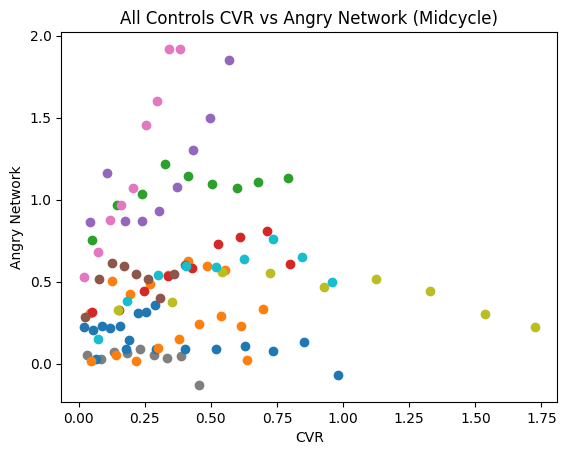

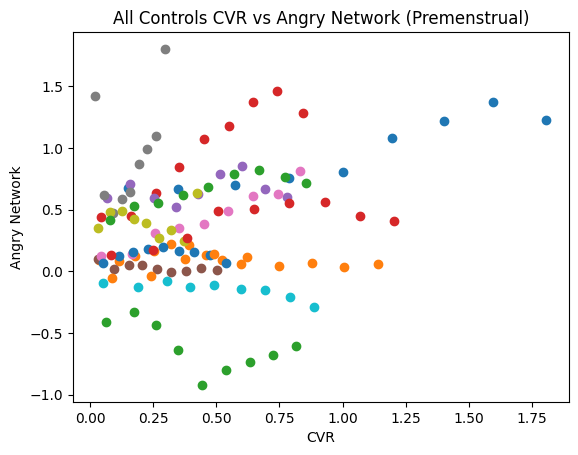

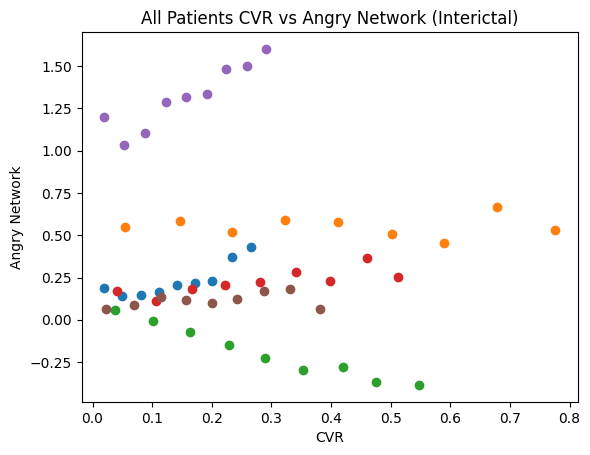

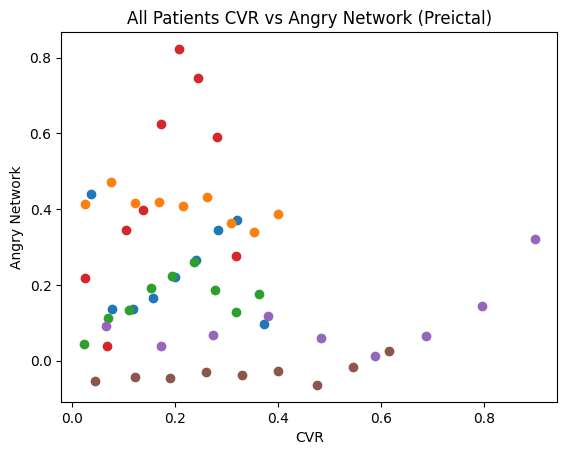

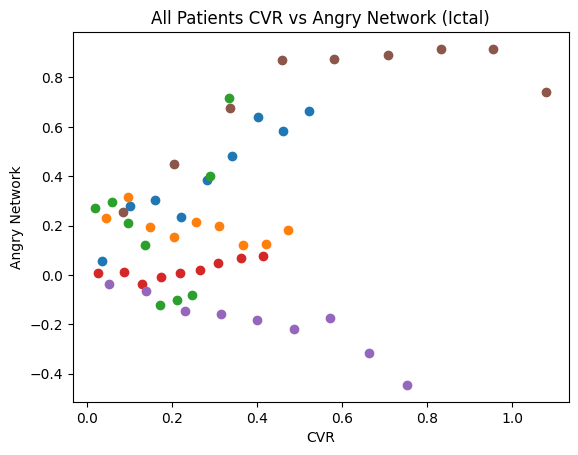

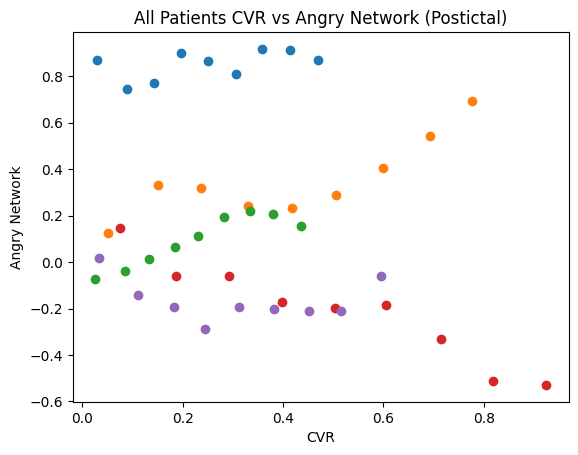

In [102]:
scatter(CVRmeanamid,"Angry Network", "CVR", "Controls","Midcycle")
scatter(CVRmeanapremens,"Angry Network","CVR", "Controls", "Premenstrual")
scatter(CVRmeanaint,"Angry Network","CVR", "Patients","Interictal")
scatter(CVRmeanapreict,"Angry Network","CVR", "Patients","Preictal")
scatter(CVRmeanaict,"Angry Network","CVR", "Patients","Ictal")
scatter(CVRmeanapostict,"Angry Network","CVR", "Patients","Postictal")

## Visual ASL

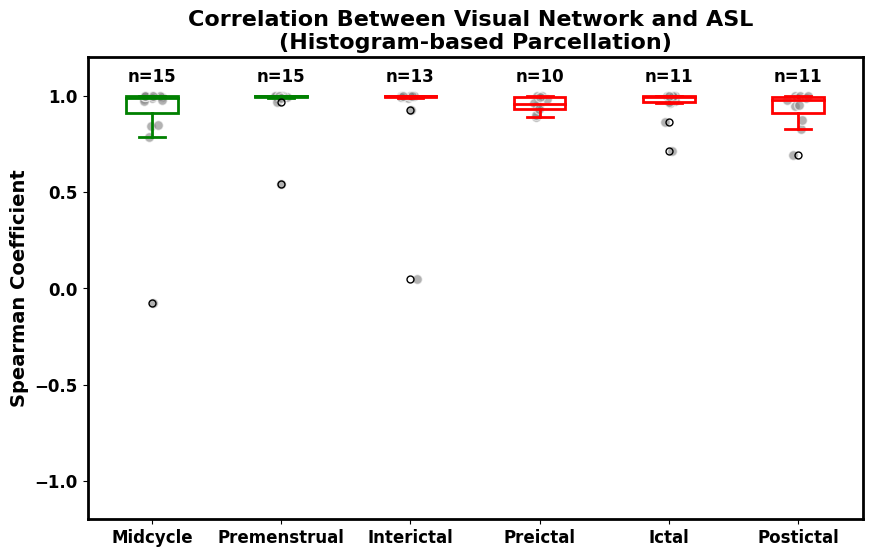

In [103]:
boxplots2_spearman([coefs_midV, coefs_premensV, coefs_intV, coefs_preictV, coefs_ictV, coefs_postictV],"Visual Network","ASL")

In [104]:
all_stats([coefs_midV, coefs_premensV, coefs_intV, coefs_preictV, coefs_ictV, coefs_postictV])

Midcycle vs Interictal (Welch): p-value = 0.75734
Premenstrual vs Preictal (Welch): p-value = 0.78669
Premenstrual vs Ictal (Welch): p-value = 0.74927
Premenstrual vs Postictal (Welch): p-value = 0.43583
Midcycle vs Premenstrual (Wilcoxon): p-value = 0.01093


/home/bpereira/.venv/lib/python3.7/site-packages/scipy/stats/morestats.py:3141: UserWarning: Exact p-value calculation does not work if there are ties. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


[0.7573443350362651,
 0.7866862450738954,
 0.749271372460385,
 0.43583453144404205,
 0.010929147566890627]

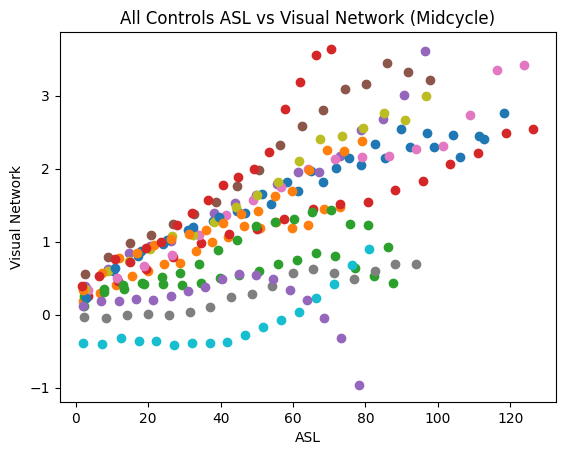

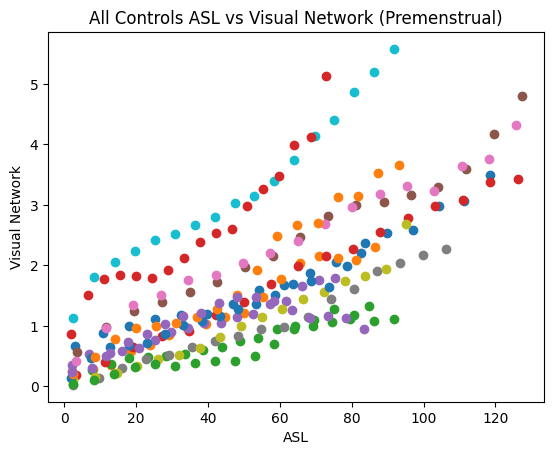

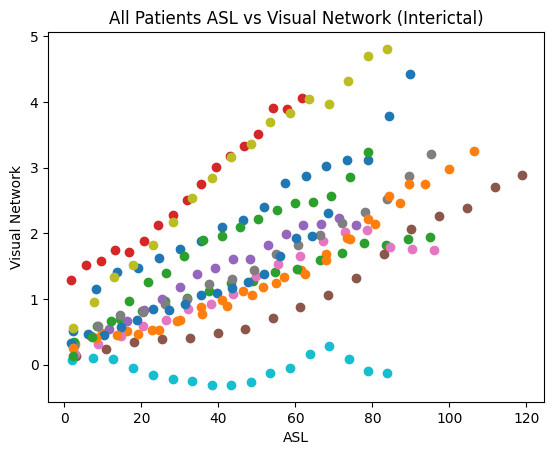

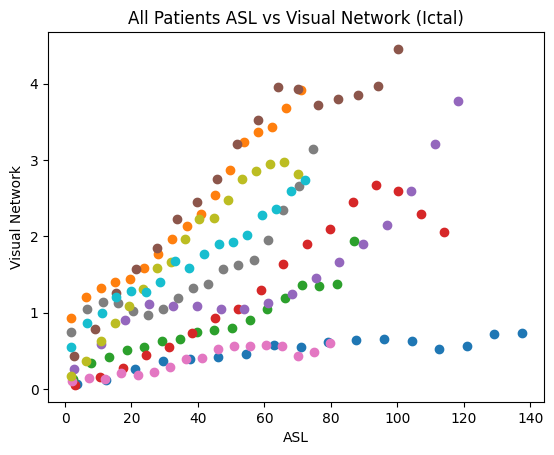

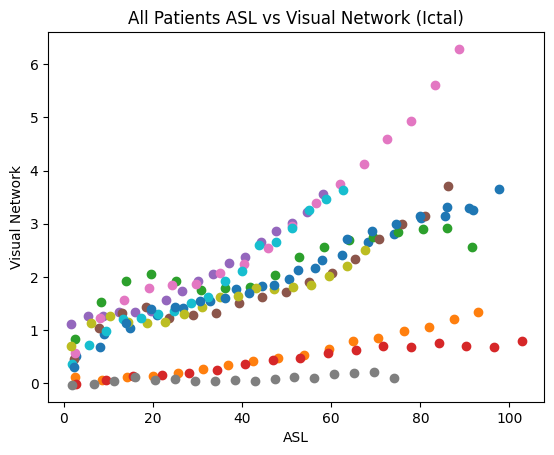

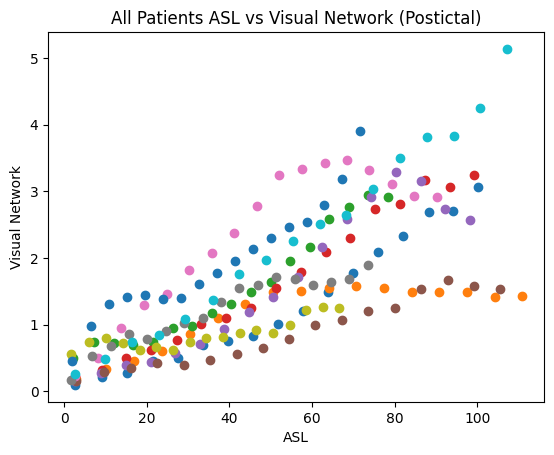

In [105]:
scatter(ASLmeanvmid,"Visual Network", "ASL", "Controls","Midcycle")
scatter(ASLmeanvpremens,"Visual Network","ASL", "Controls", "Premenstrual")
scatter(ASLmeanvint,"Visual Network","ASL","Patients","Interictal")
scatter(ASLmeanvpreict,"Visual Network","ASL", "Patients","Ictal")
scatter(ASLmeanvict,"Visual Network","ASL", "Patients","Ictal")
scatter(ASLmeanvpostict,"Visual Network","ASL", "Patients","Postictal")

## Visual CVR

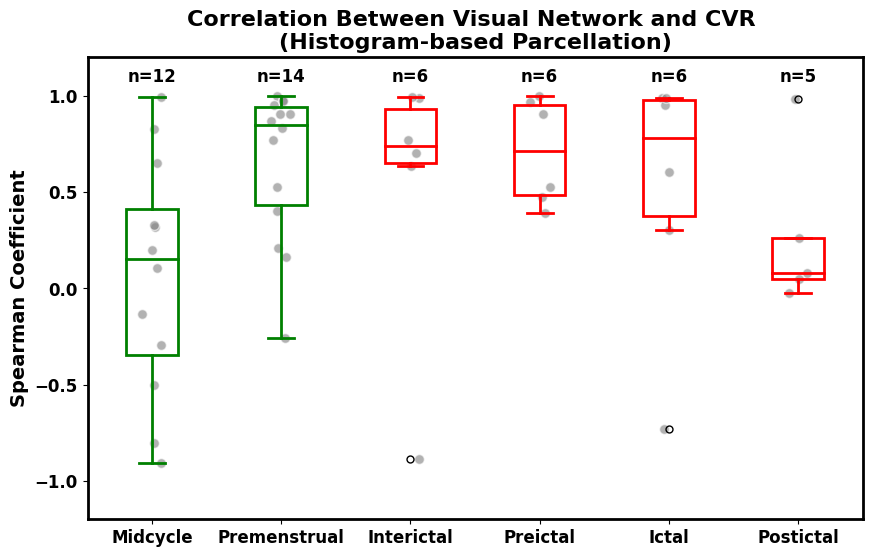

In [106]:
boxplots2_spearman([coefs_midVCVR, coefs_premensVCVR, coefs_intVCVR, coefs_preictVCVR, coefs_ictVCVR, coefs_postictVCVR],"Visual Network","CVR")

In [107]:
all_statsCVR([coefs_midVCVR, coefs_premensVCVR, coefs_intVCVR, coefs_preictVCVR, coefs_ictVCVR, coefs_postictVCVR])

Midcycle vs Interictal (Welch): p-value = 0.20226
Premenstrual vs Preictal (Welch): p-value = 0.74773
Premenstrual vs Ictal (Welch): p-value = 0.64423
Premenstrual vs Postictal (Welch): p-value = 0.11029
Midcycle vs Premenstrual (Welch): p-value = 0.00977


[0.20226404072249185,
 0.7477277512283486,
 0.6442263698318493,
 0.110286093387489,
 0.009774935694931475]

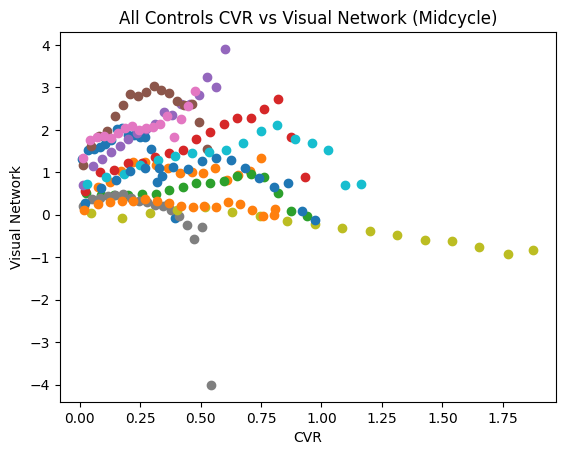

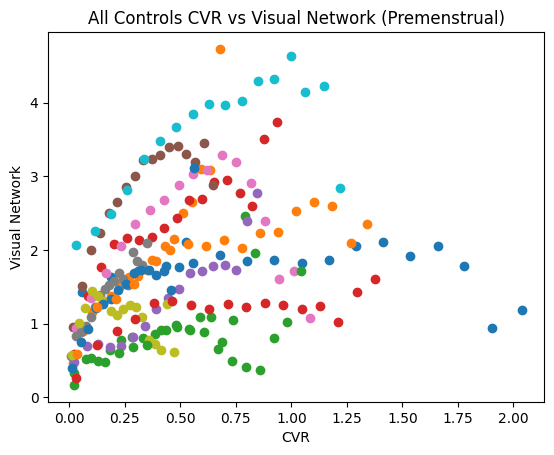

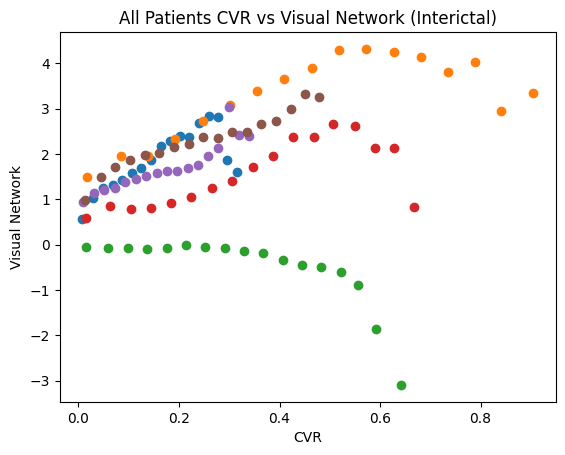

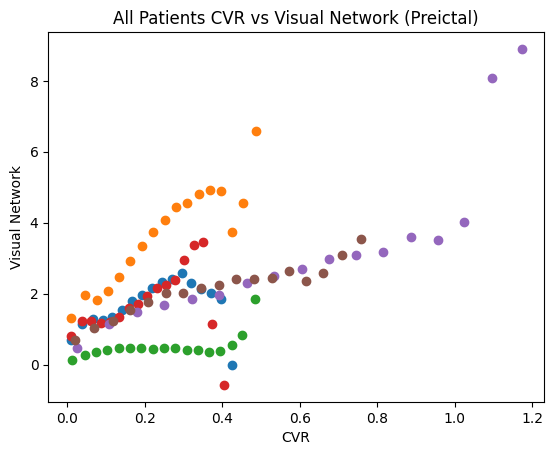

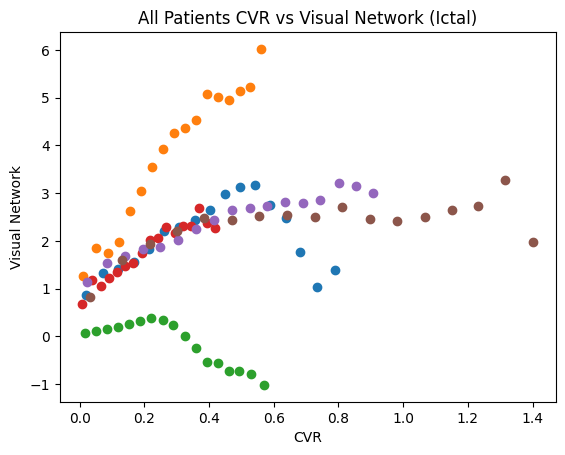

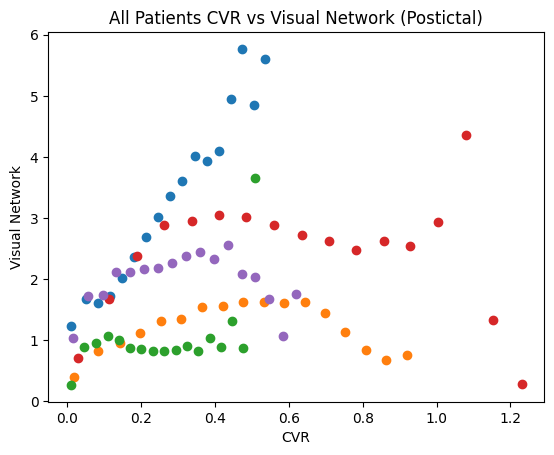

In [108]:
scatter(CVRmeanvmid,"Visual Network", "CVR", "Controls","Midcycle")
scatter(CVRmeanvpremens,"Visual Network","CVR", "Controls", "Premenstrual")
scatter(CVRmeanvint,"Visual Network","CVR", "Patients","Interictal")
scatter(CVRmeanvpreict,"Visual Network","CVR", "Patients","Preictal")
scatter(CVRmeanvict,"Visual Network","CVR", "Patients","Ictal")
scatter(CVRmeanvpostict,"Visual Network","CVR", "Patients","Postictal")